# 5. Backtesting
In this section, we will aggregate what we have done so far. We will adopt a *dynamic rebalancing* method during our backtesting period. First, we define some important periods.

1. PCA estimation period: 180 days. First estimation period is from 2022-01-01 to 2022-07-01. Trading universe is extracted based on date 2022-07-01 (T-1, where T is trading date).
2. Auxliary Series estimation period: 60 days. First estimation period is from 2022-07-01 - 60 days to 2022-07-01. We also generate our hedging ratios.
3. OU Process esimtation period: 60 days. Same as above.
4. Validation Period: Period in which we optimize our s-score thresholds. From 2022-07-02 to 2023-01-01. six months.
5. Test Period: This will be our final backtesting date where we measure performance of our strategy. From 2023-01-02 to 2024-08-05. More than one and a half year.

##### Backtesting high-level procedure
1. On our first PCA rebal date, extract trading universe based on that date (2022-07-01 will be first rebal date), retrieve price data, convert to returns, conduct PCA, vol-weight top five eigenvectors (Q matrix), and matrix multiply to get top five eigenportfolio return matrix.
2. Conduct regression of each coin return on five eigenportfolios (set window size as 90 days). Save hedge ratios (and drift if necessary), residual return series, and auxiliary series (cumulative sum series of residuals)
3. Estimate OU process for all coins. Extract coins whose mean reversion time is less than 7/365. Compute (modified) s-score series of length 60. Note that for estimating OU process, we extract most recent 60 observations of our auxiliary series
4. Determine whether to long-short the next day based on last value of auxiliary series. There are several methods to capture the signal.
    - Long or short the stat-arb portfolio $k$, where $k$ denotes the mean-reverting coin we obtained from 3. If total capital is 100,000 usd, allocate $\omega_k \times 100,000$ to stat-arb portfolio $k$. $\Sigma_{i=1}^{n(p_t)} \omega_i = 1$, where $n(p_t)$ is the *number of coins in trading universe generated at time t*. For capital allocated to stat-arb portfolio $k$, we employ leverage of amount $1 + \Sigma_{j=1}^5| \beta_{k,j}|$ Hold until next signal is generated. 
    - Similar to above method, but this time we aim to exactly replicate payoff implied by residual returns. Thus, we rebalance each day to maintain same dollar ratio.
5. Again more than one method.
    - If we choose to not rebalance our position each day: After close of next day, we use *same eigenportfolio return matrix* and *same hedge ratio* to compute residual return. Compute updated auxiliary series value, corresponding (modified) s-score, and then decide whether to long or short.
        - After close of next day, we conduct a rolling regression with fixed window, but one day moved forward. We obtain new hedge ratios (betas), new residual series and thus new auxiliary series, and then new estimates for the OU parameters. This will sometimes lead to $\tau_i < \tau_{threshold}$. In this case, we reject the model and either 1) don't open new trades or 2) close all open trades. This follows convention of the original paper.
    - If choose to rebalance every day: After close of next day, we use *same eigenportfolio return matrix* to extract *new hedge ratios* and thus new auxiliary series. We also estimate OU process again, obtaining new parameter estimates. If $\tau_{i,new}$ indicates there is new coin displaying mean reversion behavior, we compute its (mod) s-score series and generate trading signal for next day (if there is one). If mean-reversion parameter estimate implies one of the coins in $mrl_{old}$ should be excluded, we can either 1) close position regarding that coin immediately, regardless of pnl, or 2) use a counting system that essentially acts as time-stop. We also obtain new $m_i$ and $\sigma_{eq,i}$, and then compute (mod) s-score series. Then, extract last value of s-score series and append to our original s-score series. See if it crosses any threshold.
      - If we choose system 2), then we close the position on the day count == 7, which means that the coin was excluded from $mrl_{new}$ for 7 consecutive days, and so we can conclude that probability of committing type II error is small. Moreover, to open positions, we require not only the 
      - System 1) is a more straightforward method. Basically, if coin is in $mrl_{new}$ and last value of (mod) s-score series crosses threshold($s_{bo}, s_{so}$), then we open a position. If either coin is not in $mrl_{new}$ or it is in $mrl_{new}$, position $\ne$ 1, and crosses a threhold to close position($s_{bc}, s_{sc}$), then we close the position regarding that coin. 
6. At start of every month, we extract new trading list, compute new eiegenportfolio returns, and thus new hedge ratios, auxiliary series, and OU process parameters. We close all positions at end of every month and open new positions.

  - **Alternative method 1:** we can initiate the new cycle at the 22nd day of using the same eigenportfolio returns. However, we only keep track of $mrl_t$ and s-score series but do not open trades. Also, while we don't close already open positions at the start of 22nd day, we also don't open any new trades according to the model. We initiate a time stop of 7 days and after 7 days all positions regarding the old eigenportfolio will be closed. On the 29th day, we open positions according to signal generated on 28th day based on our *new* eigenportfolios, and a new cycle of 21 days start.
    - There is risk of foregoing profitable trades since 1/4 of the trading period is considered to be "a dormant period". 
  - **Alternative method 2:** On last day of each month, we generate new eigenportfolio returns based on new trading universe, and open trades the next day (start of each month). Moreover, while we don't close already open positions, we also stop using signals from the previous model. Inititae a time stop of 7 days. Hence, there is an overlap of max 7 days at the start of each month. The trades generated by the new eigenportfolio will be called the *new parent portfolio* and the trades maintained from the old eigenportfolios *old parent portfolio*. 
    - This method trades continuously based on signals, so we don't "miss" any trade. However, due to the potential overlap of max 7 days at start of each month, keeping track of the system is much more difficult, and we need to consider how we should log our trade performance.

  **For sake of simplicity we will go with the first method, which is to exit all open trades end of each month.**

We will run the above backtest throughout the validation period using different sets of s-thresholds to optimize for performance. Then, using our fianl set of threshold hyperparameter, we will run our final backtest in the testing period, and then evaluate final trading performance.


#### Calculating equity curve
Recall 
Long or short the stat-arb portfolio $k$, where $k$ denotes the mean-reverting coin we obtained from 3. If total capital is 100,000 usd, allocate $\omega_k \times 100,000$ to stat-arb portfolio $k$. 

## Putting it all together

### Preparation 
Import necessary data, modules, libraries.

In [ ]:
import pandas as pd
import numpy as np
import os
from pathlib import Path
import json
import pickle
import pprint
import math
from tqdm import tqdm
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
import itertools

# Get the current working directory (Jupyter Notebook location)
notebook_dir = Path.cwd()
print("Notebook Directory:", notebook_dir)

# Define the data path relative to the notebooks folder
data_dir = notebook_dir.parent / "data"
print("Data Directory:", data_dir)


with open(data_dir / "target_dict.json", "r", encoding = "utf-8") as f:
  target_dict = json.load(f)

with open(data_dir / "parent_df.pkl", "rb") as g:
  parent_df = pickle.load(g)

# Check data is imported without a problem
print(target_dict["2022-07-01"])
parent_df.head()

Notebook Directory: c:\Users\idkup\Jay-coding-local\Python\PCA-in-Finance\notebooks
Data Directory: c:\Users\idkup\Jay-coding-local\Python\PCA-in-Finance\data
['algorand', 'avalanche', 'bitcoin', 'bitcoin-cash', 'bnb', 'cardano', 'chainlink', 'cosmos', 'cronos', 'dogecoin', 'ethereum', 'ftx-token', 'hex', 'litecoin', 'monero', 'near-protocol', 'polkadot-new', 'polygon', 'shiba-inu', 'solana', 'stellar', 'tron', 'uniswap', 'unus-sed-leo', 'xrp']


C:\Users\idkup\AppData\Local\Temp\ipykernel_32564\2310809327.py:31: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  parent_df = pickle.load(g)


,algorand,avalanche,bitcoin,bitcoin-cash,bnb,cardano,chainlink,cosmos,cronos,dogecoin,...,shiba-inu,solana,stacks,stellar,terra-luna,toncoin,tron,uniswap,unus-sed-leo,xrp
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-01-01,1.740108,114.158010,47686.811509,444.456189,527.352722,1.376975,20.665088,36.170463,0.585303,0.173035,...,0.000034,178.517941,2.283105,0.276335,91.360588,3.797868,0.076610,17.444497,3.803560,0.849472
2022-01-02,1.674041,113.186336,47345.220564,447.832642,531.396645,1.377584,21.831890,35.603454,0.587698,0.174403,...,0.000034,176.382841,2.391267,0.291703,89.371671,3.488948,0.077782,18.369281,3.779418,0.859118
2022-01-03,1.788210,108.145212,46458.116959,434.943840,512.135964,1.321637,23.573905,39.300069,0.567292,0.170088,...,0.000033,170.297747,2.297845,0.290181,88.748696,3.388726,0.077081,18.440538,3.795962,0.832885
2022-01-04,1.674683,103.239241,45897.575827,427.524334,507.506111,1.311658,23.525865,41.987126,0.551803,0.168803,...,0.000032,167.938906,2.348068,0.279667,84.581089,3.459638,0.076200,18.260072,3.783945,0.824673
2022-01-05,1.559897,97.852579,43569.003348,401.572519,475.056933,1.236002,25.447802,38.793359,0.504330,0.159420,...,0.000030,155.099733,2.244129,0.267280,78.593797,3.342235,0.071382,17.203540,3.801806,0.774358


In [5]:
class PrepareData:
  def __init__(self, current_date, rebal_date = None, window_size = 180, parent_df = parent_df, target_dict=target_dict, cheat = False):
    """
    dates are in str
    start_date in PrepareData class refers to the start date of PCA estimation. We specify it because we want to truncate the returns data before standardizing it.

    Parameters
    ----------
    current_date : str
      Date at which you want data to end
    rebal_date : date at which target universe is extracted ==> Dataframe fetched is based on tu extracted on rebal_date
    window_size : int
      Subtract from current_date to get start_date
    parent_df : pd.DataFrame
      df that contains price info of all coins for the entire data collection period
    cheat : boolean
      Default is false. If True, we collect price df from subsetting the parent_df. Used to reduce backtest time length.

      
    """
    self.target_dict = target_dict
    self.price_df = None
    self.parent_df = parent_df # dataframe of price for all coins used in the entire trading period
    self.return_df = None
    self.mean_ret = None
    self.sdv_ret = None
    self.standardized_return_df = None

    self.tu = None

    self.rebal_date_str = current_date if rebal_date is None else rebal_date
    self.rebal_date = pd.to_datetime(current_date) if rebal_date is None else pd.to_datetime(self.rebal_date_str)

      
    self.start_date = pd.to_datetime(current_date) - timedelta(days = window_size + 1) # Add 1 to account for loss in data from calculating return
    self.end_date = pd.to_datetime(current_date)
    self.end_date_str = current_date
    self.start_date_str = datetime.strftime(self.start_date, "%Y-%m-%d")

    self.get_trading_universe()

    # Cheat
    if cheat == True:
     self.price_df = parent_df.loc[self.start_date : self.end_date, self.tu]
        
      
    elif cheat == False:
      self.get_price()

    self.calculate_returns()
    self.calculate_std_returns()

  def get_trading_universe(self):
    """
    Get list of coins defined as trading universe of that date
    """
    
    date = self.end_date_str
    self.tu = self.target_dict[date] if self.rebal_date == self.end_date else self.target_dict[self.rebal_date_str]

  
    return self.tu 

  def get_price(self):
    """Fetch price df. Automatically fetches data for trading universe of that date
    
    Date Range: 20220101 ~ 20240805 ---> Truncate to start_date ~ end_date
    desired_date: str

    Returns
    nxp pd.DataFrame of prices for various coins. 
    """
    if self.end_date == self.rebal_date:
        end_date = self.end_date_str
        tc = self.target_dict[end_date]
        self.price_df = parent_df[tc]
        self.price_df = self.price_df.loc[self.start_date : self.end_date]
        
    elif self.end_date != self.rebal_date:
        end_date = self.rebal_date_str # Get price from most recent rebal date
        tc = self.target_dict[end_date]
        self.price_df = parent_df[tc]
        self.price_df = self.price_df.loc[self.start_date : self.end_date]
      
    return self.price_df 
  
  def calculate_returns(self):
    """
    Since we lose 1 data point from calculating returns, note 180 days from 20220102 is 20220701
    """
    if self.price_df is None:
          raise ValueError("Price data is not available. Fetch price data first.")
    self.return_df = self.price_df.pct_change().dropna()
    return self.return_df
  
  def calculate_std_returns(self):
    if self.return_df is None:
      raise ValueError("Return data is not available. Fetch price data first.")
    self.mean_ret = self.return_df.mean()
    self.sdv_ret = self.return_df.std()
    self.standardized_return_df = (self.return_df - self.mean_ret) / self.sdv_ret
    return self.standardized_return_df



In [6]:
class PerformPCA:
  def __init__(self, prepare_data_instance):
    self.prepare_date_instance = prepare_data_instance
    self.standardized_ret_df = prepare_data_instance.standardized_return_df
    self.ret_df = prepare_data_instance.return_df
    self.sdv_ret = prepare_data_instance.sdv_ret
    self.eigenvalues = None
    self.explained_variance_ratio = None
    self.cumulative_explained_variance_ratio = None
    self.n_components_80 = None
    self.Q = None # vol-weighted eigenportfolio weights
    self.eigportret_df = None
    self.get_eigenportfolio()

  
  def get_eigenportfolio(self):
    pca = PCA()
    pca.fit(self.standardized_ret_df)

    # Extract PCA outputs
    self.eigenvectors = pca.components_.T  # Each column is an eigenvector
    self.eigenvalues = pca.explained_variance_  # Eigenvalues of correlation matrix
    self.explained_variance_ratio = pca.explained_variance_ratio_
    self.cumulative_explained_variance_ratio = np.cumsum(self.explained_variance_ratio)

    # Determine the number of components needed to explain 80% of variance
    self.n_components_80 = np.argmax(self.cumulative_explained_variance_ratio >= 0.80) + 1 # argmax of boolean returns index of first true value

    Q = self.eigenvectors / self.sdv_ret.values[:, np.newaxis] # Broadcast appropriately

    # Normalize by 1
    Q /= abs(Q).sum(axis = 0, keepdims = True)
    Q = pd.DataFrame(Q).iloc[:, 0:5]
    Q.columns = [f"PC{i+1}" for i in range(5)] # five eigenportfolios
    self.Q = Q

    # Compute eigenportfolio returns using vol-weighting and take top 5 eigenportfolios
    eigportret_df = pd.DataFrame(self.ret_df @ self.Q.values)
    eigportret_df.columns = [f"PC{i+1}" for i in range(len(eigportret_df.columns))]
    self.eigportret_df = eigportret_df

    

    

In [7]:
# Class for conducting factor regressions
class FactorRegressionAndResidual:
    def __init__(self, prepare_data_instance, eigportret):
        """
        Initialize with instances of PrepareData and PerformPCA.
        Parameters:
        - prepare_data_instance: instance of PrepareData class.
        - pca_instance: instance of PerformPCA class.
        """
        # Use instances to access attributes
        self.coin_returns = prepare_data_instance.return_df
        self.eigport_returns = eigportret
        self.prepare_data_instance = prepare_data_instance

        # Initialize placeholders
        self.hedge_ratios = None
        self.drift = None
        self.residuals = None
        self.auxiliary_series = None

        # Initialize methods
        self.perform_regression()
        self.calculate_residuals()
        self.calculate_auxiliary_series()


    def perform_regression(self, window_size=60, include_intercept=True):
        # same slicing code as before
        end_date = self.prepare_data_instance.end_date
        start_date = end_date - timedelta(days=window_size)
        
        coin_returns_window = self.coin_returns.loc[start_date:end_date]
        eigport_returns_window = self.eigport_returns.loc[start_date:end_date]

        hedge_ratios = {}
        drift = {}
        
        # True if we want to include intercept
        fit_intercept_flag = include_intercept
        
        # Convert to NumPy arrays
        X_all = eigport_returns_window.values  # shape: (n_samples, n_factors)
        
        for coin in coin_returns_window.columns:
            y = coin_returns_window[coin].values  # shape: (n_samples,)

            # 1) Instantiate the model
            lr = LinearRegression(fit_intercept=fit_intercept_flag)
            
            # 2) Fit
            lr.fit(X_all, y)
            
            # 3) Extract coefficients
            #    If fit_intercept=True, lr.intercept_ is the intercept
            #    lr.coef_ is the array of slope coefficients
            if include_intercept:
                drift[coin] = lr.intercept_  # same as results.params[0] in Statsmodels
                hedge_ratios[coin] = lr.coef_  # same shape as results.params[1:]
            else:
                # No intercept
                hedge_ratios[coin] = lr.coef_

        col_names = eigport_returns_window.columns.tolist()
        
        if include_intercept:
            self.drift = pd.Series(drift)
        
        self.hedge_ratios = pd.DataFrame(hedge_ratios).T
        self.hedge_ratios.columns = col_names
        
        return self.hedge_ratios



    def calculate_residuals(self, window_size = 60):
        """
        Calculate residual series for a specified test period.
        Uses default dates if not provided.
        
        Parameters:
        ----------
        window_size = int
            default value is 60 days
        """
        # Use default dates if not specified
        end_date = self.prepare_data_instance.end_date
        start_date = end_date - timedelta(days = window_size)

        # Slice data for the test period
        coin_returns_window = self.coin_returns.loc[start_date : end_date]
        eigport_returns_window = self.eigport_returns.loc[start_date : end_date]

        # Initialize predicted returns dictionary
        predicted_returns = {}

        for coin in self.hedge_ratios.index:
         
            betas = self.hedge_ratios.loc[coin]

            # Compute predicted returns
            predicted = eigport_returns_window @ betas

            predicted_returns[coin] = predicted

        # Convert predicted returns into a DataFrame
        predicted_returns_df = pd.DataFrame(predicted_returns, index=eigport_returns_window.index)

        # Calculate residuals
        self.residuals = coin_returns_window - predicted_returns_df
        return self.residuals

    def calculate_auxiliary_series(self):
        """
        Calculate auxiliary series as the cumulative sum of residuals.
        Returns:
        - auxiliary_series: pd.DataFrame of cumulative residuals.
        """
        if self.residuals is None:
            raise ValueError("Residuals not calculated. Run `calculate_residuals` first.")
        
        self.auxiliary_series = self.residuals.cumsum()
        return self.auxiliary_series


In [8]:
class OUestimationAndSscore:
    def __init__(self, FactorRegressionAndResidual_instance, aux = None, tau=None, dt = 1/365):
        
        self.FRR_instance = FactorRegressionAndResidual_instance if aux is None else None
        self.aux = self.FRR_instance.auxiliary_series if aux is None else aux
        self.ou_params = None
        self.sscores = None
        self.mod_sscores = None
        self.mrl = None
        self.ranked_coins = None
        self.dt = dt # Time step in years
        self.tau_threshold = 30/365 if tau is None else tau # Threshold for mean reversion time
        self.estimate_ou_params()
        self.compute_sscores(modified = False)

    def estimate_ou_params(self):
        """
    Estimate OU parameters for each column (coin) in aux_df via an AR(1) regression:
        X_{n+1} = a + b * X_n + error_{n+1},
    using statsmodels OLS for coefficient estimation.
    
    Then invert to get OU parameters:
        kappa, m, sigma, sigma_eq, tau.
        """
        aux_df = self.aux
        dt = self.dt
        tau_threshold = self.tau_threshold
        results = []

        for coin in aux_df.columns:
        # Pull out the series and drop any NaNs
            X = aux_df[coin].dropna().values
            
            if len(X) < 2:
                # Not enough data; store NaNs or skip
                results.append({
                    "coin": coin,
                    "kappa": np.nan,
                    "m": np.nan,
                    "sigma": np.nan,
                    "sigma_eq": np.nan,
                    "tau": np.nan
                })
                continue
            
            # Build AR(1) model:
            # Y = X[1:], X_lag = X[0:-1]
            Y = X[1:]
            X_lag = X[:-1]
            
            # We'll use scikit-learn with intercept
            lr = LinearRegression(fit_intercept=True)

            # Scikit expects 2D array for X. So we reshape:
            X_lag_reshaped = X_lag.reshape(-1, 1)  # shape: (n_samples, 1)

            # Fit
            lr.fit(X_lag_reshaped, Y)

            a = lr.intercept_         # intercept
            b = lr.coef_[0]           # slope
            # We compute the residual variance manually:
            preds = lr.predict(X_lag_reshaped)
            resid = Y - preds
            var_eps = np.mean(resid**2)
    
            # Now invert AR(1) => OU params
            if b != 1.0:
                # kappa = -(1/dt)*log(b)
                # m = a / (1 - b)
                if b > 0:
                    kappa = -1.0 / dt * math.log(b)
                else:
                    kappa = np.nan  # b <= 0 => invalid for standard OU assumption
    
                if (1 - b) != 0:
                    m_val = a / (1 - b)
                else:
                    m_val = np.nan
            else:
                # b=1 => no mean reversion
                kappa = 0.0
                m_val = 0.0
            
            # var_eps = sigma^2 * [(1 - exp(-2*kappa dt)) / (2*kappa)]
            if (kappa > 0) and (1 - math.exp(-2*kappa*dt) > 0):
                sigma_val = math.sqrt(
                    var_eps * 2 * kappa / (1 - math.exp(-2*kappa*dt))
                )
            else:
                sigma_val = math.sqrt(var_eps) if var_eps > 0 else 0
            
            if kappa > 0:
                sigma_eq_val = sigma_val / math.sqrt(2*kappa)
                tau_val = 1.0 / kappa
            else:
                sigma_eq_val = np.nan
                tau_val = np.inf
            
            results.append({
                "coin": coin,
                "kappa": kappa,
                "m": m_val,
                "sigma": sigma_val,
                "sigma_eq": sigma_eq_val,
                "tau": tau_val
            })

        # Create DataFrame
        ou_params = pd.DataFrame(results).set_index("coin")
        self.ou_params = pd.DataFrame(results).set_index("coin")
    
        # Rank coins by ascending tau
        self.ranked_coins = list(
            self.ou_params.sort_values("tau", ascending=True).index
        )
    
        # Filter: tau < T1 => "tradable"
        mask = self.ou_params["tau"] < tau_threshold
        self.mrl = list(self.ou_params.loc[mask].index)
        return ou_params

    def compute_sscores(self, aux = None, modified = False, drift = None, all = False):
        """
        Compute s-scores of auxiliary series for each coin i using:
          s_i(t) = [X_i(t) - m_i] / sigma_eq_i
    
        If modified = True, we compute modified s-score using:
          s_mod,i = s_i(t) - [alpha_i /kappa_i*sigma_eq,i]

        Parameters
        ----------
        all : Boolean
            Default is false. If true, we calculate sscores for coins in current trading universe, except for those having 
            unstable kappa / sigma_eq estimates.
    
        Returns
        -------
        sscores : pd.DataFrame
            s-score series with same shape as aux_df
        """
        ou_params_df = self.ou_params
        aux_df = self.aux if aux is None else aux
        sscore_dict = {}
        mean_reverting_coins = self.mrl
     
        if modified:
            # Extract drift values
            drift_vec = self.FRR_instance.drift if drift is None else drift
            modified_sscore_dict = {}
        
        if all == False:
            list_to_iterate = mean_reverting_coins
        if all == True:
            list_to_iterate = list(aux_df.columns)
    
        for coin in list_to_iterate:
            
            m_i = ou_params_df.loc[coin, "m"]
            sigma_eq_i = ou_params_df.loc[coin, "sigma_eq"] 
            
            # s(t) = [X_i(t) - m_i] / sigma_eq_i
            # handle if sigma_eq_i is zero or NaN
            if (not pd.isna(sigma_eq_i)) and (sigma_eq_i != 0):
                sscore_dict[coin] = (aux_df[coin] - m_i) / sigma_eq_i
            else:
                # degenerate => s-score is NaN
                sscore_dict[coin] = np.nan
            
            if modified:
                alpha_i = drift_vec[coin]
                modified_sscore_dict[coin] = sscore_dict[coin] - alpha_i / (ou_params_df.loc[coin]["kappa"] - ou_params_df.loc[coin]["sigma_eq"])  
                self.mod_sscores = pd.DataFrame(modified_sscore_dict, index = aux_df.index)
                
        self.sscores = pd.DataFrame(sscore_dict, index=aux_df.index)
        if modified:
            return self.mod_sscores
        else:
            return self.sscores
            
        

In [9]:
# Class for important periods
class StrategyPeriods:
    def __init__(self):
        self.periods = {
           "PCA_estimation": {
                "start_date": None,
                "end_date": None,
                "duration_days": 180
           },

           "Factor_regression": {
                "start_date": None,
                "end_date": None,
                "duration_days": 60
           },

           "OU_estimation": {
                "start_date": None,
                "end_date": None,
                "duration_days": 60
           },

            "Validation": {
                "start_date": "2022-07-01",
                "end_date": "2022-12-31",
                "duration_days": 182
            },
            "Test": {
                "start_date": "2023-01-01",
                "end_date": "2024-08-05",
                "duration_days": 582
            }
        }

    def add_period(self, name, start_date, end_date=None, duration_days=None):
        """Add or update a static period."""
        self.periods[name] = {
            "start_date": start_date,
            "end_date": end_date,
            "duration_days": duration_days
        }

    def calculate_date_range(self, start_date, duration_days):
        """Calculate a date range from a start date and duration."""
        start_date = datetime.strptime(start_date, "%Y-%m-%d")
        end_date = start_date + timedelta(days=duration_days)
        return [start_date + timedelta(days=i) for i in range((end_date - start_date).days)]

    def generate_rolling_windows(self, full_range_start, full_range_end, window_size, step_size):
        """
        Generate rolling windows.
        :param full_range_start: Start date for rolling windows (str, "YYYY-MM-DD").
        :param full_range_end: End date for rolling windows (str, "YYYY-MM-DD").
        :param window_size: Size of the rolling window in days.
        :param step_size: Step size for moving the window in days.
        :return: List of (start_date, end_date) tuples for each window.
        """
        start_date = datetime.strptime(full_range_start, "%Y-%m-%d")
        end_date = datetime.strptime(full_range_end, "%Y-%m-%d")
        
        windows = []
        while start_date + timedelta(days=window_size) <= end_date:
            window_end = start_date + timedelta(days=window_size)
            windows.append((start_date.strftime("%Y-%m-%d"), window_end.strftime("%Y-%m-%d")))
            start_date += timedelta(days=step_size)
        
        return windows

    def summary(self):
        """Print a summary of all periods."""
        for name, details in self.periods.items():
            print(f"Period: {name}")
            print(f"  Start Date: {details['start_date']}")
            print(f"  End Date: {details.get('end_date', 'N/A')}")
            print(f"  Duration (days): {details.get('duration_days', 'N/A')}")
            print("-" * 40)

In [10]:
# Return start of validation period
strat_periods = StrategyPeriods()
strat_periods.periods["Validation"]["start_date"]

'2022-07-01'

In [11]:
class PCAstratBacktest:
    def __init__(self, 
                 initial_equity, 
                 target_leverage, 
                 start_date, 
                 end_date, 
                 s_thresholds = None,
                 tc_bps = 10,
                 ):
        """
        Description
        -----------
        Class contains three main features
        1. get rebal dates 
            Depending on frequency (daily, monthly, yearly, ...) we can get a list of rebal dates (assumed to be the first day of each period)
        2. Calculate performance
            Sharpe, vol, mdd, mdd period, CAGR, equity curve
        
        3. Backtest versions
            1) Most simple version of in-sample testing backtest : 
                See how we would have done assuming that in-sample s-score series approximates reality well.
            2) Dynamic PCA Rebalancing + Static hedge ratios, s-score series: 
                Instead of re-estimating regression betas, we use same hedge ratios to construct auxiliary series, same OU parameter estimates
                to update s-scores, until signal to close position is generated. We add optionality to re-estimate betas after a fixed period (weekly, monthly).
            
            3) Dynamic PCA Rebalancing + Daily re-estimation of betas: 
                Not only we re-estimate betas, we extract trading universe and get new eigenportfolios every period (month). 
                This ensures that our statistical factors remain relevant.
                
            4) Dynamic PCA Rebalancing + Daily re-estimation of betas and s-scores + minimize trading costs by incorporating mrl analysis
                This is a tentative feature, yet to be added.
            
        Parameters
        ----------
        start_date (current_date) : str
            date at which we start our backtest. The first date will be use to generate signal and take trades at the close of the day
            Note that the start_date in Backtest class and start_date in PrepareData class is different. The former refers to start date of backtest, the latter refers to start date of estimation.
        end_date : str
            End of backtest date. Depends on validation set and test set.
        s_thresholds : str
            multi dimensional array containing 
        """    
        self.initial_equity = initial_equity
        self.target_leverage = target_leverage
        self.start_date = start_date # Start date of OOS backtest, not estimation
        self.end_date = end_date
        self.tc_bps = tc_bps # per trade: round trip costs 2 x tc_bps
        self.rebal_dates = None
        self.optimized_s_thresholds = None
        self.s_thresholds = self.optimized_s_thresholds if s_thresholds == None else s_thresholds
        

        # Output from backtest
        self.equity_curve = None
        self.signal_dict = None
        self.mrl_dict = None
        self.final_weight_dict = None
        self.n_trades = None
        self.dynamic_aux_dict = None
        self.dynamic_sscore_dict = None

        # Output from optimization
        self.opt_performance_df = None
    
        self.get_rebalance_dates()


    def get_rebalance_dates(self, frequency="monthly"):
        """
        Generate a list of rebalance dates from start_date to end_date 
        based on the specified frequency: 
        options: ["weekly", "bi-weekly", "monthly", "quarterly", "semi-yearly", "yearly"].
        We'll define:
          - weekly => every 7 days
          - bi-weekly => every 14 days
          - monthly => 1st of every month
          - quarterly => 1st of every 3rd month
          - semi-yearly => 1st of every 6th month
          - yearly => 1st of every year
        """
        start_date = pd.to_datetime(self.start_date)
        end_date = pd.to_datetime(self.end_date)
        rebal_dates = []
    
        if frequency == "weekly":
            delta = timedelta(days=7)
            d = start_date
            while d <= end_date:
                rebal_dates.append(d)
                d += delta
    
        elif frequency == "bi-weekly":
            delta = timedelta(days=14)
            d = start_date
            while d <= end_date:
                rebal_dates.append(d)
                d += delta
    
        elif frequency == "monthly":
            d = start_date.replace(day=1)
            while d <= end_date:
                rebal_dates.append(d)
                # next month
                year, month = d.year, d.month
                if month == 12:
                    d = d.replace(year=year+1, month=1, day=1)
                else:
                    d = d.replace(month=month+1, day=1)
    
        elif frequency == "quarterly":
            # every 3 months
            d = start_date.replace(day=1)
            while d <= end_date:
                rebal_dates.append(d)
                # next quarter
                year, month = d.year, d.month
                new_month = month + 3
                new_year = year
                while new_month > 12:
                    new_month -= 12
                    new_year += 1
                d = d.replace(year=new_year, month=new_month, day=1)
    
        elif frequency == "semi-yearly":
            # every 6 months
            d = start_date.replace(day=1)
            while d <= end_date:
                rebal_dates.append(d)
                # next 6 months
                year, month = d.year, d.month
                new_month = month + 6
                new_year = year
                while new_month > 12:
                    new_month -= 12
                    new_year += 1
                d = d.replace(year=new_year, month=new_month, day=1)
    
        elif frequency == "yearly":
            d = start_date.replace(month=1, day=1)
            while d <= end_date:
                rebal_dates.append(d)
                d = d.replace(year=d.year + 1, month=1, day=1)
    
        # Filter out those less than start_date, if they exist
        rebal_dates = [d for d in rebal_dates if d >= start_date and d <= end_date]
        self.rebal_dates = [d for d in rebal_dates if d >= start_date and d <= end_date]
        return rebal_dates

    def compute_performance(self, equity_curve = None, return_freq = "daily"):
        """
        Compute performance metrics: total return, CAGR, annualized vol, Sharpe, MDD, etc.
        
        Parameters
        ----------
        return_freq = str
            can be daily, monthly, annual
        """
        equity = self.equity_curve if equity_curve is None else equity_curve
        ret = equity.pct_change().dropna()
        
        total_return = equity.iloc[-1] / equity.iloc[0] - 1.0
        n_periods = len(ret)
        
        # Annualize return
        if return_freq == "daily":
            cagr = (1 + total_return)**(252 / n_periods) - 1
            
            daily_vol = np.std(ret)
            ann_vol = daily_vol * np.sqrt(252)
        
        if return_freq == "monthly":
            cagr = (1 + total_return)**(12 / n_periods) - 1
            monthly_vol = np.std(ret)
            ann_vol = monthly_vol * np.sqrt(12)

        if return_freq == "yearly":
            cagr = (1 + total_return)**(1 / n_periods) - 1
            ann_vol = np.std(ret)
            
        sharpe = 0 if ann_vol == 0 else (cagr / ann_vol)
        
        mdd_value, mdd_period = self.compute_mdd(equity)
        
        stats = {
            'Cumulative Return': total_return,
            'CAGR': cagr,
            'Annualized Volatility': ann_vol,
            'Sharpe Ratio': sharpe,
            'MDD': mdd_value,
            'MDD period': mdd_period
        }
        return stats
        
    def compute_mdd(self, equity_curve = None):
        """
        Given a series of portfolio values (or prices), compute the maximum drawdown.
        Returns (mdd_value, dd_start_date, dd_end_date).
        """
        series = self.equity_curve if equity_curve is None else equity_curve
        rolling_max = series.cummax()
        drawdown = (series - rolling_max) / rolling_max
        mdd = drawdown.min()
        mdd_end_date = drawdown.idxmin()
        mdd_start_date = (rolling_max.loc[:mdd_end_date]).idxmax()
        mdd_period = mdd_end_date - mdd_start_date
        return mdd, mdd_period


    def optimize_s_thresholds(self, validation_start_date, validation_end_date, bt_version = "v3", modified = False):
        """
        Optimize s-score thresholds using grid search on the validation dataset.
        
        Dependencies
        ------------
        tdqm (tqdm)

        Parameters
        ----------
        bt_version : str
            v2, v3, v4. Version of backtest to choose when optimizing
        
        modified : Boolean
            If True, we compute modified sscores 
        """

        # Define grid for s-scores
        # Define grid for s-scores with 0.1 increments
        s_range = np.arange(-2.5, 2.6, 0.1)  # Includes 2.5

        # Generate all possible combinations of 4 s-scores
        s_combinations = itertools.product(s_range, repeat=4)

        # Tau thresholds
        tau_threshold = [14/365, 30/365, 60/365, 1]

        # Grid combinations of s-scores with tau thresholds
        grid_combinations = itertools.product(s_combinations, tau_threshold)

        # Filter combinations to satisfy constraints
        valid_combinations = [
            (s_bo, s_sc, s_so, s_bc, tau)
            for (s_bo, s_sc, s_so, s_bc), tau in grid_combinations
            if (
                s_bo < s_sc and
                s_so > s_bc and
                s_sc < s_bc and
                s_bo <= -1 and
                s_so >= 1 and
                np.abs(s_bo - s_sc) > 0.48 and
                np.abs(s_so - s_bc) > 0.48 and
                np.isclose(np.abs(s_bo), np.abs(s_so), atol=0.001) and  # Allow small tolerance
                np.isclose(np.abs(s_bc), np.abs(s_sc), atol=0.001)
            )
        ]
                    
        
        # Store results
        performance_results = []

        # Iterate through all valid combinations
        for thresholds in tqdm(valid_combinations, desc = "optimization progress"):
            s_bo, s_sc, s_so, s_bc, tau = thresholds
            # Run backtest on validation set
            self.start_date = validation_start_date
            self.end_date = validation_end_date
            if bt_version == "v3":
                equity_curve, aux_dict = self.backtest_v3(s_bo, s_sc, s_so, s_bc, l_target = 1, modified=modified, tau = tau)
            elif bt_version == "v2":
                equity_curve, aux_dict = self.backtest_v2(s_bo, s_sc, s_so, s_bc, l_target = 1, window_size=60, modified=modified,tau = tau)
            elif bt_version == "v4":
                equity_curve, aux_dict = self.backtest_v4(s_bo, s_sc, s_so, s_bc, l_target = 1, modified=modified, tau = tau)
            elif bt_version == "v5":
                equity_curve, aux_dict = self.backtest_v5(s_bo, s_sc, s_so, s_bc, l_target = 1, modified=modified, tau = tau)

# Debugging print("number of trades", self.n_trades)            

            # Compute performance metrics
            stats = self.compute_performance(equity_curve)
            final_equity = equity_curve.iloc[-1]

            # Store the metrics
            performance_results.append({
                "s_bo": s_bo, "s_sc": s_sc, "s_so": s_so, "s_bc": s_bc,
                "Cumulative Return": stats["Cumulative Return"],
                "CAGR": stats['CAGR'],
                "Sharpe Ratio": stats["Sharpe Ratio"],
                "Max Drawdown": stats["MDD"],
                "Max Drawdown Period": stats["MDD period"],
                "Final Equity": final_equity,
                "Leverage" : 1,
                "Tau_Threshold" : tau,
                "n_trades" : self.n_trades
            })
        
        # Sort results by Sharpe Ratio (or another metric)
        performance_results = sorted(performance_results, key=lambda x: x["Sharpe Ratio"], reverse=True)
        performance_df = pd.DataFrame(performance_results)
        performance_df = performance_df.sort_values(by="Sharpe Ratio", ascending=False).reset_index(drop=True)
        self.opt_performance_df = performance_df
        self.optimized_s_thresholds = performance_df.iloc[0 , 0:4]
        
        return performance_df   
    
    def backtest_v1(
        self,
        s_bo = -2.0,
        s_sc = -1.0,
        s_so =  2.0,
        s_bc =  1.0,
        pca_window = 180,    # window for PCA
        reg_window = 90,      # window for factor regression & OU
        OU_window = 60,
        leverage = None,
        tau = None
    ):
        """
        In-sample backtest that does the hedged logic (long coin + short factor).
        Steps:
          1) We do one 'big' data slice from (end_date_in_sample - pca_window) to end_date_in_sample 
             => run PCA => get Q
          2) Then from (end_date_in_sample - reg_window) to end_date_in_sample => factor regression => get betas
             => build single set of residuals & OU => entire daily s-score (the entire in-sample range).
          3) We do a daily iteration from the earliest day in that s-score up to end_date_in_sample,
             generating signals from s-score, building a stat_arb_vec of (+1 coin, -Q@betas or -1 coin, +Q@betas).
          4) PnL each day from old weights, plus transaction cost from turnover.
    
        We do no monthly rebal; everything is static (PCA, betas, OU) for the entire period.

        Regression estimation period is 90 instead of 60, arbitrarily chosen to evaluate performance over a longer period.

        Returns
        -------
        equity curve : pd.Series
        auxiliary series : pd.DataFrame
        mrl: list of str
        """
    
        initial_equity = self.initial_equity
        L_target = self.target_leverage if leverage is None else leverage
        tc_bps = self.tc_bps
    

        end_date   = self.start_date    # end date of backtest. start date will be start of residual series
        start_date = (pd.to_datetime(self.end_date) - timedelta(days = reg_window)).strftime("%Y-%m-%d")

        # 1) single preparation of data
        prepare_data_inst = PrepareData(
            current_date = end_date,    # e.g. "2023-07-01"
            rebal_date = start_date if pd.to_datetime(start_date) >= pd.to_datetime("2022-07-01") else end_date,      # We could set rebal_date to be earlier to extract trading universe from the past, which would reduce look-forward bias. But earliest tu starts on 20220701
            window_size=pca_window
        )
    
        # The coin universe 
        all_coins = prepare_data_inst.tu
        price_df  = prepare_data_inst.price_df   # entire price data from (end_date - pca_window) to end_date
        ret_df    = prepare_data_inst.return_df
    
        if (ret_df is None) or (ret_df.empty):
            print("No return data for in-sample. Exiting.")
            return None
    
        # 2) Single PCA => get Q
        pca_inst = PerformPCA(prepare_data_inst)
        Q = pca_inst.Q  # Q is dataframe of eigportfolio weights (p x 5)
    
        # The factor returns
        eigportret_df = ret_df @ Q.values
        
        fr_obj = FactorRegressionAndResidual(prepare_data_inst, eigportret_df)

        # Re-run factor regression with window=reg_window:
        fr_obj.perform_regression(window_size=reg_window, include_intercept=True)
        fr_obj.calculate_residuals(window_size=OU_window)
        fr_obj.calculate_auxiliary_series()
        aux_series = fr_obj.auxiliary_series
    
        # OU
        ou_obj = OUestimationAndSscore(fr_obj, tau = tau)
        mrl = ou_obj.mrl

        if ou_obj.sscores is None or ou_obj.sscores.empty:
            print("No s-score data. Exiting.")
            return None
    
        sscore_df = ou_obj.sscores  # Automatically, s-scores of coins in mrl are returned

 
#        for i in sscore_df.columns:
#            plt.figure(figsize = (8,5))
#            plt.plot(sscore_df[i])
#            plt.title(f"{i}")      
        # signal range is equal to s-score range
        all_days = pd.date_range(sscore_df.index[0], sscore_df.index[-1], freq="D")
    
        # Initialize data structures
        signal_dict = {d: {c:0 for c in all_coins} for d in all_days}
        equity_curve = pd.Series(dtype=float, index=all_days)
        prev_wv = None
        current_equity = initial_equity
        n_trades = 0 # number of trades
    
        hedge_df = fr_obj.hedge_ratios  # static hedge ratios
        
        coin_idx_map = {c:i for i,c in enumerate(all_coins)}
        n_coins = len(all_coins)
        Q_mat = Q.values
    
        # use yesterday signals
        yday_signals = {c:0 for c in all_coins}
    
        for i, day in enumerate(all_days):
            if day not in sscore_df.index:
                # no new s-score => keep same signals as yday
                if i>0:
                    yday = all_days[i-1]
                    signal_dict[day] = signal_dict[yday].copy()
                else:
                    pass
                equity_curve.loc[day] = current_equity
                continue
    
            # We have sscore for day
            s_row = sscore_df.loc[day]  
      
            for c in all_coins:
                prev_sig = yday_signals[c]

                if c not in s_row.index:
                    new_sig=0
                else:
                    val = s_row[c]
                    if prev_sig==0:
                        if val < s_bo:
                            new_sig=1
                        elif val> s_so:
                            new_sig=-1
                        else:
                            new_sig=0
                    elif prev_sig==1:
       
                        if val> s_sc:
                            new_sig=0
                        else:
                            new_sig=1
                    elif prev_sig==-1:
                        if val< s_bc:
                            new_sig=0
                        else:
                            new_sig=-1
                signal_dict[day][c] = new_sig
    
            # update yday_signals
            yday_signals = signal_dict[day].copy()
    
            # build stat_arb_vec => for each c with sig=+1 => +1 on c, - Q@ betas, 
            # for sig=-1 => -1 on c, + Q@ betas
            stat_arb_vec = np.zeros(n_coins)
            for c in all_coins:
                sig_c = signal_dict[day][c]
                if (c in hedge_df.index) and (abs(sig_c)==1):
                    betas = hedge_df.loc[c].values
                    c_idx = coin_idx_map[c]
                    if sig_c==1:
                        w_c = np.zeros(n_coins)
                        w_c[c_idx]=1.0
                        w_factor = -(Q_mat @ betas) # shape (n_coins,)
                        w_c += w_factor
                        stat_arb_vec+= w_c
                    elif sig_c==-1:
                        w_c = np.zeros(n_coins)
                        w_c[c_idx] = -1.0
                        w_factor = (Q_mat @ betas)
                        w_c+= w_factor
                        stat_arb_vec+= w_c
    
            # normalize => leverage
            if np.sum(np.abs(stat_arb_vec))>0:
                stat_arb_vec /= np.sum(np.abs(stat_arb_vec))
            stat_arb_vec *= L_target
            w_rf = 1.0 - np.sum(stat_arb_vec)
            final_wv = np.insert(stat_arb_vec, 0, w_rf) # length= 1 + n_coins
    
            # daily PnL from old weights
            if i>0 and (prev_wv is not None):
                yday = all_days[i-1]
                # compute daily ret from yday->day
                # We'll do price_df from prepare_data_inst
                if (yday in price_df.index) and (day in price_df.index):
                    p_prev = price_df.loc[yday, all_coins]
                    p_now  = price_df.loc[day,   all_coins]
                    daily_ret = (p_now - p_prev) / p_prev
                    # old stat_arb portion => prev_wv[1:]
                    old_stat_arb = prev_wv[1:]
                    strat_ret=0.0
                    for idx_coin,c_nm in enumerate(all_coins):
                        r_i = daily_ret.get(c_nm,0.0)
                        w_i = old_stat_arb[idx_coin]
                        strat_ret += w_i*r_i
                    daily_equity_change = current_equity*strat_ret
                    current_equity += daily_equity_change
                # transaction cost => turnover
                turnover = np.sum(np.abs(final_wv[1:] - prev_wv[1:])) # Risk free asset doesn't incur turnover. It is a placeholder
                cost= turnover*current_equity*(tc_bps/10000.0)
                current_equity-= cost
                if turnover > 0:
                    n_trades += 1
    
            equity_curve.loc[day] = current_equity
            prev_wv = final_wv.copy()
        
        # Final Day : Close all positions
        if prev_wv is not None:
            turnover_fc = np.sum(np.abs(prev_wv[1:]))
            cost_fc = turnover_fc * current_equity * (tc_bps/10000.0)
            current_equity -= cost_fc
            equity_curve.iloc[-1] = current_equity  # final eq
            # Also set signals to 0 on final day
            final_day = all_days[-1]
            for c in signal_dict[final_day].keys():
                signal_dict[final_day][c] = 0
            n_trades += 1
    
        # store results
        self.equity_curve = equity_curve
        self.signal_dict= {d:signal_dict[d] for d in all_days}
        self.n_trades = n_trades
        self.s_thresholds = [s_bo, s_sc, s_so, s_bc]

        return equity_curve, aux_series, mrl


    def backtest_v2(self,
        s_bo=-2.0,
        s_sc= -1, 
        s_so=2.0,
        s_bc= 1, 
        tau = None,
        l_target = None,
        window_size = 60,
        modified = False
    ):
        """
        A daily backtest for a PCA stat-arb strategy, integrating your updated classes:
          - PrepareData(current_date=..., rebal_date=..., window_size=...)
          - PerformPCA(prepare_data_instance)
          - FactorRegressionAndResidual(...)
          - OUestimationAndSscore(...)
        
        v2 is similar to v3 except re-estimation of beta is not done on a daily basis. We choose a separate rebalance frequency
        for beta estimation. If not rebal date, we use the same hedge ratios (betas) to obtain auxiliary series, OU parameter estimates, and subsequent
        s-scores.
    
        We'll track:
          - daily signals (signal_dict[day][coin])
          - daily MRL
          - final_weight_vector (including risk-free at index 0)
          - equity_curve (daily total equity).

        Parameters
        ----------
        window_size = window size used to get residual and auxiliary series
    
        Returns
        -------
        signal_dict : { date -> { coin -> +1/-1/0 } }
        mrl_dict    : { date -> list_of_coins_in_MR }
        final_weight_dict : { date -> np.array of length (1 + n_coins) with risk-free as the 0th element }
        equity_curve : pd.Series( daily total equity )
        """     
        initial_equity = self.initial_equity 
        L_target = self.target_leverage if l_target is None else l_target
        start_date = self.start_date
        end_date = self.end_date
        rebal_dates = self.get_rebalance_dates(frequency = "monthly")
        beta_rebal_dates = self.get_rebalance_dates(frequency = "weekly")
        tc_bps = self.tc_bps
        
        # 1) Convert date strings to Timestamps
        start_dt = pd.to_datetime(start_date)
        end_dt   = pd.to_datetime(end_date)
        all_days = pd.date_range(start_dt, end_dt, freq="D")

        # Ensure rebal_dates are Timestamps, sorted
        rebal_dates = sorted(pd.to_datetime(rebal_dates))
        beta_rebal_dates = sorted(pd.to_datetime(beta_rebal_dates))
    
        # 2) Initialize data structures
        signal_dict = {day: {} for day in all_days}   # date-> coin-> +/-1/0
        mrl_dict = {day: [] for day in all_days}      # date-> list_of_coins
        final_weight_dict = {day: None for day in all_days}
        equity_curve = pd.Series(dtype=float, index=all_days)
    
        # We'll store "current Q" from last rebal, plus "current universe" if needed
        current_Q = None
        current_universe_coins = []
    
        # Keep track of next rebal index
        rebal_idx = 0
        n_rebal = len(rebal_dates)
        last_rebal_date = None

        # Keep track of number of trades (defined as change in positions over a period)
        n_trades = 0
    
        # This is our running total capital
        current_equity = initial_equity
    
        # We'll store the previous day's final weight vector to compute turnover
        prev_final_wv = None

        # Keep track of dynamic auxiliary series
        dynamic_aux_dict = {}
    
        # On rebal day, we'll forcibly close old positions => define a forced_close_wv = [1,0,0,...]
        # then we pay cost from prev_final_wv -> forced_close_wv => new prev_final_wv = forced_close_wv
    
        for i, day in enumerate(tqdm(all_days, desc="Processing dates")):
            if day > end_dt:
                break
    
            # 3) Check if day is a rebal date
            do_rebal = False
            if rebal_idx < n_rebal and day == rebal_dates[rebal_idx]:
                do_rebal = True
                last_rebal_date = day
                rebal_idx += 1
    
                # (A) Forcibly close old positions at the start of rebal day => 
                #     forced close results in turnover equal to previous weight
                if (i>0) and (prev_final_wv is not None):
                    turnover_fc = np.sum(np.abs(prev_final_wv[1:]))
                    cost_fc = turnover_fc * current_equity * (tc_bps / 10000.0)
                    current_equity -= cost_fc
                    # update prev_final_wv
                    prev_final_wv = np.zeros(len(prev_final_wv))

                    if turnover_fc > 0:
                        n_trades += 1
    
            # 4) If we have not hit any rebal yet, we can't do a pipeline => skip
            if last_rebal_date is None:
                # Means day is before the first rebal date
                equity_curve.loc[day] = current_equity
                print(f"Error: first day must be rebal_date. Check {day}")
                break
            else:
                # define rebal_date_str
                if do_rebal:
                    rebal_date_str = day.strftime("%Y-%m-%d")
                else:
                    rebal_date_str = last_rebal_date.strftime("%Y-%m-%d")
    
            # 5) PrepareData with the updated logic
            prepare_data_inst = PrepareData(
                current_date=day.strftime("%Y-%m-%d"),
                rebal_date=rebal_date_str,
                window_size=180,
                cheat = True
            )
            current_universe_coins = prepare_data_inst.tu
            if (prepare_data_inst.return_df is None) or (prepare_data_inst.return_df.empty):
                # No data => error
                print(f"error: there is no return data for {day}")
                break
    
            # 6) If do_rebal => run PCA => new current_Q
            if do_rebal:
                pca_inst = PerformPCA(prepare_data_inst)
                current_Q = pca_inst.Q
    
            if current_Q is None:
                print(f"error: cannot find Q on {day}")
                break
                
    
            # factor returns => ret_df @ current_Q
            ret_df = prepare_data_inst.return_df
            eigportret_df = ret_df @ current_Q.values
    
            # 7) Factor Regression + OU
            if (day in beta_rebal_dates) or do_rebal:
                fr_obj = FactorRegressionAndResidual(prepare_data_inst, eigportret_df)

                dynamic_aux_dict[day] = fr_obj.auxiliary_series.copy() if (fr_obj.auxiliary_series is not None) else None

                ou_obj = OUestimationAndSscore(fr_obj, tau = tau)

                mrl_today = ou_obj.mrl
                mrl_dict[day] = mrl_today
        
                # (C) define daily signals
                if modified == False:
                    if (ou_obj.sscores is not None) and not ou_obj.sscores.empty:
                        s_val = ou_obj.sscores.iloc[-1]
                    else:
                        s_val = pd.Series(dtype=float)
                if modified == True:
                    mod_sscores = ou_obj.compute_sscores(modified = True)
                    s_val = mod_sscores.iloc[-1] if mod_sscores is not None else pd.Series(dtype = float)
        
                # We check what happened "yesterday" if i>0
                if i>0:
                    yday = all_days[i-1]
                else:
                    yday = None
            else: # If day not one of beta_rebal_dates nor do_rebal is True, calculate aux manually
                manual_start_date = day - timedelta(days = window_size)
                coin_returns_window = prepare_data_inst.return_df.loc[manual_start_date : day]
                eigport_returns_window = eigportret_df[manual_start_date : day]
                predicted_returns = {}
                for coin in fr_obj.hedge_ratios.index:
                    betas = fr_obj.hedge_ratios.loc[coin]
                    predicted = eigport_returns_window @ betas
                    predicted_returns[coin] = predicted
                predicted_returns_df = pd.DataFrame(predicted_returns, index = eigport_returns_window.index)
                manual_residuals = coin_returns_window - predicted_returns_df
                if manual_residuals is None:
                    raise ValueError(f"Residuals is not calculated correctly for {day}. Check again")
                manual_aux = manual_residuals.cumsum() 
                dynamic_aux_dict[day] = manual_aux.copy()

                # Use mrl_day from previous day if not not rebal_date nor beta_rebal_dates
                mrl_dict[day] = mrl_today

                # Calculate sscores manually
                if modified == False:
                    ou_obj.compute_sscores(aux = manual_aux, modified = False)
                if modified == True:
                    ou_obj.compute_sscores(aux = manual_aux, modified = True) # Note drift used will be from factors regression on last rebal date
                # define daily signals
                if (ou_obj.sscores is not None) and not ou_obj.sscores.empty:
                    s_val = ou_obj.sscores.iloc[-1]
                else:
                    s_val = pd.Series(dtype=float)
        
                # We check what happened "yesterday" if i>0
                if i>0:
                    yday = all_days[i-1]
                else:
                    yday = None
                
    
            for c in current_universe_coins:
                # read last day's signal
                if yday is not None:
                    prev_sig = signal_dict[yday].get(c, 0)
                else:
                    prev_sig = 0
    
                if c in mrl_today and c in s_val.index:
                    sv = s_val[c]
                    # If prev_sig=0 => open if sv< s_bo => +1, or sv> s_so => -1
                    if prev_sig == 0:
                        if sv < s_bo:
                            signal_dict[day][c] = 1
                        elif sv > s_so:
                            signal_dict[day][c] = -1
                        else:
                            signal_dict[day][c] = 0
                    elif prev_sig == 1:
                        # maintain or close
                        if sv > s_sc:
                            signal_dict[day][c] = 0
                        else:
                            signal_dict[day][c] = 1
                    elif prev_sig == -1:
                        if sv < s_bc:
                            signal_dict[day][c] = 0
                        else:
                            signal_dict[day][c] = -1
                else:
                    # forced 0 => either not in mrl or no sscore => 0
                    signal_dict[day][c] = 0
    
    
            # 9) Build final weight vector
            hedge_df = fr_obj.hedge_ratios
            c_list = list(current_universe_coins)
            n_coins = len(c_list)
            stat_arb_vec = np.zeros(n_coins)
            if (hedge_df is not None) and (not hedge_df.empty):
                Q_matrix = current_Q.values if hasattr(current_Q, 'values') else current_Q
                coin_idx_map = {cn: ix for ix, cn in enumerate(c_list)}
                for c in c_list:
                    sig_c = signal_dict[day].get(c, 0)
                    if (c in hedge_df.index) and abs(sig_c)==1:
                        betas = hedge_df.loc[c].values  # shape (#PC?)
                        idx_c = coin_idx_map[c]
                        if sig_c==1:
                            w_c = np.zeros(n_coins)
                            w_c[idx_c]=1.0
                            w_factor = - (Q_matrix @ betas)
                            w_c += w_factor
                            stat_arb_vec += w_c
                        else: # -1 => short coin, long factor
                            w_c = np.zeros(n_coins)
                            w_c[idx_c] = -1.0
                            w_factor = (Q_matrix @ betas)
                            w_c += w_factor
                            stat_arb_vec += w_c
    
            # Normalize
            if np.sum(np.abs(stat_arb_vec))>0:
                stat_arb_vec /= np.sum(np.abs(stat_arb_vec))
            stat_arb_vec *= L_target
            w_rf = 1.0 - np.sum(stat_arb_vec)
            final_wv = np.insert(stat_arb_vec, 0, w_rf)  # length = 1 + n_coins
            final_weight_dict[day] = final_wv
    
            # 10) daily PnL from old holdings
            if i>0 and (prev_final_wv is not None):
                
                prev_date = all_days[i-1]
                old_universe = list(signal_dict[prev_date].keys())
                
                # compute strategy return from day-1->day, we should use the old price df but with updated dates
                if do_rebal:
                    prepare_data_inst_calcreturns = PrepareData(
                    current_date=day.strftime("%Y-%m-%d"),
                    rebal_date= rebal_dates[rebal_idx -2].strftime("%Y-%m-%d"), # on rebal_date, rebal_idx gets incremented by 1, so we subtract 2 to get previous rebal_date
                    window_size=180,
                    cheat = True
                )
                    price_df = prepare_data_inst_calcreturns.price_df
                else: # If not a rebal day, we use same price df as above, since there is no change in trading universe
                    price_df = prepare_data_inst.price_df
                    
                if (price_df is not None) and (not price_df.empty):
                    if (prev_date in price_df.index) and (day in price_df.index):
                    
                        p_prev = price_df.loc[prev_date, old_universe]
                        p_now  = price_df.loc[day, old_universe]
                        daily_ret = (p_now - p_prev) / p_prev
                        old_portfolio_weight = prev_final_wv[1:]  # ignoring risk-free
                        strat_ret=0.0
                        for idx_coin, c_nm in enumerate(old_universe):
                            r_i = daily_ret.get(c_nm, 0.0)
                            w_i = old_portfolio_weight[idx_coin]
                            strat_ret += w_i * r_i
                        daily_equity_change = current_equity * strat_ret
                        current_equity += daily_equity_change
    
            # 11) transaction cost => turnover from prev_final_wv => final_wv
            if do_rebal: # On rebal date, we sell all our positions and buy new positions, so final_wv and prev_final_wv may have diff sizes
                turnover = np.sum(np.abs(final_wv[1:]))
                cost = turnover * current_equity * (tc_bps/10000.0)
                current_equity -=cost

                if turnover > 0:
                    n_trades += 1

            elif i>0 and (prev_final_wv is not None): 
                turnover = np.sum(np.abs(final_wv[1:] - prev_final_wv[1:])) # Risk free asset is a placeholder. There is no turnover for change in weights of a riskfree asset
                cost = turnover * current_equity * (tc_bps/10000.0)
                current_equity -= cost

                if turnover > 0:
                    n_trades += 1

            # 12) store daily eq
            equity_curve.loc[day] = current_equity
    
            # 13) update prev_final_wv
            prev_final_wv = final_wv.copy()

        # >>>> FORCED CLOSE AT THE END
        last_day = all_days[-1]
        if prev_final_wv is not None:
            turnover_fc = np.sum(np.abs(prev_final_wv[1:]))
            cost_fc = turnover_fc * current_equity * (tc_bps/10000.0)
            current_equity -= cost_fc
            equity_curve.iloc[-1] = current_equity
            for ckey in signal_dict[last_day].keys():
                signal_dict[last_day][ckey] = 0  # set final signals to 0
            n_trades += 1

        self.s_thresholds = [s_bo, s_sc, s_so, s_bc]
        self.n_trades = n_trades
        self.equity_curve = equity_curve
        self.signal_dict = signal_dict
        self.mrl_dict = mrl_dict
        self.final_weight_dict = final_weight_dict
        self.target_leverage = L_target
        self.dynamic_aux_dict = dynamic_aux_dict

        return equity_curve, dynamic_aux_dict




    def backtest_v3(self,
        s_bo=-2.0,
        s_sc= 1, 
        s_so=2.0,
        s_bc= 1, 
        l_target = None,
        tau = None,
        modified = False
    ):
        """
        A daily backtest for a PCA stat-arb strategy, integrating your updated classes:
          - PrepareData(current_date=..., rebal_date=..., window_size=...)
          - PerformPCA(prepare_data_instance)
          - FactorRegressionAndResidual(...)
          - OUestimationAndSscore(...)
    
        We only re-run PCA (and thus get a new Q) on 'rebal_dates'. On other days, 
        we reuse the last Q from the most recent rebal date. We forcibly close 
        all old positions at the start of a rebal day, incurring transaction cost.
    
        We'll track:
          - daily signals (signal_dict[day][coin])
          - daily MRL
          - final_weight_vector (including risk-free at index 0)
          - equity_curve (daily total equity).
    
        Two key improvements from prior:
          1) On rebal date, forcibly close all old positions => signal=0 => pay cost
          2) Then reconstruct new positions for that rebal day with new universe + signals => pay cost for opening.
    
        Returns
        -------
        signal_dict : { date -> { coin -> +1/-1/0 } }
        mrl_dict    : { date -> list_of_coins_in_MR }
        final_weight_dict : { date -> np.array of length (1 + n_coins) with risk-free as the 0th element }
        equity_curve : pd.Series( daily total equity )
        """     
        initial_equity = self.initial_equity 
        L_target = self.target_leverage if l_target is None else l_target
        start_date = self.start_date
        end_date = self.end_date
        rebal_dates = self.rebal_dates
        tc_bps = self.tc_bps
        
        # 1) Convert date strings to Timestamps
        start_dt = pd.to_datetime(start_date)
        end_dt   = pd.to_datetime(end_date)
        all_days = pd.date_range(start_dt, end_dt, freq="D")

        # Ensure rebal_dates are Timestamps, sorted
        rebal_dates = sorted(pd.to_datetime(rebal_dates))
    
        # 2) Initialize data structures
        signal_dict = {day: {} for day in all_days}   # date-> coin-> +/-1/0
        mrl_dict = {day: [] for day in all_days}      # date-> list_of_coins
        final_weight_dict = {day: None for day in all_days}
        equity_curve = pd.Series(dtype=float, index=all_days)
    
        # We'll store "current Q" from last rebal, plus "current universe" if needed
        current_Q = None
        current_universe_coins = []
    
        # Keep track of next rebal index
        rebal_idx = 0
        n_rebal = len(rebal_dates)
        last_rebal_date = None

        # Keep track of number of trades (defined as change in positions over a period)
        n_trades = 0
    
        # This is our running total capital
        current_equity = initial_equity
    
        # We'll store the previous day's final weight vector to compute turnover
        prev_final_wv = None

        # Keep track of dynamic auxiliary series
        dynamic_aux_dict = {}
        dynamic_sscore_dict = {}
    
        # On rebal day, we'll forcibly close old positions => define a forced_close_wv = [1,0,0,...]
        # then we pay cost from prev_final_wv -> forced_close_wv => new prev_final_wv = forced_close_wv
    
        for i, day in enumerate(tqdm(all_days, desc="Processing dates")):
            if day > end_dt:
                break
    
            # 3) Check if day is a rebal date
            do_rebal = False
            if rebal_idx < n_rebal and day == rebal_dates[rebal_idx]:
                do_rebal = True
                last_rebal_date = day
                rebal_idx += 1
    
                # (A) Forcibly close old positions at the start of rebal day => 
                #     forced close results in turnover equal to previous weight
                if (i>0) and (prev_final_wv is not None):
                    turnover_fc = np.sum(np.abs(prev_final_wv[1:]))
                    cost_fc = turnover_fc * current_equity * (tc_bps / 10000.0)
                    current_equity -= cost_fc
                    # update prev_final_wv
                    prev_final_wv = np.zeros(len(prev_final_wv))

                    if turnover_fc > 0:
                        n_trades += 1
    
            # 4) If we have not hit any rebal yet, we can't do a pipeline => skip
            if last_rebal_date is None:
                # Means day is before the first rebal date
                equity_curve.loc[day] = current_equity
                print(f"Error: first day must be rebal_date. Check {day}")
                break
            else:
                # define rebal_date_str
                if do_rebal:
                    rebal_date_str = day.strftime("%Y-%m-%d")
                else:
                    rebal_date_str = last_rebal_date.strftime("%Y-%m-%d")
    
            # 5) PrepareData with the updated logic
            prepare_data_inst = PrepareData(
                current_date=day.strftime("%Y-%m-%d"),
                rebal_date=rebal_date_str,
                window_size=180,
                cheat = True
            )
            current_universe_coins = prepare_data_inst.tu
            if (prepare_data_inst.return_df is None) or (prepare_data_inst.return_df.empty):
                # No data => error
                print(f"error: there is no return data for {day}")
                break
    
            # 6) If do_rebal => run PCA => new current_Q
            if do_rebal:
                pca_inst = PerformPCA(prepare_data_inst)
                current_Q = pca_inst.Q
    
            if current_Q is None:
                print(f"error: cannot find Q on {day}")
                break
                
    
            # factor returns => ret_df @ current_Q
            ret_df = prepare_data_inst.return_df
            eigportret_df = ret_df @ current_Q.values
    
            # 7) Factor Regression + OU
            fr_obj = FactorRegressionAndResidual(prepare_data_inst, eigportret_df)

            dynamic_aux_dict[day] = fr_obj.auxiliary_series.copy() if (fr_obj.auxiliary_series is not None) else None

            ou_obj = OUestimationAndSscore(fr_obj, tau = tau)

            mrl_today = ou_obj.mrl
            mrl_dict[day] = mrl_today
    
            # (C) define daily signals
            if modified == False:
                if (ou_obj.sscores is not None) and not ou_obj.sscores.empty:
                    s_val = ou_obj.sscores.iloc[-1]
                else:
                    s_val = pd.Series(dtype=float)
            if modified == True:
                mod_sscores = ou_obj.compute_sscores(modified = True)
                s_val = mod_sscores.iloc[-1] if mod_sscores is not None else pd.Series(dtype = float)
    
            dynamic_sscore_dict[day] = s_val
            # We check what happened "yesterday" if i>0
            if i>0:
                yday = all_days[i-1]
            else:
                yday = None
    
            for c in current_universe_coins:
                # read last day's signal
                if yday is not None:
                    prev_sig = signal_dict[yday].get(c, 0)
                else:
                    prev_sig = 0
    
                if c in mrl_today and c in s_val.index:
                    sv = s_val[c]
                    # If prev_sig=0 => open if sv< s_bo => +1, or sv> s_so => -1
                    if prev_sig == 0:
                        if sv < s_bo:
                            signal_dict[day][c] = 1
                        elif sv > s_so:
                            signal_dict[day][c] = -1
                        else:
                            signal_dict[day][c] = 0
                    elif prev_sig == 1:
                        # maintain or close
                        if sv > s_sc:
                            signal_dict[day][c] = 0
                        else:
                            signal_dict[day][c] = 1
                    elif prev_sig == -1:
                        if sv < s_bc:
                            signal_dict[day][c] = 0
                        else:
                            signal_dict[day][c] = -1
                else:
                    # forced 0 => either not in mrl or no sscore => 0
                    signal_dict[day][c] = 0
    
    
            # 9) Build final weight vector
            hedge_df = fr_obj.hedge_ratios
            c_list = list(current_universe_coins)
            n_coins = len(c_list)
            stat_arb_vec = np.zeros(n_coins)
            if (hedge_df is not None) and (not hedge_df.empty):
                Q_matrix = current_Q.values if hasattr(current_Q, 'values') else current_Q
                coin_idx_map = {cn: ix for ix, cn in enumerate(c_list)}
                for c in c_list:
                    sig_c = signal_dict[day].get(c, 0)
                    if (c in hedge_df.index) and abs(sig_c)==1:
                        betas = hedge_df.loc[c].values  # shape (#PC?)
                        idx_c = coin_idx_map[c]
                        if sig_c==1:
                            w_c = np.zeros(n_coins)
                            w_c[idx_c]=1.0
                            w_factor = - (Q_matrix @ betas)
                            w_c += w_factor
                            stat_arb_vec += w_c
                        else: # -1 => short coin, long factor
                            w_c = np.zeros(n_coins)
                            w_c[idx_c] = -1.0
                            w_factor = (Q_matrix @ betas)
                            w_c += w_factor
                            stat_arb_vec += w_c
    
            # Normalize
            if np.sum(np.abs(stat_arb_vec))>0:
                stat_arb_vec /= np.sum(np.abs(stat_arb_vec))
            stat_arb_vec *= L_target
            w_rf = 1.0 - np.sum(stat_arb_vec)
            final_wv = np.insert(stat_arb_vec, 0, w_rf)  # length = 1 + n_coins
            final_weight_dict[day] = final_wv
    
            # 10) daily PnL from old holdings
            if i>0 and (prev_final_wv is not None):
                
                prev_date = all_days[i-1]
                old_universe = list(signal_dict[prev_date].keys())
                
                # compute strategy return from day-1->day, we should use the old price df but with updated dates
                if do_rebal:
                    prepare_data_inst_calcreturns = PrepareData(
                    current_date=day.strftime("%Y-%m-%d"),
                    rebal_date= rebal_dates[rebal_idx -2].strftime("%Y-%m-%d"), # on rebal_date, rebal_idx gets incremented by 1, so we subtract 2 to get previous rebal_date
                    window_size=180,
                    cheat = True
                )
                    price_df = prepare_data_inst_calcreturns.price_df
                else: # If not a rebal day, we use same price df as above, since there is no change in trading universe
                    price_df = prepare_data_inst.price_df
                    
                if (price_df is not None) and (not price_df.empty):
                    if (prev_date in price_df.index) and (day in price_df.index):
                    
                        p_prev = price_df.loc[prev_date, old_universe]
                        p_now  = price_df.loc[day, old_universe]
                        daily_ret = (p_now - p_prev) / p_prev
                        old_portfolio_weight = prev_final_wv[1:]  # ignoring risk-free
                        strat_ret=0.0
                        for idx_coin, c_nm in enumerate(old_universe):
                            r_i = daily_ret.get(c_nm, 0.0)
                            w_i = old_portfolio_weight[idx_coin]
                            strat_ret += w_i * r_i
                        daily_equity_change = current_equity * strat_ret
                        current_equity += daily_equity_change
    
            # 11) transaction cost => turnover from prev_final_wv => final_wv
            if do_rebal: # On rebal date, we sell all our positions and buy new positions, so final_wv and prev_final_wv may have diff sizes
                turnover = np.sum(np.abs(final_wv[1:]))
                cost = turnover * current_equity * (tc_bps/10000.0)
                current_equity -=cost

                if turnover > 0:
                    n_trades += 1

            elif i>0 and (prev_final_wv is not None): 
                turnover = np.sum(np.abs(final_wv[1:] - prev_final_wv[1:])) # Risk free asset is a placeholder. There is no turnover for change in weights of a riskfree asset
                cost = turnover * current_equity * (tc_bps/10000.0)
                current_equity -= cost

                if turnover > 0:
                    n_trades += 1

            # 12) store daily eq
            equity_curve.loc[day] = current_equity
    
            # 13) update prev_final_wv
            prev_final_wv = final_wv.copy()

        # >>>> FORCED CLOSE AT THE END
        last_day = all_days[-1]
        if prev_final_wv is not None:
            turnover_fc = np.sum(np.abs(prev_final_wv[1:]))
            cost_fc = turnover_fc * current_equity * (tc_bps/10000.0)
            current_equity -= cost_fc
            equity_curve.iloc[-1] = current_equity
            for ckey in signal_dict[last_day].keys():
                signal_dict[last_day][ckey] = 0  # set final signals to 0
            n_trades += 1

        self.s_thresholds = [s_bo, s_sc, s_so, s_bc]
        self.n_trades = n_trades
        self.equity_curve = equity_curve
        self.signal_dict = signal_dict
        self.mrl_dict = mrl_dict
        self.final_weight_dict = final_weight_dict
        self.target_leverage = L_target
        self.dynamic_aux_dict = dynamic_aux_dict
        self.dynamic_sscore_dict = dynamic_sscore_dict
        return equity_curve, dynamic_aux_dict


    def backtest_v4(self,
        s_bo=-2.0,
        s_sc= -1, 
        s_so=2.0,
        s_bc= 1, 
        l_target = None,
        tau = None,
        modified = False
    ):
        """
        A daily backtest for a PCA stat-arb strategy, integrating classes:
          - PrepareData(current_date=..., rebal_date=..., window_size=...)
          - PerformPCA(prepare_data_instance)
          - FactorRegressionAndResidual(...)
          - OUestimationAndSscore(...)
    
        Re-run PCA (and thus get a new Q) on 'rebal_dates'. On other days, 
        reuse the last Q from the most recent rebal date. We forcibly close 
        all old positions at the start of a rebal day, incurring transaction cost.
    
        We'll track:
          - daily signals (signal_dict[day][coin])
          - daily MRL
          - final_weight_vector (including risk-free at index 0)
          - equity_curve (daily total equity).
          - inclusion exclusion
    
        Version 4 is different from version 3 as it tries to incorporate the persistence of mean reversion property.
        It accomplishes this by tracking the coin's presence in mrl_t each day and determine whether to close or open positions
        based on accumulative presence.
         
        For instance, in v3, suppose a coin was in mrl_t and a signal to open position was generated.
        On next period, suppose the same coin is excluded mrl_{t+1}. We would have closed our position
        regarding that coin no matter what. However, in v4, we track the accumulative exclusion indicator which
        gets incremented by one each period if a coin is excluded from subsequent period's mrl in a consecutive manner.
        We would not close a position just because it is not included in the subsequent period's mrl, but only do so if
        the exclusion indicator reaches a certain threshold, say 7. Then, we deem the coin to be completely "not mean reverting" and
        closing the position is justified.
    
        Returns
        -------
        signal_dict : { date -> { coin -> +1/-1/0 } }
        mrl_dict    : { date -> list_of_coins_in_MR     }
        final_weight_dict : { date -> np.array of length (1 + n_coins) with risk-free as the 0th element }
        exclusion_dict : {coin --> int >= 0} 
        inclusion_dict : {coin --> int >= 0} 
        equity_curve : pd.Series( daily total equity )
        """     
        initial_equity = self.initial_equity 
        L_target = self.target_leverage if l_target is None else l_target
        start_date = self.start_date
        end_date = self.end_date
        rebal_dates = self.rebal_dates
        tc_bps = self.tc_bps
        
        # 1) Convert date strings to Timestamps
        start_dt = pd.to_datetime(start_date)
        end_dt   = pd.to_datetime(end_date)
        all_days = pd.date_range(start_dt, end_dt, freq="D")

        # Ensure rebal_dates are Timestamps, sorted
        rebal_dates = sorted(pd.to_datetime(rebal_dates))
    
        # 2) Initialize data structures
        signal_dict = {day: {} for day in all_days}   # date-> coin-> +/-1/0
        mrl_dict = {day: [] for day in all_days}      # date-> list_of_coins
        final_weight_dict = {day: None for day in all_days}
        inclusion_dict = {} # dict of dict containing inclusion info of coins on each date
        exclusion_dict = {} # dict of dict containing exclusion info of coins on each date
        
        equity_curve = pd.Series(dtype=float, index=all_days)
    
        # We'll store "current Q" from last rebal, plus "current universe" if needed
        current_Q = None
        current_universe_coins = []
    
        # Keep track of next rebal index
        rebal_idx = 0
        n_rebal = len(rebal_dates)
        last_rebal_date = None

        # Keep track of number of trades (defined as change in positions over a period)
        n_trades = 0
    
        # This is our running total capital
        current_equity = initial_equity
    
        # We'll store the previous day's final weight vector to compute turnover
        prev_final_wv = None

        # Keep track of dynamic auxiliary series
        dynamic_aux_dict = {}
        
    
        # On rebal day, we'll forcibly close old positions => define a forced_close_wv = [1,0,0,...]
        # then we pay cost from prev_final_wv -> forced_close_wv => new prev_final_wv = forced_close_wv
    
        for i, day in enumerate(tqdm(all_days, desc="Processing dates")):
            if day > end_dt:
                break
    
            # 3) Check if day is a rebal date
            do_rebal = False
            if rebal_idx < n_rebal and day == rebal_dates[rebal_idx]:
                do_rebal = True
                last_rebal_date = day
                rebal_idx += 1
    
                # (A) Forcibly close old positions at the start of rebal day => 
                #     forced close results in turnover equal to previous weight
                if (i>0) and (prev_final_wv is not None):
                    turnover_fc = np.sum(np.abs(prev_final_wv[1:]))
                    cost_fc = turnover_fc * current_equity * (tc_bps / 10000.0)
                    current_equity -= cost_fc
                    # update prev_final_wv
                    prev_final_wv = np.zeros(len(prev_final_wv))

                    if turnover_fc > 0:
                        n_trades += 1
    
            # 4) If we have not hit any rebal yet, we can't do a pipeline => skip
            if last_rebal_date is None:
                # Means day is before the first rebal date
                equity_curve.loc[day] = current_equity
                print(f"Error: first day must be rebal_date. Check {day}")
                break
            else:
                # define rebal_date_str
                if do_rebal:
                    rebal_date_str = day.strftime("%Y-%m-%d")
                else:
                    rebal_date_str = last_rebal_date.strftime("%Y-%m-%d")
    
            # 5) PrepareData with the updated logic
            prepare_data_inst = PrepareData(
                current_date=day.strftime("%Y-%m-%d"),
                rebal_date=rebal_date_str,
                window_size=180,
                cheat = True
            )
            current_universe_coins = prepare_data_inst.tu
            if (prepare_data_inst.return_df is None) or (prepare_data_inst.return_df.empty):
                # No data => error
                print(f"error: there is no return data for {day}")
                break
    
            # 6) If do_rebal => run PCA => new current_Q
            if do_rebal:
                pca_inst = PerformPCA(prepare_data_inst)
                current_Q = pca_inst.Q
    
            if current_Q is None:
                print(f"error: cannot find Q on {day}")
                break
                
    
            # factor returns => ret_df @ current_Q
            ret_df = prepare_data_inst.return_df
            eigportret_df = ret_df @ current_Q.values
    
            # 7) Factor Regression + OU
            fr_obj = FactorRegressionAndResidual(prepare_data_inst, eigportret_df)

            dynamic_aux_dict[day] = fr_obj.auxiliary_series.copy() if (fr_obj.auxiliary_series is not None) else None

            ou_obj = OUestimationAndSscore(fr_obj, tau= tau)

            mrl_today = ou_obj.mrl
            mrl_dict[day] = mrl_today

            # Reflect exclusion inclusion info
            for c in current_universe_coins:
                if c not in inclusion_dict:
                    inclusion_dict[c] = 0 # On day 0, we initialize to zero before going on.
                if c not in exclusion_dict:
                    exclusion_dict[c] = 0
                if (i>0) and (c in mrl_today):
                    inclusion_dict[c] += 1
                    exclusion_dict[c] = 0

                elif (i==0) and (c in mrl_today):
                    inclusion_dict[c] = 1
                    exclusion_dict[c] = 0
                
                elif (i>0) and (c not in mrl_today):
                    exclusion_dict[c] += 1
                    inclusion_dict[c] = 0

                elif (i==0) and (c not in mrl_today):
                    exclusion_dict[c] = 1
                    inclusion_dict[c] = 0
    
            # (C) define daily signals
            if modified == True:
                sscores = ou_obj.compute_sscores(modified = True, all = True)
            if modified == False:
                sscores = ou_obj.compute_sscores(modified = False, all = True)
            if (sscores is not None) and not sscores.empty:
                s_val = sscores.iloc[-1] # s_val contains NaN values now
            else:
                s_val = pd.Series(dtype=float)

    
            # We check what happened "yesterday" if i>0
            if i>0:
                yday = all_days[i-1]
            else:
                yday = None
    
            for c in current_universe_coins:
                # read last day's signal
                if yday is not None:
                    prev_sig = signal_dict[yday].get(c, 0)
                else:
                    prev_sig = 0
    
                # set np.nan (sigma_eq = inf) as 0
                sv = s_val[c] if not np.isnan(s_val[c])  else 0

                # If prev_sig=0 AND inclusion score >= 3, we open position if signal is triggered.
                if (prev_sig == 0) and (inclusion_dict[c] >= 3):
                    if sv < s_bo:
                        signal_dict[day][c] = 1
                    elif sv > s_so:
                        signal_dict[day][c] = -1
                    else:
                        signal_dict[day][c] = 0
                elif (prev_sig == 1):
                    # maintain or close
                    if (sv > s_sc) or (exclusion_dict[c] >=7):
                        signal_dict[day][c] = 0
                    else:
                        signal_dict[day][c] = 1
                elif (prev_sig == -1):
                    if (sv < s_bc)  or (exclusion_dict[c] >=7):
                        signal_dict[day][c] = 0
                    else:
                        signal_dict[day][c] = -1
                else:
                    # coins that do not meet the threshold inclusion score >=3
                    signal_dict[day][c] = 0
    
    
            # 9) Build final weight vector
            hedge_df = fr_obj.hedge_ratios
            c_list = list(current_universe_coins)
            n_coins = len(c_list)
            stat_arb_vec = np.zeros(n_coins)
            if (hedge_df is not None) and (not hedge_df.empty):
                Q_matrix = current_Q.values if hasattr(current_Q, 'values') else current_Q
                coin_idx_map = {cn: ix for ix, cn in enumerate(c_list)}
                for c in c_list:
                    sig_c = signal_dict[day].get(c, 0)
                    if (c in hedge_df.index) and abs(sig_c)==1:
                        betas = hedge_df.loc[c].values  # shape (#PC?)
                        idx_c = coin_idx_map[c]
                        if sig_c==1:
                            w_c = np.zeros(n_coins)
                            w_c[idx_c]=1.0
                            w_factor = - (Q_matrix @ betas)
                            w_c += w_factor
                            stat_arb_vec += w_c
                        else: # -1 => short coin, long factor
                            w_c = np.zeros(n_coins)
                            w_c[idx_c] = -1.0
                            w_factor = (Q_matrix @ betas)
                            w_c += w_factor
                            stat_arb_vec += w_c
    
            # Normalize
            if np.sum(np.abs(stat_arb_vec))>0:
                stat_arb_vec /= np.sum(np.abs(stat_arb_vec))
            stat_arb_vec *= L_target
            w_rf = 1.0 - np.sum(stat_arb_vec)
            final_wv = np.insert(stat_arb_vec, 0, w_rf)  # length = 1 + n_coins
            final_weight_dict[day] = final_wv
    
            # 10) daily PnL from old holdings
            if i>0 and (prev_final_wv is not None):
                
                prev_date = all_days[i-1]
                old_universe = list(signal_dict[prev_date].keys())
                
                # compute strategy return from day-1->day, we should use the old price df but with updated dates
                if do_rebal:
                    prepare_data_inst_calcreturns = PrepareData(
                    current_date=day.strftime("%Y-%m-%d"),
                    rebal_date= rebal_dates[rebal_idx -2].strftime("%Y-%m-%d"), # on rebal_date, rebal_idx gets incremented by 1, so we subtract 2 to get previous rebal_date
                    window_size=180,
                    cheat = True
                )
                    price_df = prepare_data_inst_calcreturns.price_df
                else: # If not a rebal day, we use same price df as above, since there is no change in trading universe
                    price_df = prepare_data_inst.price_df
                    
                if (price_df is not None) and (not price_df.empty):
                    if (prev_date in price_df.index) and (day in price_df.index):
                    
                        p_prev = price_df.loc[prev_date, old_universe]
                        p_now  = price_df.loc[day, old_universe]
                        daily_ret = (p_now - p_prev) / p_prev
                        old_portfolio_weight = prev_final_wv[1:]  # ignoring risk-free
                        strat_ret=0.0
                        for idx_coin, c_nm in enumerate(old_universe):
                            r_i = daily_ret.get(c_nm, 0.0)
                            w_i = old_portfolio_weight[idx_coin]
                            strat_ret += w_i * r_i
                        daily_equity_change = current_equity * strat_ret
                        current_equity += daily_equity_change
    
            # 11) transaction cost => turnover from prev_final_wv => final_wv
            if do_rebal: # On rebal date, we sell all our positions and buy new positions, so final_wv and prev_final_wv may have diff sizes
                turnover = np.sum(np.abs(final_wv[1:]))
                cost = turnover * current_equity * (tc_bps/10000.0)
                current_equity -=cost

                if turnover > 0:
                    n_trades += 1

            elif i>0 and (prev_final_wv is not None): 
                turnover = np.sum(np.abs(final_wv[1:] - prev_final_wv[1:])) # Risk free asset is a placeholder. There is no turnover for change in weights of a riskfree asset
                cost = turnover * current_equity * (tc_bps/10000.0)
                current_equity -= cost

                if turnover > 0:
                    n_trades += 1

            # 12) store daily eq
            equity_curve.loc[day] = current_equity
    
            # 13) update prev_final_wv
            prev_final_wv = final_wv.copy()

        # >>>> FORCED CLOSE AT THE END
        last_day = all_days[-1]
        if prev_final_wv is not None:
            turnover_fc = np.sum(np.abs(prev_final_wv[1:]))
            cost_fc = turnover_fc * current_equity * (tc_bps/10000.0)
            current_equity -= cost_fc
            equity_curve.iloc[-1] = current_equity
            for ckey in signal_dict[last_day].keys():
                signal_dict[last_day][ckey] = 0  # set final signals to 0
            n_trades += 1

        self.s_thresholds = [s_bo, s_sc, s_so, s_bc]
        self.n_trades = n_trades
        self.equity_curve = equity_curve
        self.signal_dict = signal_dict
        self.mrl_dict = mrl_dict
        self.final_weight_dict = final_weight_dict
        self.target_leverage = L_target
        self.dynamic_aux_dict = dynamic_aux_dict
        return equity_curve, dynamic_aux_dict
    
    def backtest_v5(
    self,
    s_bo: float = -2.0,
    s_sc: float = 1.0,
    s_so: float = 2.0,
    s_bc: float = 1.0,
    l_target: float = None,
    tau : float  = None,
    modified: bool = False
    ):
        """
        BACKTEST_V5: PCA-based stat-arb with monthly (or chosen frequency) rebal, residual-return logic.
        
        Key Points:
        1) PCA is ONLY re-run on rebal dates. On non-rebal dates, we re-use the same Q from the last rebal.
        2) The Trading Universe is updated ONLY on rebal dates. If a coin is not in the *current* monthly universe,
            we cannot open or maintain a position in it. We forcibly close it if we had an open position.
        3) Each day, we do a fresh FactorRegressionAndResidual using the last 60 days of returns *and the same Q*.
            That yields updated betas, updated aux series, updated OU parameters => updated MRL & s-scores.
        4) If a coin that was in MRL on day t-1 is no longer in MRL on day t, we close it. Similarly,
            if it has a signal to open and is in MRL, we can open it. 
        5) On rebal day (start-of-day), forcibly close *all* positions, pay TX cost,
            then re-run PCA with the new (most recent 180 days) data => new Q => proceed.
        6) We compute daily PnL from residual returns:
            r_res(i,t) = coinRet(i,t) - sum_j [beta_{i,j,t} * factorRet_j(t)]
            multiplied by side * notional. Then we sum over all positions.
        7) If coin is not in the trading universe, we do not open or keep a position in it => forced to 0.
        
        Returns
        -------
        equity_curve: pd.Series (index=all_days)
        dynamic_aux_dict: { day -> DataFrame of coin-level cumulative residuals }
        Other fields (signal_dict, mrl_dict, etc.) stored in self.

        Make sure to have your class attributes:
            self.start_date, self.end_date,
            self.rebal_dates (list of timestamps),
            self.initial_equity, self.target_leverage
        properly set before calling.

        """
        import math
        initial_equity = self.initial_equity
        L_target = self.target_leverage if l_target is None else l_target
        start_date = pd.to_datetime(self.start_date)
        end_date = pd.to_datetime(self.end_date)
        rebal_dates = sorted(pd.to_datetime(self.rebal_dates))
        tc_bps = self.tc_bps

        # Full daily calendar
        all_days = pd.date_range(start_date, end_date, freq="D")
        if len(all_days) < 2:
            print("No days in the date range.")
            return None, None

        # main tracking containers
        equity_curve = pd.Series(dtype=float, index=all_days)
        current_equity = initial_equity

        # For storing day->(coin->signal)
        signal_dict = {day: {} for day in all_days}
        # For storing day-> mean-reverting list
        mrl_dict = {day: [] for day in all_days}
        # For storing day-> auxiliary DataFrame
        dynamic_aux_dict = {}
        # For storing day-> s-scores
        dynamic_sscore_dict = {}

        # Current positions: coin-> side (+1/-1)
        # These are positions opened at the *close* of day(t-1) and realized on day t
        current_positions = {}

        # We'll keep track of the "current" PCA Q, valid from the last rebal date
        current_Q = None

        # We'll also keep a record of the "current" trading universe (the monthly set of coins)
        current_universe = []

        # We'll store a (coin->factors) hedge ratio from the daily FactorRegressionAndResidual
        current_hedge_ratios = None

        # rebal index
        rebal_idx = 0
        last_rebal_date = None

        n_trades = 0  # count trades

        # Utility function to compute factor returns for the day
        def get_factor_returns(coin_ret_t: pd.Series, Q_matrix: np.ndarray) -> np.ndarray:
            # dot product => shape (#factors,)
            return np.dot(coin_ret_t.values, Q_matrix)

        for i, day in enumerate(tqdm(all_days, desc = "Processing")):
            # 1) Rebal check: if day is a rebal date, forcibly close positions
            do_rebal = False
            if rebal_idx < len(rebal_dates) and (day == rebal_dates[rebal_idx]):
                do_rebal = True
                last_rebal_date = day
                rebal_idx += 1

                # Force close existing positions => pay cost
                if len(current_positions) > 0:
                    turnover_close = sum(abs(pos) for pos in current_positions.values())
                    cost_close = turnover_close * current_equity * (tc_bps/10000.0)
                    current_equity -= cost_close
                    n_trades += 1
                # now positions= empty
                current_positions = {}

                # Now, because we are on rebal day, we want a "new" trading universe
                # We'll do a PrepareData with rebal_date=day. That fetches the new TU
                # But we won't run factor regressions *yet* for day t. We'll do that below.
                # Just store the updated TU for the month.
                pd_rebal = PrepareData(
                    current_date=day.strftime("%Y-%m-%d"),  # We're effectively on day t
                    rebal_date=day.strftime("%Y-%m-%d"),    # This triggers a new TU
                    window_size=180,
                    cheat=True
                )
                new_tu = pd_rebal.tu
                if (new_tu is None) or (len(new_tu) == 0):
                    # empty universe => no trades
                    new_tu = []
                current_universe = list(new_tu)

                # Next, run PCA on the last 180 days
            
                # Perform PCA
                if (pd_rebal.return_df is not None) and not pd_rebal.return_df.empty:
                    pca_inst = PerformPCA(pd_rebal)
                    current_Q = pca_inst.Q  # shape (#coins, 5)
                else:
                    current_Q = None

            # 2) Realize PnL from positions opened at day-1 close
            if i > 0:
                prev_day = all_days[i-1]
                # We'll get today's coin returns from a small PrepareData
                # that references day as "current_date" but the same rebal_date as *last_rebal_date*
                if last_rebal_date is None:
                    # no rebal has happened => we can't have positions
                    equity_curve.loc[day] = current_equity
                    continue

                pd_for_today = PrepareData(
                    current_date=day.strftime("%Y-%m-%d"),
                    rebal_date=last_rebal_date.strftime("%Y-%m-%d"),
                    cheat=True
                )
                if (pd_for_today.return_df is not None) and (day in pd_for_today.return_df.index):
                    coin_ret_today = pd_for_today.return_df.loc[day]  # coin-> ret
                else:
                    # no data => no PnL
                    equity_curve.loc[day] = current_equity
                    continue

                # If we have a valid current_Q, compute factor returns
                if (current_Q is not None) and (not coin_ret_today.empty):
                    factor_ret_today = get_factor_returns(coin_ret_today, current_Q.values)
                else:
                    factor_ret_today = np.zeros(5)

                # PnL from day-1 close to day
                day_pnl = 0.0
                # Count open
                n_open = sum(1 for s in current_positions.values() if s != 0)
                for coin, side in current_positions.items():
                    if side == 0:
                        continue
                    c_ret = coin_ret_today.get(coin, 0.0)
                    if current_hedge_ratios is not None and coin in current_hedge_ratios.index:
                        betas = current_hedge_ratios.loc[coin].values
                    else:
                        # no betas => 0
                        betas = np.zeros(5)
                    # residual ret
                    coin_resid = c_ret - np.dot(betas, factor_ret_today)
                    # simple equal notional among open coins
                    if n_open > 0:
                        notional_per_coin = (current_equity * L_target) / n_open
                    else:
                        notional_per_coin = 0.0
                    day_pnl += side * notional_per_coin * coin_resid

                current_equity += day_pnl

            # 3) Next, we do daily factor regression & OU using last 60 days (through day)
            #    but with the same Q if we're not on rebal day. That means we gather up to day,
            #    though typically we want no lookahead => strictly up to day-1 for regression.
            #    We'll do up to day-1 to avoid lookahead.

            if last_rebal_date is None:
                # no rebal => no positions
                equity_curve.loc[day] = current_equity
                continue

            day_minus1 = day - pd.Timedelta(days=1)
            if day_minus1 < start_date:
                equity_curve.loc[day] = current_equity
                continue

            # We'll create a PrepareData instance for the factor regression window (60 days),
            # but keep rebal_date as the last rebal_date so we keep the same TU *for factor regression*.
            pd_for_regression = PrepareData(
                current_date=day.strftime("%Y-%m-%d"),
                rebal_date=last_rebal_date.strftime("%Y-%m-%d"),
                window_size=60,
                cheat=True
            )
            # from that, we get coin_return_df => then we multiply by the same Q => factor returns
            ret_60df = pd_for_regression.return_df  # shape( up to 60 days, #coins )

            # If we have a valid Q and non-empty ret_60df, we can do FactorRegressionAndResidual
            if (current_Q is not None) and (ret_60df is not None) and (not ret_60df.empty):
                # factor ret df
                eigportret_df = ret_60df @ current_Q.values
                # now do the regression
                fr_obj = FactorRegressionAndResidual(pd_for_regression, eigportret_df)
                current_hedge_ratios = fr_obj.hedge_ratios
                dynamic_aux_dict[day] = fr_obj.auxiliary_series.copy() if fr_obj.auxiliary_series is not None else None

                # OU
                ou_obj = OUestimationAndSscore(fr_obj, tau = tau)
                # store sscore
                if modified:
                    mod_sscore = ou_obj.compute_sscores(modified=True)
                    if (mod_sscore is not None) and (not mod_sscore.empty):
                        s_val = mod_sscore.iloc[-1]
                    else:
                        s_val = pd.Series(dtype=float)
                else:
                    if (ou_obj.sscores is not None) and (not ou_obj.sscores.empty):
                        s_val = ou_obj.sscores.iloc[-1]
                    else:
                        s_val = pd.Series(dtype=float)

                dynamic_sscore_dict[day] = s_val
                # MRL => mean-reverting list
                mrl_today = ou_obj.mrl if ou_obj.mrl is not None else []
                mrl_dict[day] = mrl_today
            else:
                # no valid Q => no MRL
                fr_obj = None
                current_hedge_ratios = None
                s_val = pd.Series(dtype=float)
                dynamic_aux_dict[day] = None
                mrl_today = []
                mrl_dict[day] = []
                dynamic_sscore_dict[day] = s_val

            # 4) Build signals => If coin is in the current monthly universe AND in MRL, we do standard s-score logic
            #    Otherwise => forced 0. Then we pay transaction cost for changes.

            new_positions = {}
            # We only consider coins that are in current_universe. (We do not open for outside coins.)
            # Then we do the s-score threshold logic:
            for coin in current_universe:
                old_side = current_positions.get(coin, 0)
                new_side = old_side

                if coin in mrl_today and (coin in s_val.index):
                    sv = s_val[coin]
                    if old_side == 0:
                        if sv < s_bo:
                            new_side = 1
                        elif sv > s_so:
                            new_side = -1
                    elif old_side == 1:
                        # check if we close
                        if sv > s_sc:
                            new_side = 0
                        else:
                            new_side = 1
                    elif old_side == -1:
                        if sv < s_bc:
                            new_side = 0
                        else:
                            new_side = -1
                else:
                    # not in MRL or no s-score => forced 0
                    new_side = 0

                new_positions[coin] = new_side

            # Also, any coin in current_positions that is not in the current universe => forced 0
            for c_old in list(current_positions.keys()):
                if c_old not in current_universe:
                    new_positions[c_old] = 0

            # measure turnover
            turnover = 0.0
            all_coins_set = set(list(current_positions.keys()) + list(new_positions.keys()))
            for c_nm in all_coins_set:
                old_side = current_positions.get(c_nm, 0)
                new_side = new_positions.get(c_nm, 0)
                if old_side != new_side:
                    turnover += abs(old_side - new_side)

            if turnover > 0:
                cost_open = turnover * current_equity * (tc_bps/10000.0)
                current_equity -= cost_open
                n_trades += 1

            # update positions
            current_positions = {c: s for c, s in new_positions.items() if s != 0}

            # store signals
            signal_dict[day] = dict(new_positions)

            # update equity
            equity_curve.loc[day] = current_equity

        # End of backtest => forcibly close positions
        if len(current_positions) > 0:
            turnover_close = sum(abs(pos) for pos in current_positions.values())
            cost_close = turnover_close * current_equity * (tc_bps/10000.0)
            current_equity -= cost_close
            n_trades += 1
            equity_curve.iloc[-1] = current_equity
            # final signals = 0
            last_day = all_days[-1]
            for ckey in signal_dict[last_day].keys():
                signal_dict[last_day][ckey] = 0

        # store
        self.s_thresholds = [s_bo, s_sc, s_so, s_bc]
        self.n_trades = n_trades
        self.equity_curve = equity_curve
        self.signal_dict = signal_dict
        self.mrl_dict = mrl_dict
        self.final_weight_dict = {day: None for day in all_days}  # not used in the residual-based approach
        self.target_leverage = L_target
        self.dynamic_aux_dict = dynamic_aux_dict
        self.dynamic_sscore_dict = dynamic_sscore_dict

        return equity_curve, dynamic_aux_dict



In [23]:
#test_prep = PrepareData(current_date="2022-07-01", window_size = 180, cheat = False)
#test_PCA = PerformPCA(test_prep)
#test_FRR = FactorRegressionAndResidual(test_prep, test_PCA.eigportret_df)
#test_OUS = OUestimationAndSscore(test_FRR, tau = 30/360)

#test_OUS.tau_threshold

0.08333333333333333

### Approaches in calculating day-to-day peformance
While the strategy itself aims to "isolate" the residual returns, whether it can realize these return in real trading environment is a more nuanced question. This is because the residual return each day can only be realized iff the we maintain the dollar hedged position constant each period. However, the weight of these positions change each day due to changing positions.

Hence, it is more accurate to track the weights of each coin and use the price change of these coins to obtain the "aggregate" performance. Moreover, this way we can control the leverage of our portfolio directly and thus manage volatility in a more precise way.

To prove that the approach of using eigenportfolio returns vs aggregating returns of each coin is similar, we show below the equity plots of `backtest_v5`(Residual return aggregated PnL) and `backtest_v3`(coin aggregated PnL).

Processing: 100%|██████████| 366/366 [00:20<00:00, 17.52it/s]


--------------------coin based----------------------
{'Cumulative Return': np.float64(0.061040700287372296), 'CAGR': np.float64(0.041755218488787715), 'Annualized Volatility': np.float64(0.08487174704605797), 'Sharpe Ratio': np.float64(0.4919801929625427), 'MDD': np.float64(-0.09910667398374032), 'MDD period': Timedelta('164 days 00:00:00')}
--------------------eig based-----------------------------------------
{'Cumulative Return': np.float64(0.0689015039994696), 'CAGR': np.float64(0.04707766784038414), 'Annualized Volatility': np.float64(0.16083641541231306), 'Sharpe Ratio': np.float64(0.2927052789612224), 'MDD': np.float64(-0.26256532321111664), 'MDD period': Timedelta('164 days 00:00:00')}


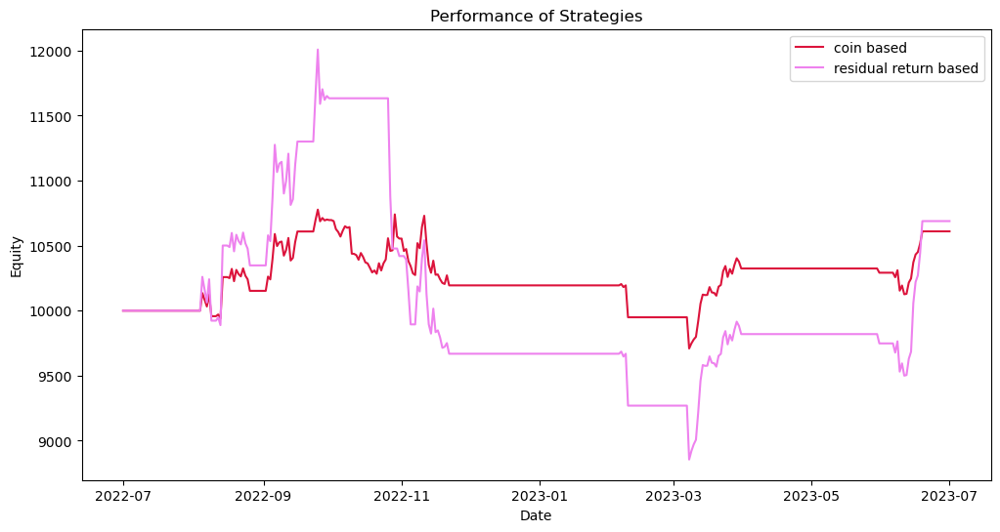

In [27]:
# Initialize naive backtest instance with leverage = 1 and transaction costs = 0) 
backtest_naive = PCAstratBacktest(10000, target_leverage = 1, tc_bps = 0, start_date = "2022-07-01", end_date = "2023-07-01")

# Use parameter set -2.5, -0.5, 2.5, 0.5
coin_aggregate_ec, _ = backtest_naive.backtest_v3(s_bo = -2.5, s_sc = 0.5, s_so = 2.5, s_bc = 0.5, l_target= 1, tau = 30/365)
eig_aggregate_ec, _ = backtest_naive.backtest_v5(s_bo = -2.5, s_sc = 0.5, s_so = 2.5, s_bc = 0.5, l_target = 1, tau = 30/365)

# Plot equity curves
plt.figure(figsize = (12,6))
plt.plot(coin_aggregate_ec, label = "coin based", color = "crimson")
plt.plot(eig_aggregate_ec, label = "residual return based", color = "violet")
plt.xlabel("Date")
plt.ylabel("Equity")
plt.title("Performance of Strategies")
plt.legend()

# Compare performance stats
print("--------------------coin based----------------------")
print(backtest_naive.compute_performance(coin_aggregate_ec))
print("--------------------eig based-----------------------------------------")
print(backtest_naive.compute_performance(eig_aggregate_ec))

##### Remarks
- The fact that the equity curves comove with each other show that both strategies are adopting the same approach. This ensures that althought the methodology of aggregating PnL each day is different, the philosophy behind each methodology is essentially the same.
- In general, the residual-return based approach has higher volatility because once equity is allocated to each stat-arb portfolio $k$, we hold leveraged positions adding up the 1 + sum of betas with regards to coin $k$. Also, total leverage employed by portfolio is less clear since each stat-arb portfolio has differing inherent volatilities.
- If we use vol targeting to match volatility of both equity curves, we see that the effect of period to period volatiality is dampened by using coin based returns

# 6. Optimization

Running the `optimize_s_thresholds()` function from our `Backtest` class will output a dataframe with optimized s-thresholds.

In [28]:
try:
  if not optv3.empty:
    print("opt dfs loaded")
except Exception:
  print("No optv3 df found. Loading Data.")
  opt_dict = {}
  for i in range(3,6):
    with open(f"optv{i}.pkl", "rb") as file:
      opt_dict[i] = pickle.load(file)
  print("Loaded opt dfs")

  optv3 = opt_dict[3]
  optv4 = opt_dict[4]
  optv5 = opt_dict[5]

No optv3 df found. Loading Data.
Loaded opt dfs


C:\Users\idkup\AppData\Local\Temp\ipykernel_47428\239488619.py:9: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  opt_dict[i] = pickle.load(file)
C:\Users\idkup\AppData\Local\Temp\ipykernel_47428\239488619.py:9: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to acce

In [ ]:
# Run below code to get optimized s thresholds
# optv3 = backtest_naive.optimize_s_thresholds(validation_start_date="2022-07-01", validation_end_date="2023-07-01", bt_version= "v3", modified = False)
# optv3.to_pickle("optv3.pkl")

In [29]:
optv3.head()

,s_bo,s_sc,s_so,s_bc,Cumulative Return,CAGR,Sharpe Ratio,Max Drawdown,Max Drawdown Period,Final Equity,Leverage,n_trades
0,-2.5,0.576923,2.5,0.576923,0.120432,0.081674,0.877392,-0.072053,-103 days,11204.321068,1.0,171
1,-2.5,0.576923,2.5,0.576923,0.180439,0.121346,0.869053,-0.107248,-103 days,11804.393980,1.5,171
2,-2.5,0.576923,2.5,0.576923,0.239803,0.159983,0.859319,-0.141849,-103 days,12398.025365,2.0,171
3,-2.5,0.576923,2.5,0.576923,0.298125,0.197388,0.848186,-0.175830,-103 days,12981.246164,2.5,171
4,-2.5,0.576923,2.5,0.576923,0.354999,0.233366,0.835656,-0.209165,-103 days,13549.988112,3.0,171


# 7. Results

## Performance

#### In-sample Performance
First, we conduct a naive backtest that runs the PCA stat-arb strategy starting from 90 days before 

s_thresholds = [-2.0, -1.0, 2.0, 1.0]
{'Cumulative Return': np.float64(0.39253347656426385), 'CAGR': np.float64(3.0177573717226496), 'Annualized Volatility': np.float64(0.16458162922922975), 'Sharpe Ratio': np.float64(18.335930843894545), 'MDD': np.float64(-0.01409143500912494), 'MDD period': Timedelta('2 days 00:00:00')}


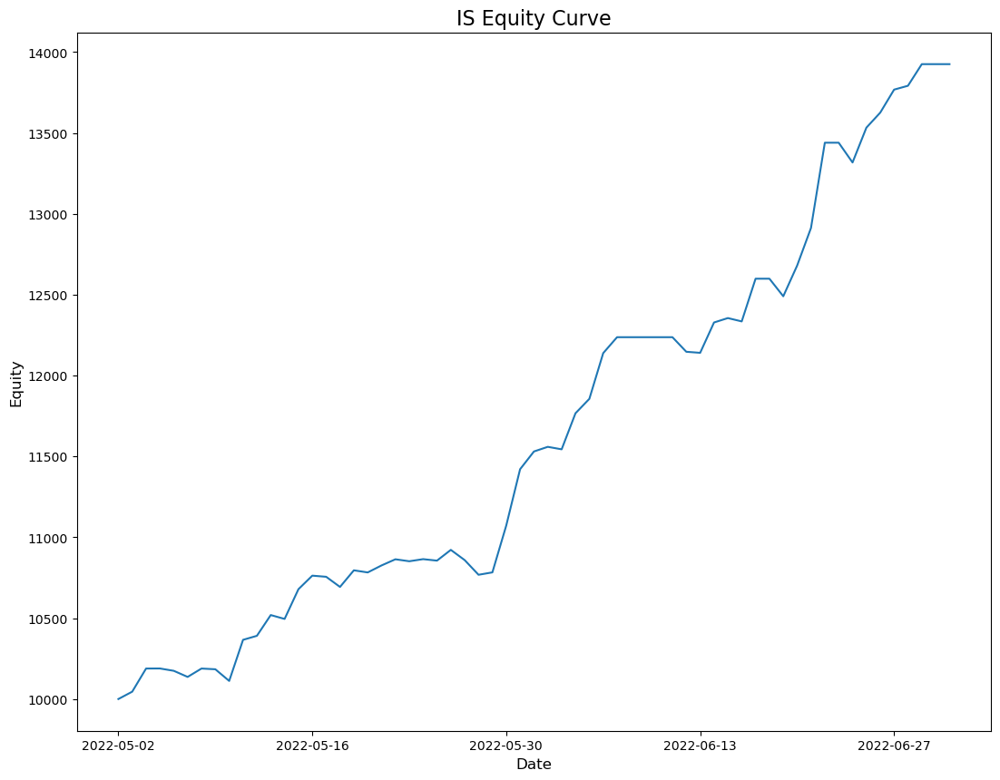

In [31]:
results = backtest_naive.backtest_v1() # In-sample backtest
tick_interval = 14

IS_signal_dict = backtest_naive.signal_dict
IS_mrl = results[-1]
IS_equity_curve = backtest_naive.equity_curve
IS_performance = backtest_naive.compute_performance()

plt.figure(figsize = (13,10))
plt.plot(IS_equity_curve)
plt.xticks(IS_equity_curve.index[::tick_interval])
plt.xlabel("Date", fontsize = 12)
plt.ylabel("Equity", fontsize = 12)
plt.title("IS Equity Curve", fontsize = 16)
print(f"s_thresholds = {backtest_naive.s_thresholds}")
print(IS_performance)

This is a laughable equity curve. Admittedly, I didn't expect to see literally my first naive backtest performance to be this good. Well, a Sharpe of 27.5 is something even the best of best can't achieve, so there is clearly something wrong here. To give you context, the S&P 500 is known to have a Sharpe around 0.4 ~ 0.6. A realized sharpe higher than one is considered to be very impressive in the industry.

This in-sample performance is clearly inaccurate because it encompasses a lot of forward looking bias. First, the trading universe this backtest relied on was generated on 2022-07-01; in reality, one really can't generate a trading universe for a *future date*. Moreover, the statistical factors we have used are estimated using data *ending on 2022-07-01*. Because by definition factors extracted from PCA are optimized to explain the past variance of (standardized) returns, it would make sense for our residual return series to be more well-behaved. Hence, unless we believe that the eigenportfolios will maintain relevancy throughout the future to a degree similar to the past, the in-sample performance doesn't really prove much except to provide amusement.

Though we can simply ignore above result, let us actually see if trades were opened correctly. This will allow us to decide whether our algorithm is constructed without error.

In [32]:
# Define function
def plot_coin_signal_and_price(
    coin,
    signal_dict,
    aux_df,
    price_df,
    figsize=(10,6)
):
    """
    Plot for one coin:
      - Top subplot: coin's auxiliary series (blue line)
                    plus markers for signal changes
      - Bottom subplot: coin's price series (black line)

    signal_dict : { date -> { coin -> ( -1, 0, or +1 ) } }
    aux_df : DataFrame of shape (dates x coins)
    price_df : DataFrame of shape (dates x coins)
    """
    # 1) Gather all the dates that appear in signal_dict, 
    #    but filter to those that also exist in aux_df.index and price_df.index
    all_dates_sorted = sorted(signal_dict.keys())
    valid_dates = []
    for d in all_dates_sorted:
        if (d in aux_df.index) and (d in pd.to_datetime(price_df.index)):
            valid_dates.append(d)

    if len(valid_dates) < 2:
        print(f"Not enough valid dates to plot for {coin}.")
        return

    # Build arrays for x-axis, signals, and values of aux
    x_dates = valid_dates
    signals = [signal_dict[d].get(coin, 0) for d in x_dates]
    aux_vals = aux_df.loc[x_dates, coin].values
    price_vals = price_df.loc[x_dates, coin].values

    # 2) Create subplots
    fig, (ax_top, ax_bottom) = plt.subplots(2,1, figsize=figsize, sharex=True)
    fig.suptitle(f"{coin}: Aux + Price with Signals")

    # 3) Plot the aux series on the top axis
    ax_top.plot(x_dates, aux_vals, color='blue', label="Aux Series")

    # We'll mark signal changes:
    # We look from i=1 to len(x_dates)-1, see if signals[i] != signals[i-1]
    # Then mark the day x_dates[i] on the aux with the appropriate color
    for i in range(1, len(x_dates)):
        old_sig = signals[i-1]
        new_sig = signals[i]
        date_i  = x_dates[i]
        aux_i   = aux_vals[i]

        if old_sig == 0 and new_sig == 1:
            # Open Long => green
            ax_top.scatter(date_i, aux_i, color='green', marker='^', s=80, 
                           edgecolors='black', linewidths=0.5,
                           label="Open Long" if i==1 else "")
        elif i-1 == 0 and signals[i-1] == 1: # Long very first day
            # Open Long => green
            ax_top.scatter(date_i, aux_i, color='green', marker='^', s=80, 
                           edgecolors='black', linewidths=0.5,
                           label="Open Long" if i==1 else "")            

        elif old_sig == 1 and new_sig == 0:
            # Close Long => light red
            ax_top.scatter(date_i, aux_i, color='lightcoral', marker='v', s=80,
                           edgecolors='black', linewidths=0.5,
                           label="Close Long" if i==1 else "")
        elif old_sig == 0 and new_sig == -1:
            # Open Short => red
            ax_top.scatter(date_i, aux_i, color='red', marker='v', s=80,
                           edgecolors='black', linewidths=0.5,
                           label="Open Short" if i==1 else "")
            
        elif i-1 == 0 and signals[i-1] == -1:
            ax_top.scatter(date_i, aux_i, color='red', marker='v', s=80,
                edgecolors='black', linewidths=0.5,
                label="Open Short" if i==1 else "")

        elif old_sig == -1 and new_sig == 0:
            # Close Short => light green
            ax_top.scatter(date_i, aux_i, color='lightgreen', marker='^', s=80,
                           edgecolors='black', linewidths=0.5,
                           label="Close Short" if i==1 else "")
            

    ax_top.legend(loc="best")
    ax_top.set_ylabel("Aux Value")
    ax_top.grid(True)

    # 4) Plot the coin's price on the bottom axis
    ax_bottom.plot(x_dates, price_vals, color='black', label="Price")
    ax_bottom.legend(loc="best")
    ax_bottom.set_ylabel("Price")
    ax_bottom.grid(True)

    plt.tight_layout()
    plt.show()


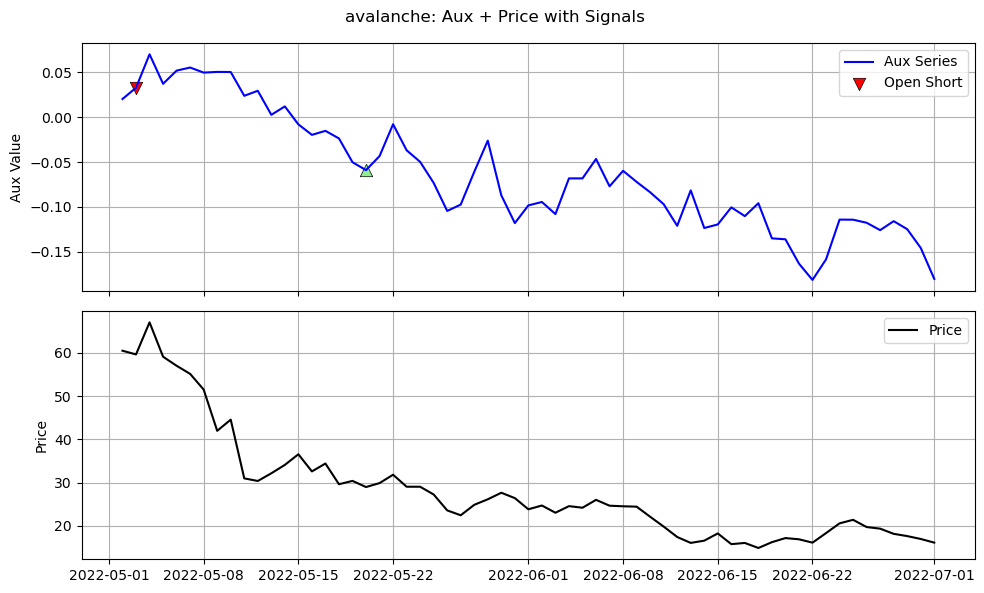

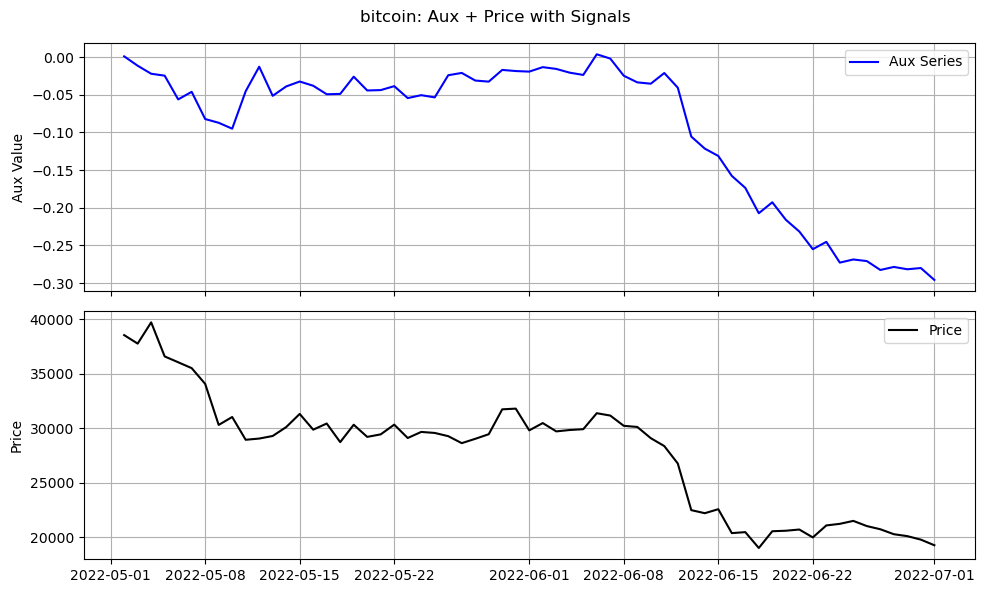

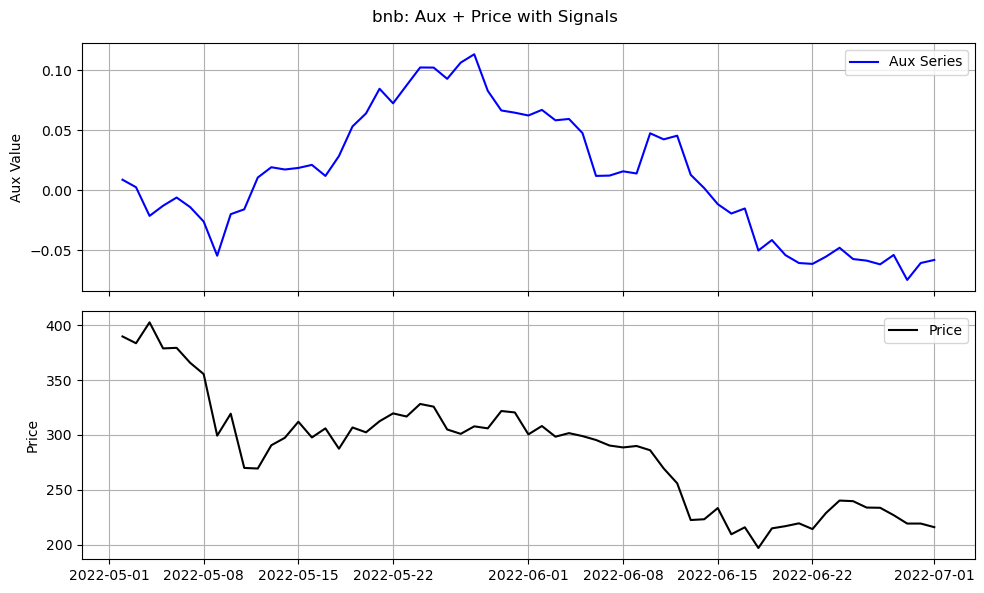

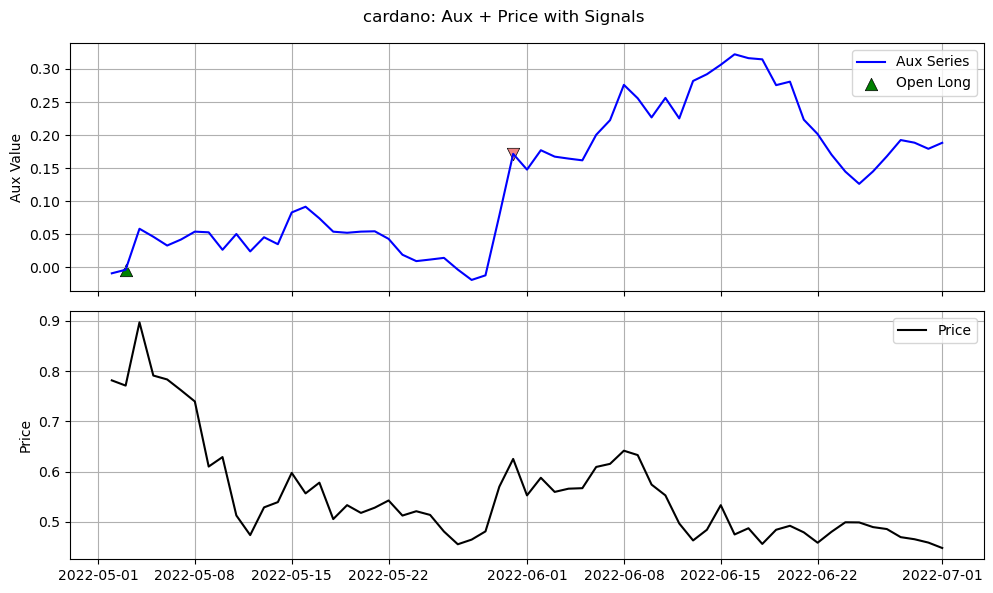

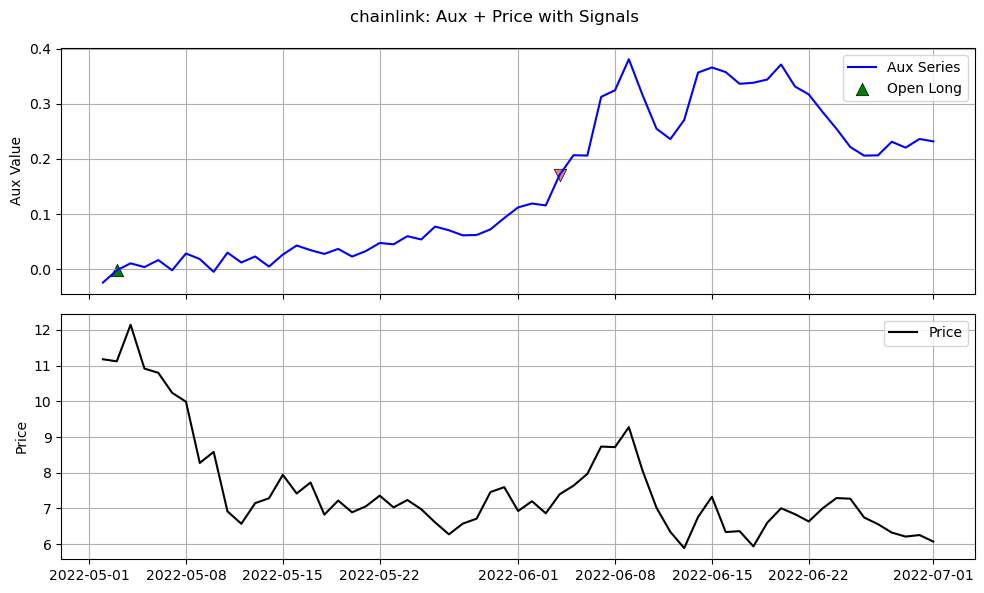

...

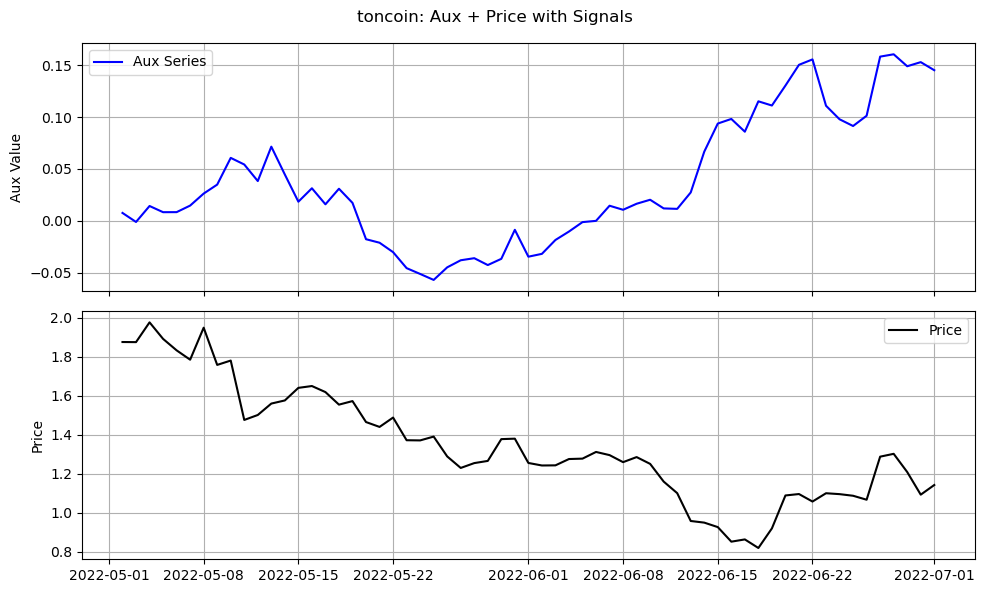

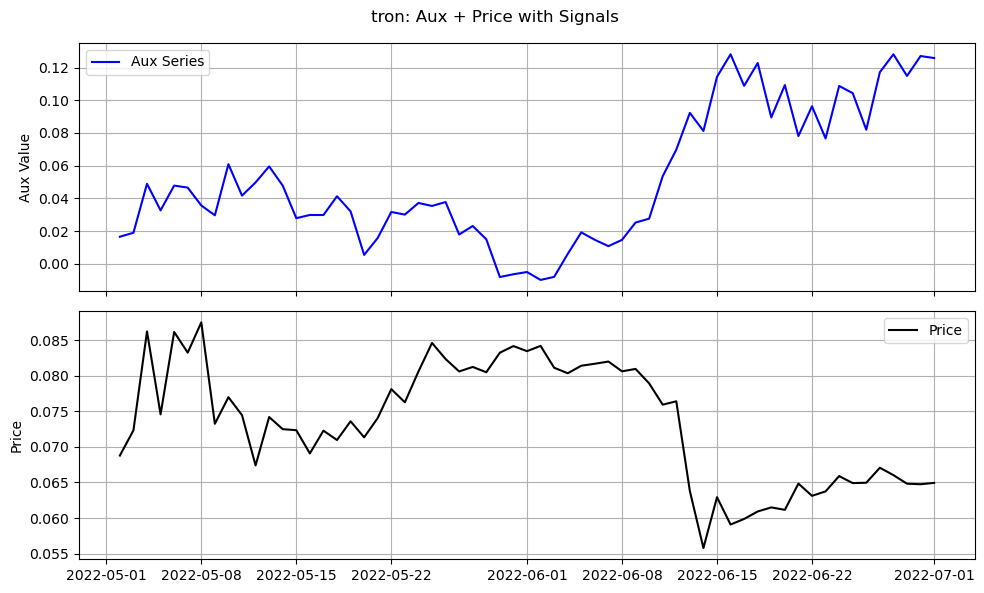

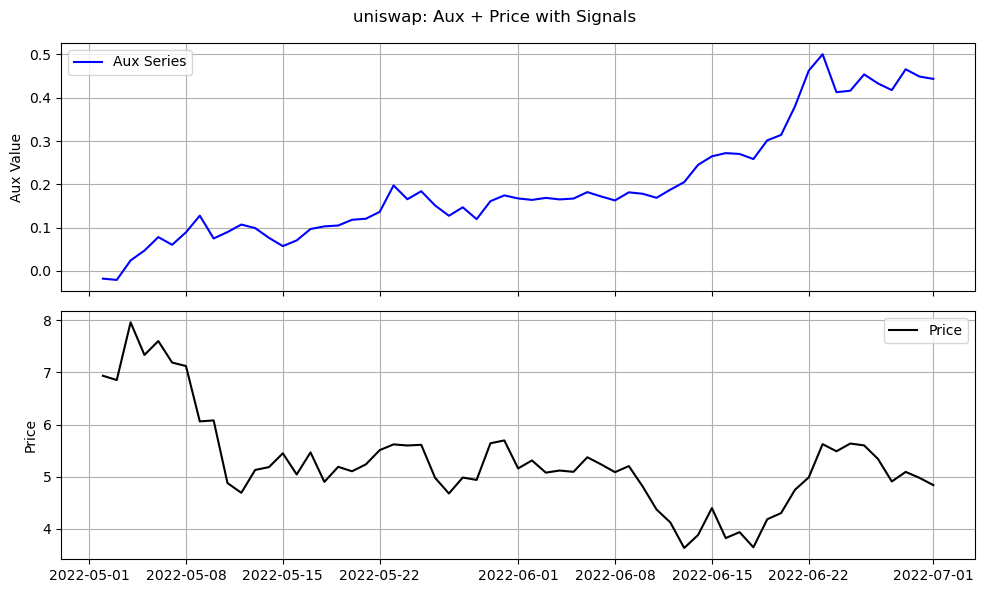

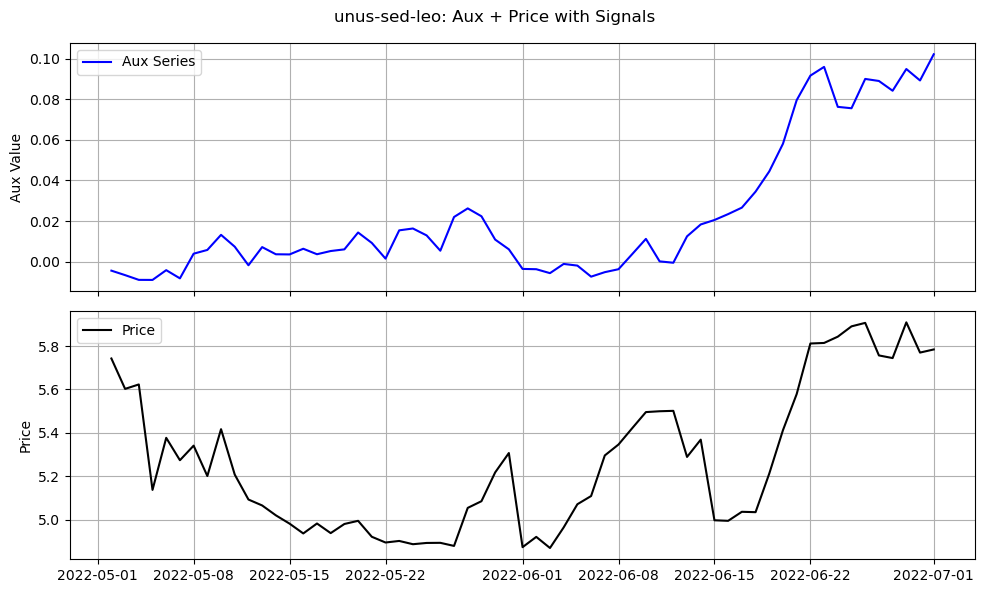

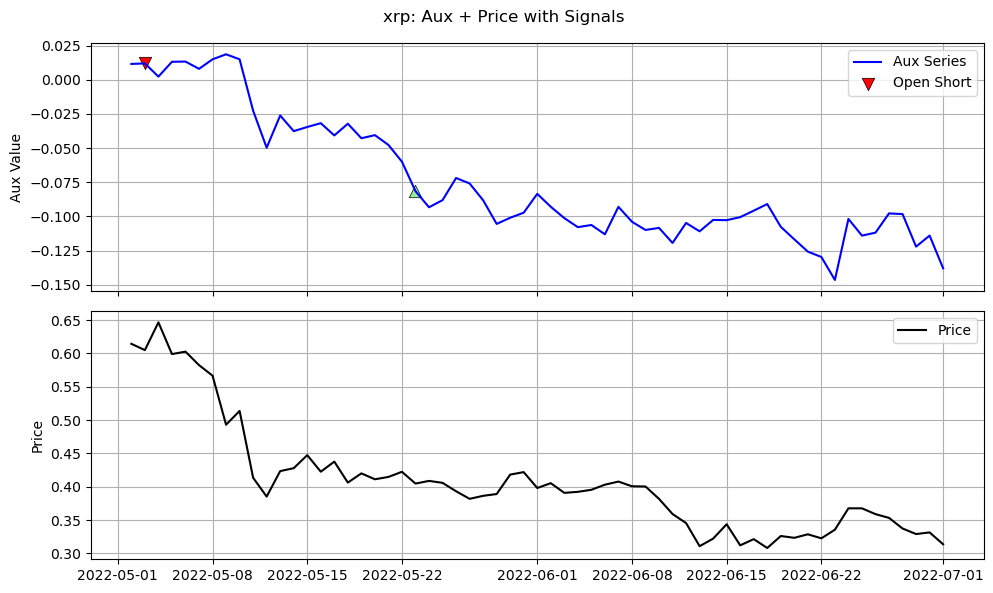

In [33]:
IS_aux_df = results[1]

for coin in IS_aux_df.columns:
  
  plot_coin_signal_and_price(
    coin= coin, 
    signal_dict= IS_signal_dict, 
    aux_df= IS_aux_df, 
    price_df= parent_df
  )

##### Remarks
- When looking at how our signals are executed in sample, it seems as if the logic itself is sound. We are generally opening positions when the spread is undervalued or overvalued and closing them appropriately.
- For some coins, the auxiliary series match the price series, but for some the auxiliary series and price series do not match.


Above result motivates us to pursue for a more robust set of performance; this can be achieved through the adoption of walk-forward validation.

We will rely on a walk-forward validation of step size one to closely emulate live trading settings, updating our signal for the next day period-by-period.

We re-estimate betas, auxiliary series, OU parameters, and s-scores each day. We optimize for s-thresholds on the validation set (2022-07-01 ~ 2023-07-01) and leverage parameter using grid-search. To reduce compute time, we impose constraints to greatly reduce the number of combinations for s-thresholds and the leverage parameter.


### OOS Performance

In [34]:
def plot_coin_signal_and_price2(
    coin,
    signal_dict,
    top_df,
    labels,
    bottom_df,
    figsize=(10, 6),
    save_path=None  # Add a parameter to specify the save path
):
    all_dates_sorted = sorted(signal_dict.keys())
    valid_dates = [d for d in all_dates_sorted if d in top_df.index and d in pd.to_datetime(top_df.index)]

    if len(valid_dates) < 2:
        print(f"Not enough valid dates to plot for {coin}.")
        return

    for d in valid_dates:
        if signal_dict[d].get(coin, 0) != 0 and pd.isna(top_df.loc[d, coin]):
            raise ValueError(f"Auxiliary series NaN for {coin} on {d} despite nonzero signal.")

    x_dates = valid_dates
    signals = [signal_dict[d].get(coin, 0) for d in x_dates]
    top_vals = top_df.loc[x_dates, coin].values
    bottom_vals = bottom_df.loc[x_dates, coin].values

    fig, (ax_top, ax_bottom) = plt.subplots(2, 1, figsize=figsize, sharex=True)
    fig.suptitle(f"{coin}: Graphs with Signals", fontsize=16)

    ax_top.plot(x_dates, top_vals, color='blue', label=labels[0])
    ax_bottom.plot(x_dates, bottom_vals, color='black', label=labels[1])

    labels_used = {"Open Long": False, "Close Long": False, "Open Short": False, "Close Short": False}

    def find_last_non_nan(vals, index):
        for i in range(index - 1, -1, -1):
            if not pd.isna(vals[i]):
                return vals[i]
        return 0

    for i in range(1, len(x_dates)):
        old_sig, new_sig = signals[i-1], signals[i]
        date_i, top_i, bottom_i = x_dates[i], top_vals[i], bottom_vals[i]

        if pd.isna(top_i): top_i = find_last_non_nan(top_vals, i)
        if pd.isna(bottom_i): bottom_i = find_last_non_nan(bottom_vals, i)

        markers = {
            (0, 1): ("green", '^', "Open Long"),
            (1, 0): ("lightcoral", 'v', "Close Long"),
            (0, -1): ("red", 'v', "Open Short"),
            (-1, 0): ("lightgreen", '^', "Close Short")
        }

        if (old_sig, new_sig) in markers or (i == 1 and old_sig != 0):
            color, marker, label = markers.get((old_sig, new_sig), markers.get((0, old_sig)))
            if not labels_used[label]:
                ax_top.scatter(date_i, top_i, color=color, marker=marker, s=80,
                               edgecolors='black', linewidths=0.5, label=label)
                ax_bottom.scatter(date_i, bottom_i, color=color, marker=marker, s=80,
                                  edgecolors='black', linewidths=0.5, label=label)
                labels_used[label] = True

    ax_top.legend(loc='upper right', fontsize=10)
    ax_bottom.legend(loc='upper right', fontsize=10)

    ax_bottom.set_xlabel("Date", fontsize=12)
    ax_top.set_ylabel("Series", fontsize=12)
    ax_bottom.set_ylabel("Series", fontsize=12)

    ax_top.grid(True)
    ax_bottom.grid(True)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, format='png', dpi=300)  # Save plot if save_path is provided

    plt.show()


In [41]:
backtest_inst =  PCAstratBacktest(10000, target_leverage = 1, tc_bps = 0, start_date = "2022-07-01", end_date = "2023-07-01")
resultsv2 = backtest_naive.backtest_v2(s_bo = -2.5, s_sc = 0.5, s_so = 2.5, s_bc = 0.5, modified = False, l_target= 1, tau = 100)
resultsv3 = backtest_naive.backtest_v3(s_bo = -2.5, s_sc = 0.5, s_so = 2.5, s_bc = 0.5, modified = False, l_target= 1, tau = 100)
resultsv4 = backtest_naive.backtest_v4(s_bo = -2.5, s_sc = 0.5, s_so = 2.5, s_bc = 0.5, modified = False, l_target= 1, tau = 100)
resultsv5 = backtest_naive.backtest_v5(s_bo = -2.5, s_sc = 0.5, s_so = 2.5, s_bc = 0.5, modified = False, l_target= 1, tau = 100)

Processing dates:   0%|          | 0/366 [00:00<?, ?it/s]

Processing: 100%|██████████| 366/366 [00:24<00:00, 15.13it/s]


Text(0.5, 1.0, 'Validation Period Performance of Strategy Varaiations')

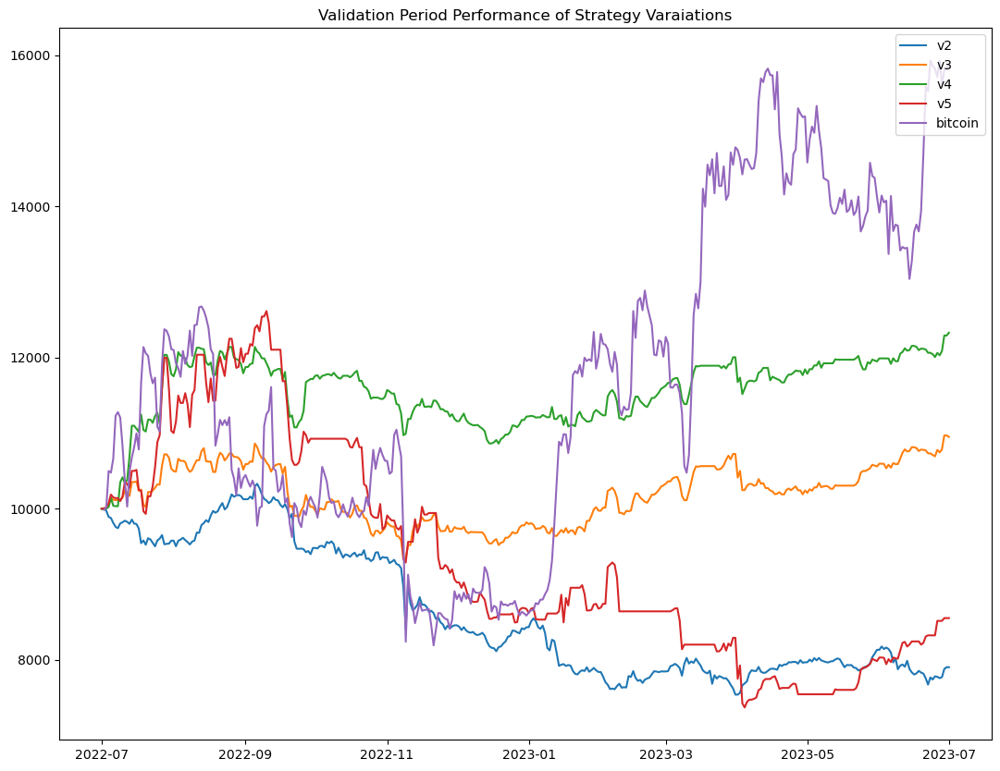

In [ ]:
initial_equity = 10000
plt.figure(figsize = (13,10))
plt.plot(resultsv2[0], label = "v2")
plt.plot(resultsv3[0], label = "v3")
plt.plot(resultsv4[0], label = "v4")
plt.plot(resultsv5[0], label = "v5")
plt.plot(initial_equity * np.cumprod(1+parent_df.loc["2022-07-01": "2023-07-01"]["bitcoin"].pct_change().dropna()), label = "bitcoin")
plt.legend(loc = "upper right")
plt.title("Validation Period Performance of Strategy Varaiations")

In [ ]:
main_df = resultsv3[1][list(resultsv3[1].keys())[0]]
for _, df in list(resultsv3[1].items())[1:]:
  last_row =  df.iloc[[-1]] # .iloc[[]] returns a df, which is needed for concatenation
  main_df = pd.concat([main_df, last_row], ignore_index= True) # Sets new index

dates = pd.date_range("2022-05-02", "2023-07-01")


main_df.index = dates
main_df.head()

,algorand,avalanche,bitcoin,bitcoin-cash,bnb,cardano,chainlink,cosmos,cronos,dogecoin,...,unus-sed-leo,xrp,ethereum-classic,flow,toncoin,quant,okb,filecoin,hedera,lido-dao
2022-05-02,0.039996,0.025021,0.007190,0.012056,0.014374,-0.004152,-0.025048,0.005609,-0.099651,0.011337,...,0.000528,0.017537,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-05-03,0.126320,0.024237,-0.008969,-0.001989,-0.000100,-0.001553,-0.001829,-0.017179,-0.046636,-0.006569,...,0.006415,0.013328,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-05-04,0.101083,0.064695,-0.012460,-0.003325,-0.025573,0.072855,0.021512,0.013920,-0.066960,-0.058348,...,0.001906,0.005984,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-05-05,0.067117,0.043519,-0.006018,0.011823,-0.003748,0.058446,0.023509,-0.005054,-0.057369,-0.035887,...,-0.004224,0.011525,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-05-06,0.173000,0.056005,-0.037557,-0.009275,-0.011243,0.058019,0.044467,-0.002912,-0.090728,-0.055671,...,0.009314,0.012172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-27,NaN,-0.012073,0.154580,NaN,-0.065965,-0.253041,NaN,-0.018753,NaN,-0.039132,...,0.033258,-0.015816,NaN,NaN,0.022520,NaN,NaN,NaN,NaN,NaN
2023-06-28,NaN,-0.015667,0.171634,NaN,-0.051904,-0.267458,NaN,-0.023486,NaN,-0.041734,...,0.036616,-0.014190,NaN,NaN,0.023031,NaN,NaN,NaN,NaN,NaN
2023-06-29,NaN,-0.001800,0.173068,NaN,-0.045797,-0.263807,NaN,-0.051676,NaN,-0.040503,...,0.040447,-0.004891,NaN,NaN,0.017814,NaN,NaN,NaN,NaN,NaN
2023-06-30,NaN,-0.088499,0.096660,0.075032,-0.123649,-0.206264,NaN,NaN,NaN,-0.131656,...,-0.004262,0.132411,NaN,NaN,0.068779,NaN,NaN,NaN,NaN,NaN


##### Remarks
- Very different from in-sample period performance. Performance was quite bad for the entire period. We also see how the exclusion of mean reversion list acts as a "Stop loss". 

### Performance comparison of v3 and buy-and-hold strats

This section we will further investigate the performance of the following two strategies.
1. Reestimate beta and OU parameter estimates every seven days, while extracting new PCA factors from an updated trading universe every month. This corresponds to backtest v4.
2. Reestimate beta and OU parameter estiamtes every day, while conducting dynamic rebalancing every month. This method corresponds to backtest v3.
3. Compute performance via aggregating the residual returns every day.

#### Version 3

In [50]:
print("mean")
print(optv3.mean())

print("-----------------------------------------------------")
print("median")
print(optv3.median())
print("-----------------------------------------------------")
print("max")
print(optv3.max())

mean
s_bo                                      -1.94359
s_sc                                     -0.771795
s_so                                       1.94359
s_bc                                      0.771795
Cumulative Return                        -0.136245
CAGR                                     -0.097408
Sharpe Ratio                              -0.85025
Max Drawdown                             -0.225577
Max Drawdown Period    221 days 01:06:27.692307692
Final Equity                           8637.551665
Leverage                                       1.0
Tau_Threshold                             0.321233
n_trades                                282.416667
dtype: object
-----------------------------------------------------
median
s_bo                                -2.0
s_sc                                -0.7
s_so                                 2.0
s_bc                                 0.7
Cumulative Return              -0.147252
CAGR                           -0.104144
Sharpe Rati

In [ ]:
# Version 3 with leverage 1
parameter_set = optv3.iloc[0, 0:4]
s_bo = parameter_set["s_bo"]
s_sc = parameter_set["s_sc"]
s_so = parameter_set["s_so"]
s_bc = parameter_set["s_bc"]

initial_equity = 10000

backtest_opt = PCAstratBacktest(initial_equity= initial_equity, target_leverage=1, start_date="2022-07-01", end_date = "2023-07-01", tc_bps = 0)
v3_equity_curve_opt, _ = backtest_opt.backtest_v3(s_bo = s_bo, s_sc = s_sc, s_so = s_so, s_bc = s_bc, l_target=1, tau = optv3.loc[0,"Tau_Threshold"])

Processing dates: 100%|██████████| 366/366 [00:23<00:00, 15.42it/s]


In [ ]:
# Version three with tau = 100 (set tau large enough to trade all coins in trading universe)
v3_equity_curve_opt2, _ = backtest_opt.backtest_v3(s_bo = -2.5, s_sc = 0.5, s_so = 2.5, s_bc = 0.5, l_target=1, tau = 100)

Processing dates: 100%|██████████| 366/366 [00:23<00:00, 15.58it/s]


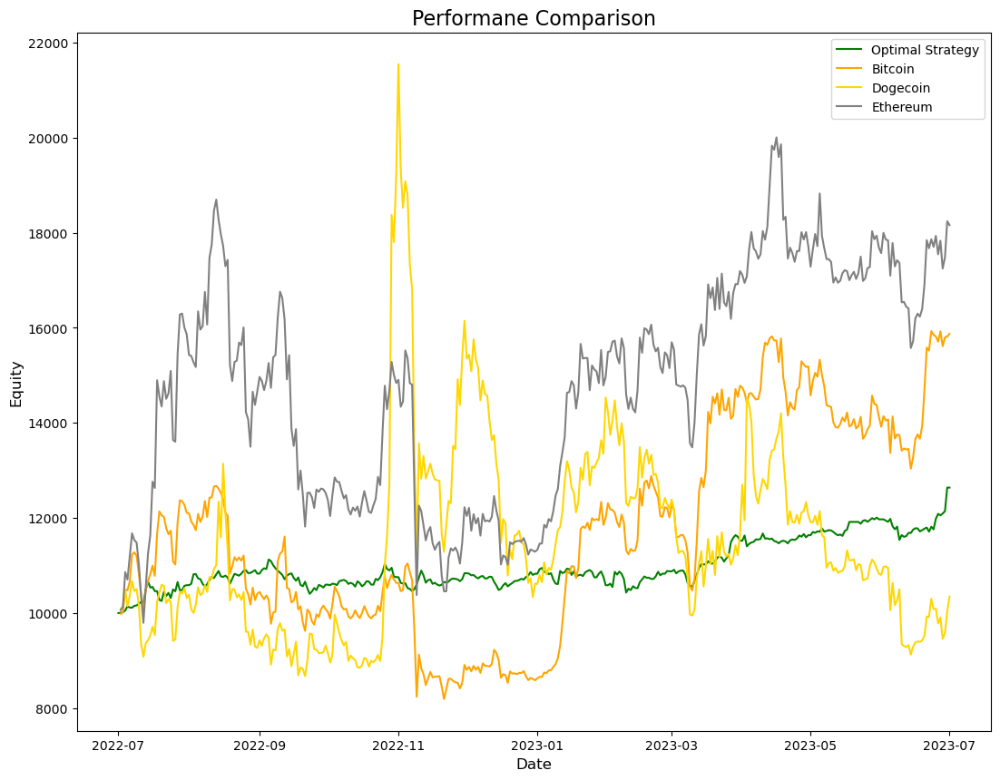

In [ ]:
# Plot equity curves
plt.figure(figsize= (13,10))
plt.plot(v3_equity_curve_opt2, label = "Optimal Strategy", linewidth = 1.5, color = "green")
plt.plot(initial_equity * np.cumprod(1+parent_df.loc["2022-07-01": "2023-07-01"]["bitcoin"].pct_change().dropna()), label = "Bitcoin", color = "orange")
plt.plot(initial_equity * np.cumprod(1+parent_df.loc["2022-07-01": "2023-07-01"]["dogecoin"].pct_change().dropna()), label = "Dogecoin", color = "gold")
plt.plot(initial_equity * np.cumprod(1+parent_df.loc["2022-07-01": "2023-07-01"]["ethereum"].pct_change().dropna()), label = "Ethereum", color = "grey")
plt.title("Performane Comparison", fontsize = 16)
plt.legend(loc = "upper right")
plt.xlabel("Date" , fontsize = 12)
plt.ylabel("Equity", fontsize = 12)

In [ ]:

# Compare performance
print("--------------Bitcoin-----------------")
print(backtest_opt.compute_performance(parent_df.loc["2022-07-01": "2023-07-01"]["bitcoin"]))
print("--------------Ethereum----------------")
print(backtest_opt.compute_performance(parent_df.loc["2022-07-01": "2023-07-01"]["ethereum"]))
print("--------------Dogecoin----------------")
print(backtest_opt.compute_performance(parent_df.loc["2022-07-01": "2023-07-01"]["dogecoin"]))
print("--------------V3---------------------")
print(backtest_opt.compute_performance(v3_equity_curve_opt2))

--------------Bitcoin-----------------
{'Cumulative Return': 0.5874978960189989, 'CAGR': 0.3758610119508028, 'Annualized Volatility': 0.4345645537883012, 'Sharpe Ratio': 0.8649141046462433, 'MDD': -0.35361774280750485, 'MDD period': Timedelta('100 days 00:00:00')}
--------------Ethereum----------------
{'Cumulative Return': 0.8160267828076035, 'CAGR': 0.5097354074043929, 'Annualized Volatility': 0.586216594637347, 'Sharpe Ratio': 0.8695342507656785, 'MDD': -0.4447335290317028, 'MDD period': Timedelta('88 days 00:00:00')}
--------------Dogecoin----------------
{'Cumulative Return': 0.034810834116177025, 'CAGR': 0.02390620400948862, 'Annualized Volatility': 0.7756082431961111, 'Sharpe Ratio': 0.03082252441126258, 'MDD': -0.576450491389029, 'MDD period': Timedelta('225 days 00:00:00')}
--------------V3---------------------
{'Cumulative Return': 0.26393312967183613, 'CAGR': 0.17552381439958897, 'Annualized Volatility': 0.11935178802976297, 'Sharpe Ratio': 1.4706425207121177, 'MDD': -0.0648

#### Voltargeting
Since the strategy has much lower volatility compared to naive buy-and-hold strategies, we can try to use leverage to achieve similar level of volatility.

Processing dates:   0%|          | 0/366 [00:00<?, ?it/s]

Processing dates: 100%|██████████| 366/366 [00:22<00:00, 16.16it/s]


--------------Bitcoin-----------------
{'Cumulative Return': 0.5874978960189989, 'CAGR': 0.3758610119508028, 'Annualized Volatility': 0.4345645537883012, 'Sharpe Ratio': 0.8649141046462433, 'MDD': -0.35361774280750485, 'MDD period': Timedelta('100 days 00:00:00')}
--------------Ethereum----------------
{'Cumulative Return': 0.8160267828076035, 'CAGR': 0.5097354074043929, 'Annualized Volatility': 0.586216594637347, 'Sharpe Ratio': 0.8695342507656785, 'MDD': -0.4447335290317028, 'MDD period': Timedelta('88 days 00:00:00')}
--------------Dogecoin----------------
{'Cumulative Return': 0.034810834116177025, 'CAGR': 0.02390620400948862, 'Annualized Volatility': 0.7756082431961111, 'Sharpe Ratio': 0.03082252441126258, 'MDD': -0.576450491389029, 'MDD period': Timedelta('225 days 00:00:00')}
--------------V3---------------------
{'Cumulative Return': 0.49747029349253036, 'CAGR': 0.32150628775406065, 'Annualized Volatility': 0.3652435334603269, 'Sharpe Ratio': 0.880251827344078, 'MDD': -0.256832

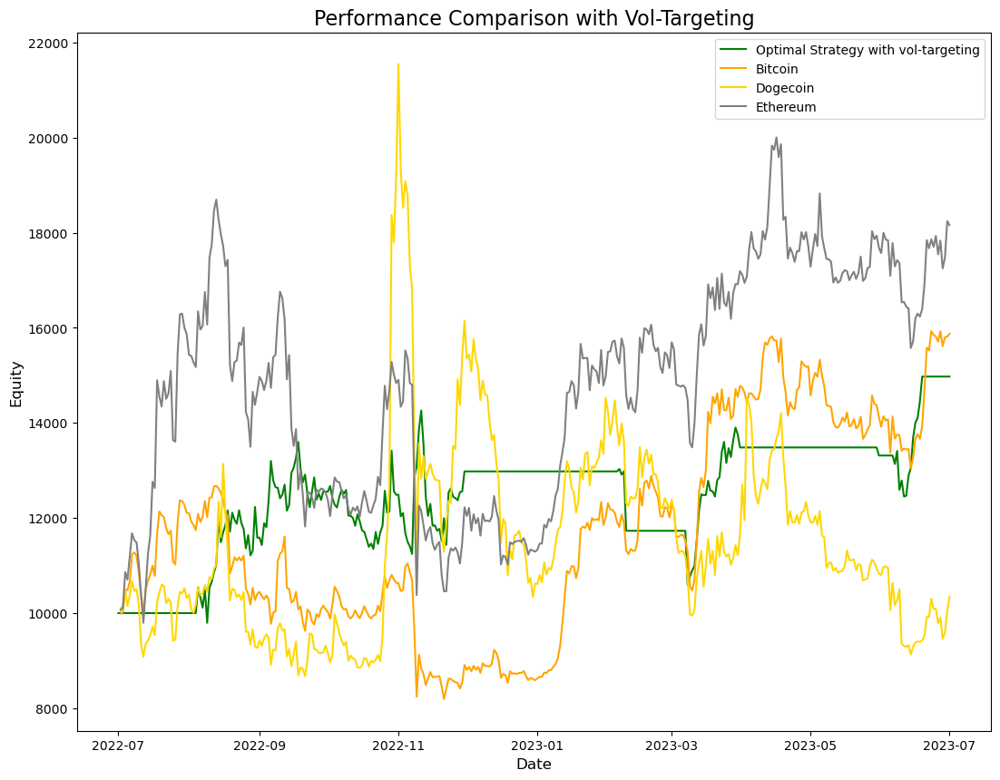

In [ ]:
# Leverage six

v3_equity_curve_opt_lev, _ = backtest_opt.backtest_v3(s_bo = -2.5, s_sc = 0.5, s_so = 2.5, s_bc = 0.5, l_target=4, tau = 60/360)

# Plot equity curves
plt.figure(figsize= (13,10))
plt.plot(v3_equity_curve_opt_lev, label = "Optimal Strategy with vol-targeting", linewidth = 1.5, color = "green")
plt.plot(initial_equity * np.cumprod(1+parent_df.loc["2022-07-01": "2023-07-01"]["bitcoin"].pct_change().dropna()), label = "Bitcoin", color = "orange")
plt.plot(initial_equity * np.cumprod(1+parent_df.loc["2022-07-01": "2023-07-01"]["dogecoin"].pct_change().dropna()), label = "Dogecoin", color = "gold")
plt.plot(initial_equity * np.cumprod(1+parent_df.loc["2022-07-01": "2023-07-01"]["ethereum"].pct_change().dropna()), label = "Ethereum", color = "grey")
plt.title("Performance Comparison with Vol-Targeting", fontsize = 16)
plt.legend()
plt.xlabel("Date", fontsize = 12)
plt.ylabel("Equity", fontsize = 12)
plt.savefig("images/vol-target-v3.png")


# Compare performance
print("--------------Bitcoin-----------------")
print(backtest_opt.compute_performance(parent_df.loc["2022-07-01": "2023-07-01"]["bitcoin"]))
print("--------------Ethereum----------------")
print(backtest_opt.compute_performance(parent_df.loc["2022-07-01": "2023-07-01"]["ethereum"]))
print("--------------Dogecoin----------------")
print(backtest_opt.compute_performance(parent_df.loc["2022-07-01": "2023-07-01"]["dogecoin"]))
print("--------------V3---------------------")
print(backtest_opt.compute_performance(v3_equity_curve_opt_lev))

In [ ]:
# Correlation of strategy and buy and hold bitcoin
v3_ret = v3_equity_curve_opt_lev.pct_change().dropna()
print(f"correlation between stat-arb strat and bitcoin buy-and-hold : {v3_ret.corr(parent_df.pct_change().dropna().loc['2022-07-01': '2023-07-01']['bitcoin'])}")

correlation between stat-arb strat and bitcoin buy-and-hold : 0.10427872526329217


##### Remarks
- With a leverage of six, our optimized stat-arb stat yields returns comparable to other buy-hold strategies, while the correlation is lower than 0.1.

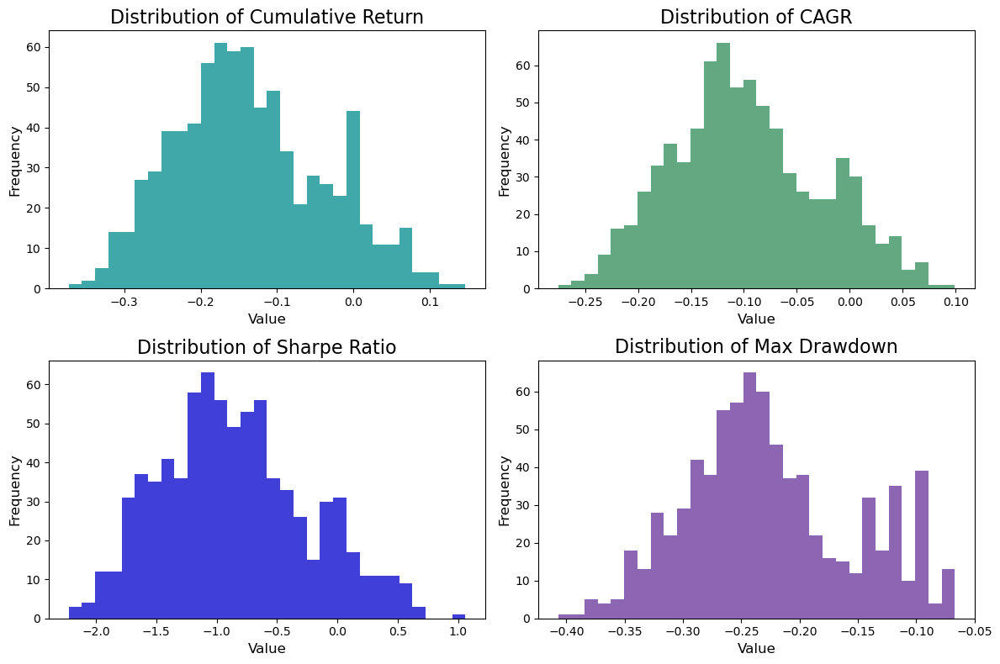

In [ ]:
feature_cols = ["Cumulative Return", "CAGR", "Sharpe Ratio", "Max Drawdown"]
colors = ["darkcyan", "seagreen", "mediumblue", "rebeccapurple"]

# Define the grid layout (2 rows, 2 columns)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

# Flatten the 2D axes array for easy iteration
axes = axes.flatten()

# Plotting
for ax, col, color in zip(axes, feature_cols, colors):
    ax.hist(optv3[col].dropna(), bins=30, alpha=0.75, color=color)
    ax.set_title(f"Distribution of {col}", fontsize=16)
    ax.set_xlabel("Value", fontsize=12)
    ax.set_ylabel("Frequency", fontsize=12)

# Adjust layout to prevent overlap
plt.tight_layout()


Let's compare this with performance of some of the mainstream coins.

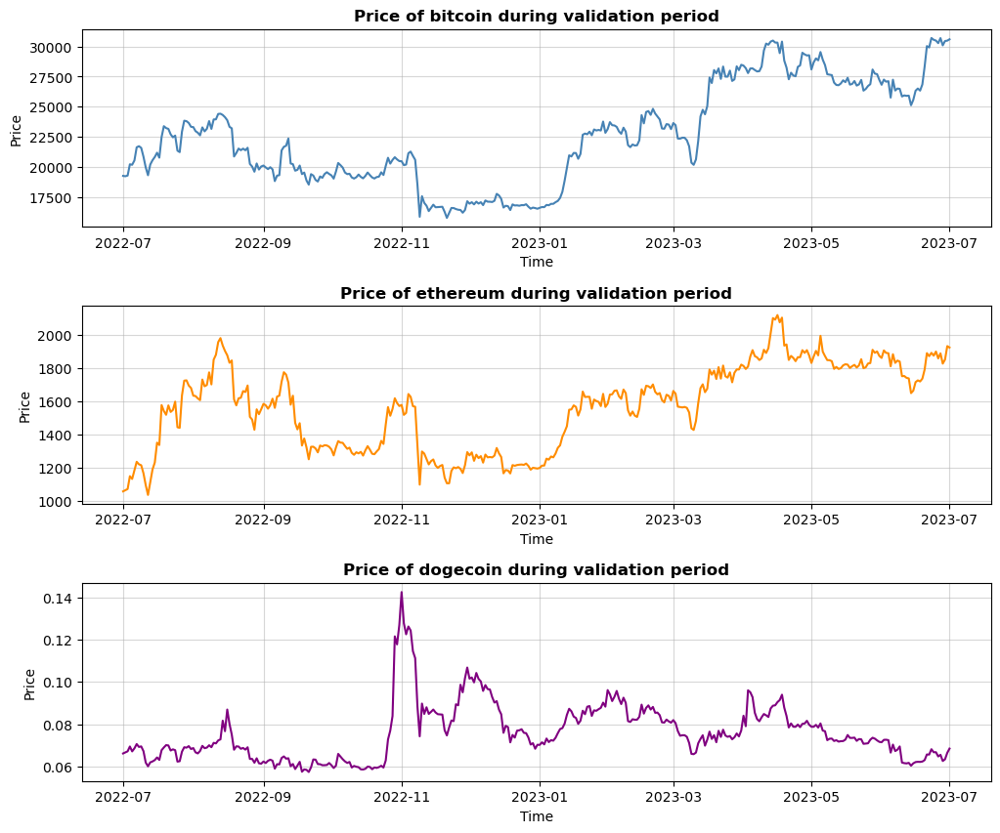

In [ ]:
import random
# Define colors dynamically
colors = ["steelblue", "darkorange", "seagreen", "crimson", "purple"]
random.shuffle(colors)  # Shuffle so that different runs get different colors

comparison_coins = ["bitcoin", "ethereum", "dogecoin"]

fig, axes = plt.subplots(nrows = len(comparison_coins), ncols = 1, figsize = (12,10))

for ax, coin, color in zip(axes, comparison_coins, colors):
  ax.plot(parent_df.loc["2022-07-01" : "2023-07-01"][coin], label = f"{coin}", color = color, linewidth = 1.5)
  ax.set_title(f"Price of {coin} during validation period", fontweight = "bold")
  ax.set_xlabel("Time")
  ax.set_ylabel("Price")
  ax.grid(True, linestyle = "-", alpha = 0.5)


plt.subplots_adjust(hspace=0.4)
  
  

##### Remarks
- We see that over the validation period, both variations of the strategy underperformed compared to simple buy and hold if we look at the distribution properties. With average leverage of 2, we realized -11% ~ -12% return over the year.
- The most optimal strategy produced annual growth rate of 8% at an annualized volatility of 9%. The Sharpe of the strategy was around 0.87, which was similar to the sharpe you could have gained buy buying and holding bitcion throughout the year.
- One feature is that over the validation period, the most optimal strategy returns had low correlation to bitcoin returns, which means investors could benefit from diversification by including this strategy in their portfolio. Of course this statement relies on the presumption that the strategy performance with the most optimal parameetr set is not overfit. 


#### Sensitivity Test
Even if we have optmized our parameter set on the validation data, we do not know for sure if this optimal set is optimal in the general sense, or it is just a result of overfitting.

A simple and intuitive way to verify whether the parameter set is overfit or not is to verify the local area near our optimal set.

Understanding a set of s-thresholds as a 4D vector, we can define the sensitivity function:
$$
\Bigg|\frac{\Delta PnL}{\Delta s*} \Bigg| = \frac{|PnL(s) - PnL(s^*)|}{\begin{Vmatrix}{s - s^*}\end{Vmatrix}_p}
$$
where $s,s^* \in \mathbb{R}^4$ and we use some $l_p$ norm to define the change in vectors. We will use the $l_2$ norm, or the Euclidean norm.




In [ ]:
def sensitivity_test(optimal_s_thresholds, start_date, end_date, perturb=0.3, granularity = 10, version = "v3"):
  """
  Two step process:
    1. Compute pnl over granular range of "optimal" parameter vector
    2. Use sensitivity function compute cumulative pnl Sensitivity with respect to change in parameters

  Parameters
  ----------
  optimal_s_thresholds : list
    contains four values -- s_bo , s_sc, s_so, s_bc

  perturn : int
    Amount you wish to perturb your vector by

  start_date, end_date = str
    Sensitivity test period

  granuliarty : number of values to generate around each threshold

  backtest_inst : PCAStratBacktest Instance, mainly to use backtest feature
  """
  import itertools
  import pickle

  backtest_inst = PCAstratBacktest(10000, target_leverage = 1, tc_bps = 0, start_date = start_date, end_date = end_date)
  st = optimal_s_thresholds # s threshold
  optimal_equity_curve, _ = backtest_inst.backtest_v3(st[0], st[1],st[2],st[3], l_target = 1)
  optimal_cumpnl = (optimal_equity_curve.iloc[-1] - optimal_equity_curve.iloc[0]) / optimal_equity_curve.iloc[0]

  s_bo_range = list(np.linspace(st[0]- perturb, st[0] + perturb, num =  granularity))
  s_sc_range = list(np.linspace(st[1] - perturb, st[1] + perturb, num = granularity))
  s_so_range = list(np.linspace(st[2] - perturb, st[2] + perturb, num = granularity))
  s_bc_range = list(np.linspace(st[3] - perturb, st[3] + perturb, num = granularity))

  grid_comb = itertools.product(s_bo_range, s_sc_range, s_so_range, s_bc_range)

  valid_comb = [
    (s_bo, s_sc, s_so, s_bc) for (s_bo, s_sc, s_so, s_bc) in grid_comb
    if s_bo < s_sc and s_so > s_bc and s_bo < s_bc and s_so > s_sc and s_bo <-1 and s_so > 1
            and np.abs(s_bo) == np.abs(s_so) and np.abs(s_bc) == np.abs(s_sc) 
  ]
  
  print(len(valid_comb)) #print debug
  print(valid_comb)

  sensitivity_dict = {"s_bo": [], "s_sc": [],"s_so": [],"s_bc": [], "DeltaPnL":[], "l2norm":[], "sensitivity":[]}

  for thresholds in tqdm(valid_comb, desc = "test in progress"):
    s_bo, s_sc, s_so, s_bc = thresholds

    if version == "v3":
      equity_curve, _ = backtest_inst.backtest_v3(s_bo, s_sc, s_so, s_bc, l_target = 1) # set leverage to one for consistent comparison
    elif version == "v4":
      equity_curve, _ = backtest_inst.backtest_v4(s_bo, s_sc, s_so, s_bc, l_target = 1) # set leverage to one for consistent comparison  
    elif version == "v5":
      equity_curve, _ = backtest_inst.backtest_v5(s_bo, s_sc, s_so, s_bc, l_target = 1) # set leverage to one for consistent comparison
    
    cumpnl = (equity_curve.iloc[-1] - equity_curve.iloc[0]) / equity_curve.iloc[0]
    # Delta pnl = (PnL(S) - PnL(S*)) / L2norm(S-S*)
    numerator = np.abs(cumpnl - optimal_cumpnl)
    denominator = sum((np.array(st) - np.array([s_bo, s_sc, s_so, s_bc]))**2)**(1/2) # Euclidean norm
    sensitivity = numerator / denominator

    # Append to results to dict
    sensitivity_dict["s_bo"].append(s_bo)
    sensitivity_dict["s_sc"].append(s_sc)
    sensitivity_dict["s_so"].append(s_so)
    sensitivity_dict["s_bc"].append(s_bc)
    sensitivity_dict["DeltaPnL"].append(numerator)
    sensitivity_dict["l2norm"].append(denominator)
    sensitivity_dict["sensitivity"].append(sensitivity)
  
  sensitivity_df = pd.DataFrame(sensitivity_dict)

  return sensitivity_df

# Insert optimal threshold
if os.path.exists("sensitivity_v3.csv"):
  print("Sensitivity csv files already exist. Loading Data.")
  sensitivity_v3 = pd.read_csv("sensitivity_v3.csv")
  sensitivity_v4 = pd.read_csv("sensitivity_v4.csv")
  sensitivity_v5 = pd.read_csv("sensitivity_v5.csv")                            
else:
  print("Conducting sensitivity analysis and saving csv files")
  sensitivity_v3 = sensitivity_test(list(optv3.iloc[0, 0:4]), start_date = "2022-07-01", end_date = "2023-07-01", version = "v3")

  # Save csv
  sensitivity_v3.to_csv("sensitivity_v3.csv", index = False)

  # sensitivity_v3 = pd.read_csv("sensitivity_v3.csv")

  # Insert optimal threshold
  sensitivity_v5 = sensitivity_test(list(optv5.iloc[0, 0:4]), start_date = "2022-07-01", end_date = "2023-07-01", version = "v5")

  # Save csv
  sensitivity_v5.to_csv("sensitivity_v5.csv", index = False)

  # Insert optimal threshold
  sensitivity_v4 = sensitivity_test(list(optv4.iloc[0, 0:4]), start_date = "2022-07-01", end_date = "2023-07-01", version = "v4")

  # Save csv
  sensitivity_v4.to_csv("sensitivity_v4.csv", index = False)

sensitivity_v3.head()


Sensitivity csv files already exist. Loading Data.


,s_bo,s_sc,s_so,s_bc,DeltaPnL,l2norm,sensitivity
0,-2.8,0.276923,2.8,0.276923,0.233850,0.600000,0.389750
1,-2.8,0.343590,2.8,0.343590,0.214975,0.537484,0.399965
2,-2.8,0.410256,2.8,0.410256,0.096459,0.485341,0.198746
3,-2.8,0.476923,2.8,0.476923,0.016864,0.447214,0.037709
4,-2.8,0.543590,2.8,0.543590,0.018993,0.426875,0.044492


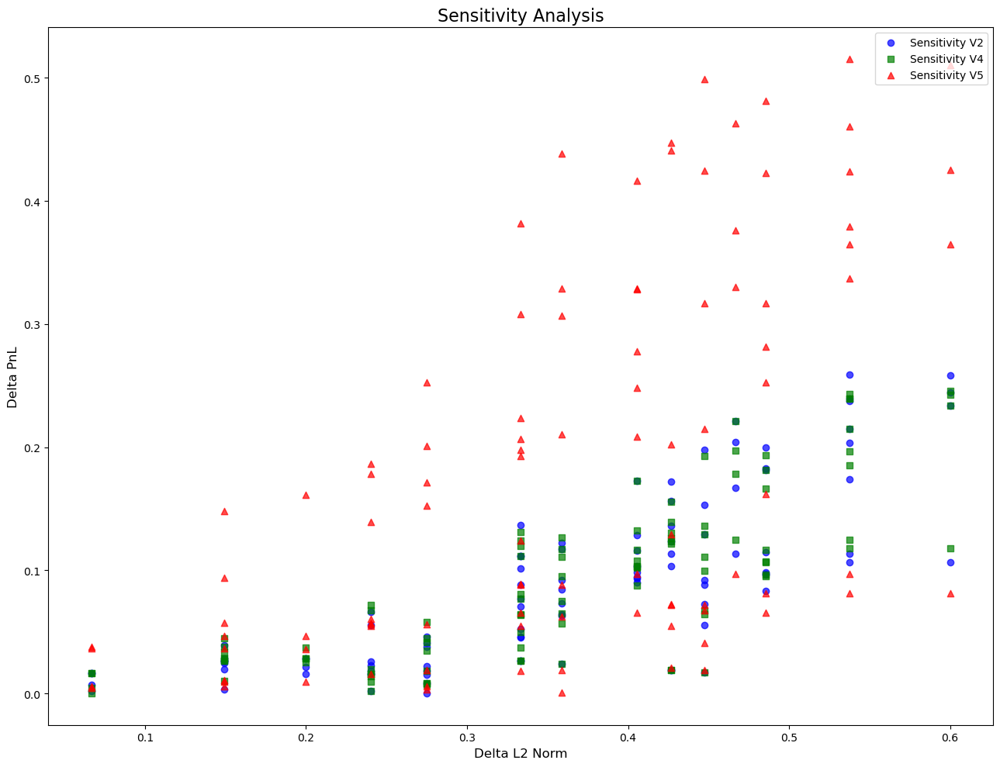

In [ ]:
# Assuming you have three DataFrames: sensitivityv3, sensitivityv4, sensitivityv5

# Plotting the scatter plots
plt.figure(figsize=(13, 10))

# Scatter plot for sensitivityv3
plt.scatter(sensitivity_v3['l2norm'], sensitivity_v3['DeltaPnL'], 
            color='blue', alpha=0.7, label='Sensitivity V2', marker='o')

# Scatter plot for sensitivityv4
plt.scatter(sensitivity_v4['l2norm'], sensitivity_v4['DeltaPnL'], 
            color='green', alpha=0.7, label='Sensitivity V4', marker='s')

# Scatter plot for sensitivityv5
plt.scatter(sensitivity_v5['l2norm'], sensitivity_v5['DeltaPnL'], 
            color='red', alpha=0.7, label='Sensitivity V5', marker='^')

# Adding titles and labels
plt.title('Sensitivity Analysis', fontsize=16)
plt.xlabel('Delta L2 Norm', fontsize=12)
plt.ylabel('Delta PnL', fontsize=12)

# Adding grid and legend
plt.legend(loc = "upper right")

# Display the plot
plt.tight_layout()
plt.show()



##### Remarks
- We verify through simulation of sample parameter vectors "near" our optimial parameter set $s^*$ that a change in PnL is proportional to the change in distance between samples parameter sets and optimal parameter set $s^*$. Moreover, above analysis shows that the change in PnL from change in parameter set is *smooth*; thus, this gives more confidence that the PnL as a function of our optimal parameter set is not just a single spike but may indeed form some local extremum that has nice local properties. 
- The Sensitivity analysis of backtest version five reveals that the change in PnL in response to change in norm is *more volatile* compared to other backtest versions. In other words, the optimized parameter set for this version of backtest may not be a local maximum with well defined local behaviour. To corroborate this statement, we see that the optimized parameter set for v5 is different from that of v4 and v5 and that the number of trades, or the number of days we change our position, is 40, a much smaller number than the usual 200 ~ 300 we see for other parameters. A smaller number of trades executed translates to less statistical power of the conclusion, so this may indicate that using the optimal paramter set for v5 will not guarantee good results OOS.

### Final Test: Using Test set to evaluate trading performance
Until now, we've looked at the in-sample performance of our statistical arbitrage strategy, showed the discrepancy of in-sample performance and out of sample performance by using our validaiton data set, and tried to look for a local optimum of parameter set $s$ by using a constrained grid search.

We've seen that $s^* = [-2.5, 0.5, 2.5, 0.5]$ was our optimal parameter set on validation data. What is left is to test the performance of this parameter set on our test data set, which should be considered as our "real" live trading data set. However, theoretically, it should make sense that our $s_sc$ value being negative should not provide material negative impact to our overall performance. Since these s-scores represent distance of our signal from the equilibrium mean in terms of standard deviation, closing at $s_sc = -0.5$ should be profitable, assuming the strategy is a valid mean reversion strategy. 

Hence, we choose our final paramter set to be $s = [-2.5, -0.5, 2.5, 0.5]$. Our starting date will be `2023-07-01` and end date will be `2024-08-05`, the final date of our data collection period. Recalling the fact that best performing parameter set had volatility of around 1/5 ~ 1/4 of the simple buy and hold-strategy, we choose a leverage of 3 to target volatility of somewhat lower value than what we would see in just buy-and-hold bitcoin and ethereum during the same period.

Processing dates:   0%|          | 0/402 [00:00<?, ?it/s]

Processing dates: 100%|██████████| 402/402 [00:21<00:00, 18.68it/s]


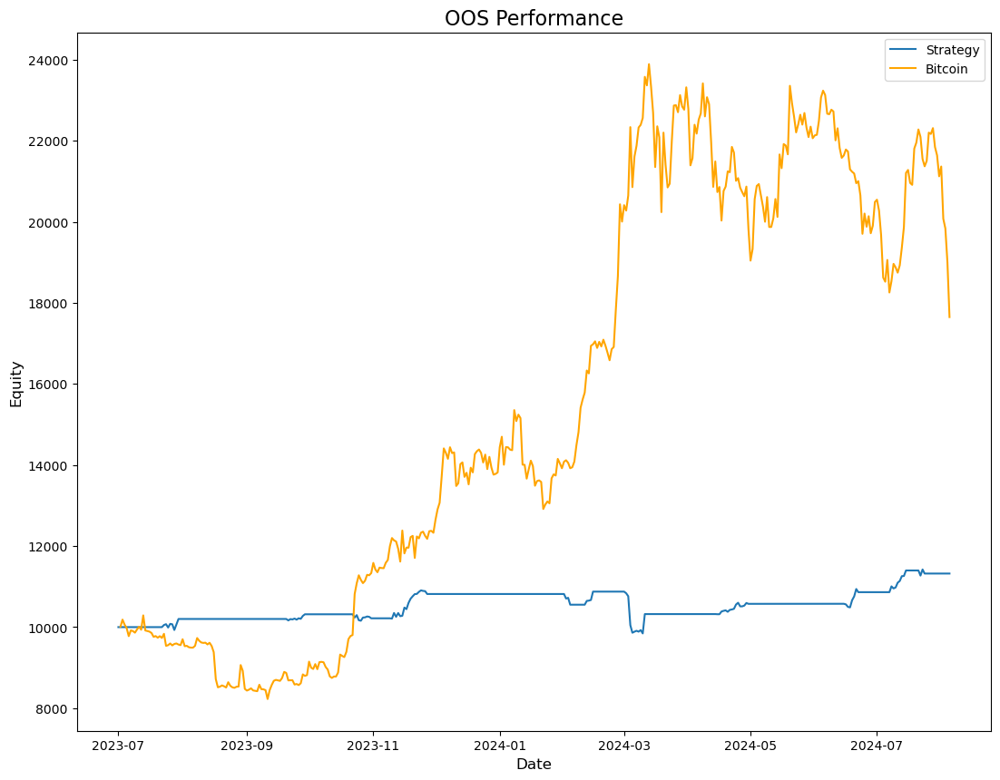

In [ ]:
# Use 0 transaction cost first
backtest_final_0bps = PCAstratBacktest(initial_equity=10000, target_leverage=1, start_date="2023-07-01", end_date="2024-08-05", tc_bps=0)
results_final_0bps = backtest_final_0bps.backtest_v3(s_bo = -2.5, s_sc = -0.5, s_so = 2.5, s_bc = 0.5, l_target=1, tau=60/365)

plt.figure(figsize = (13,10))
plt.plot(results_final_0bps[0], label = "Strategy")
plt.plot(initial_equity * np.cumprod(1+parent_df.loc["2023-07-01": "2024-08-05"]["bitcoin"].pct_change().dropna()), label = "Bitcoin", color = "orange")
plt.title("OOS Performance", fontsize = 16)
plt.xlabel("Date", fontsize = 12)
plt.ylabel("Equity", fontsize = 12)
plt.legend()

In [ ]:
# Performance
print('----------Strategy Performance----------------')
print(backtest_final_0bps.compute_performance(results_final_0bps[0]))
print('----------Bitcoin Performance----------------')
print(backtest_final_0bps.compute_performance(initial_equity * np.cumprod(1+parent_df.loc["2023-07-01": "2024-08-05"]["bitcoin"].pct_change().dropna())))

----------Strategy Performance----------------
{'Cumulative Return': 0.23237562898440567, 'CAGR': 0.14031697620942296, 'Annualized Volatility': 0.12396131351997065, 'Sharpe Ratio': 1.131941669743741, 'MDD': -0.10002797840756136, 'MDD period': Timedelta('20 days 00:00:00')}
----------Bitcoin Performance----------------
{'Cumulative Return': 0.7632299034931087, 'CAGR': 0.4294686456607819, 'Annualized Volatility': 0.3991964079137653, 'Sharpe Ratio': 1.0758329412461949, 'MDD': -0.26123602707494303, 'MDD period': Timedelta('145 days 00:00:00')}


Processing dates:   0%|          | 0/402 [00:00<?, ?it/s]

Processing dates: 100%|██████████| 402/402 [00:23<00:00, 17.27it/s]


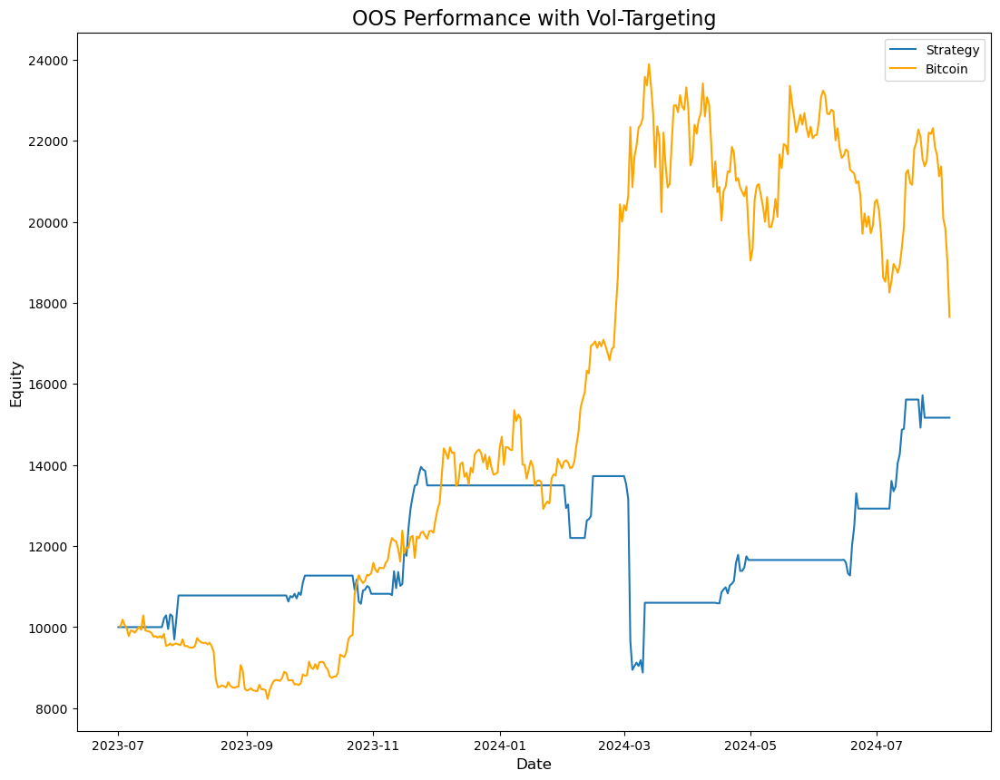

In [ ]:
# Use 0 transaction cost first
backtest_final_0bps_vt = PCAstratBacktest(initial_equity=10000, target_leverage=4, start_date="2023-07-01", end_date="2024-08-05", tc_bps=0)
results_final_0bps_vt = backtest_final_0bps_vt.backtest_v3(s_bo = -2.5, s_sc = -0.5, s_so = 2.5, s_bc = 0.5, l_target=4, tau=60/365)

plt.figure(figsize = (13,10))
plt.plot(results_final_0bps_vt[0], label = "Strategy")
plt.plot(initial_equity * np.cumprod(1+parent_df.loc["2023-07-01": "2024-08-05"]["bitcoin"].pct_change().dropna()), label = "Bitcoin", color = "orange")
plt.title("OOS Performance with Vol-Targeting", fontsize = 16)
plt.xlabel("Date", fontsize = 12)
plt.ylabel("Equity", fontsize = 12)
plt.legend(loc = "upper right")

In [139]:
backtest_inst.compute_performance(results_final_0bps_vt[0])

{'Cumulative Return': 0.516773993622919,
 'CAGR': 0.2992595288849196,
 'Annualized Volatility': 0.35430000900506486,
 'Sharpe Ratio': 0.8446500741710158,
 'MDD': -0.3636647390705006,
 'MDD period': Timedelta('107 days 00:00:00')}

In [ ]:
# Correlation of strategy and buy and hold bitcoin
v3_ret = results_final_0bps_vt[0].pct_change().dropna()
print(f"correlation between stat-arb strat and bitcoin buy-and-hold : {v3_ret.corr(parent_df.pct_change().dropna().loc['2023-07-01': '2024-08-05']['bitcoin'])}")

correlation between stat-arb strat and bitcoin buy-and-hold : -0.05164698249189959


Processing dates: 100%|██████████| 402/402 [00:23<00:00, 17.24it/s]


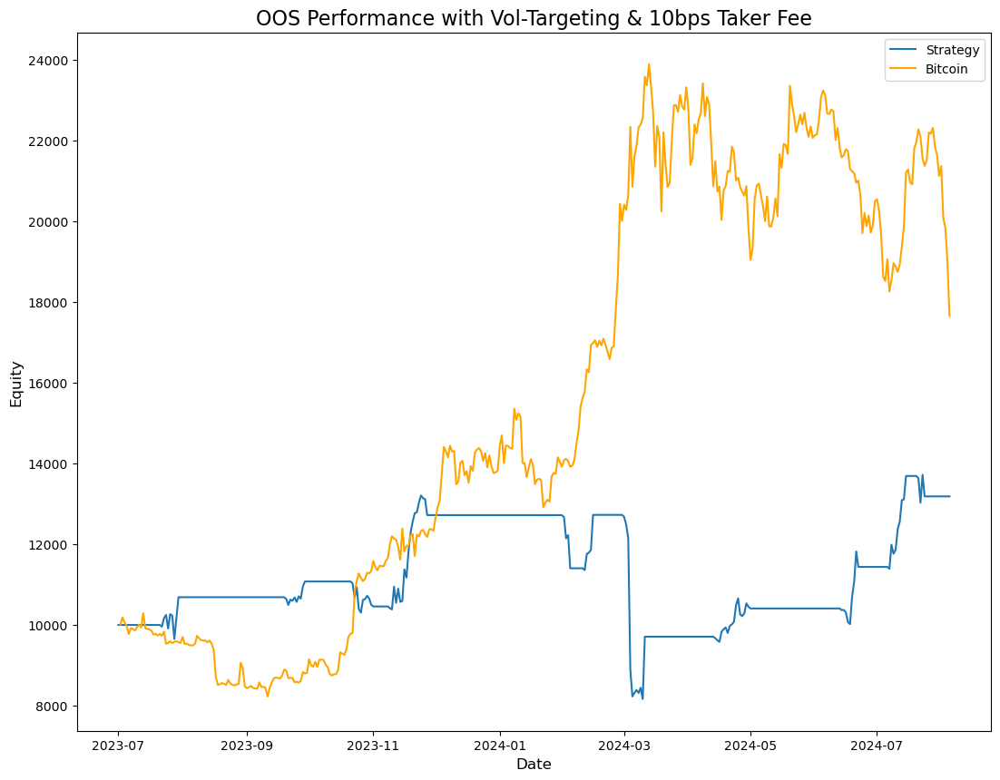

In [ ]:
# Use 0 transaction cost first
backtest_final_10bps_vt = PCAstratBacktest(initial_equity=10000, target_leverage=4, start_date="2023-07-01", end_date="2024-08-05", tc_bps=10)
results_final_10bps_vt = backtest_final_10bps_vt.backtest_v3(s_bo = -2.5, s_sc = -0.5, s_so = 2.5, s_bc = 0.5, l_target=4, tau=60/365)

plt.figure(figsize = (13,10))
plt.plot(results_final_10bps_vt[0], label = "Strategy")
plt.plot(initial_equity * np.cumprod(1+parent_df.loc["2023-07-01": "2024-08-05"]["bitcoin"].pct_change().dropna()), label = "Bitcoin", color = "orange")
plt.title("OOS Performance with Vol-Targeting & 10bps Taker Fee", fontsize = 16)
plt.xlabel("Date", fontsize = 12)
plt.ylabel("Equity", fontsize = 12)
plt.legend(loc = "upper right")

In [141]:
backtest_inst.compute_performance(results_final_10bps_vt[0])

{'Cumulative Return': 0.3184704488929071,
 'CAGR': 0.1897499984907458,
 'Annualized Volatility': 0.3533298617508074,
 'Sharpe Ratio': 0.5370335740956155,
 'MDD': -0.3816918331637081,
 'MDD period': Timedelta('107 days 00:00:00')}

In [ ]:
start_date = (pd.to_datetime("2023-07-01") - timedelta(days = 60)).strftime("%Y-%m-%d")


dynamic_sscore_df = pd.concat(backtest_final_0bps.dynamic_sscore_dict, axis = 1).T

aggregate_aux_df = results_final_0bps[1][list(results_final_0bps[1].keys())[0]]
for _, df in list(results_final_0bps[1].items())[1:]:
  last_row =  df.iloc[[-1]] # .iloc[[]] returns a df, which is needed for concatenation
  aggregate_aux_df = pd.concat([aggregate_aux_df, last_row], ignore_index= True) # Sets new index

dates = pd.date_range(start_date, "2024-08-05")


aggregate_aux_df.index = dates
aggregate_aux_df.head()

,avalanche,bitcoin,bitcoin-cash,bnb,cardano,dogecoin,ethereum,litecoin,polkadot-new,polygon,...,monero,near-protocol,okb,stellar,uniswap,ethereum-classic,injective,immutable-x,stacks,filecoin
2023-05-02,-0.000216,0.012865,-0.009053,-0.028140,0.000026,-0.008756,0.014529,0.011385,-0.001548,0.003764,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-03,0.010472,0.014470,-0.025857,-0.019797,-0.013041,-0.003667,0.024126,0.016091,0.000323,0.020277,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-04,0.005101,0.021861,-0.004542,-0.023484,-0.007686,-0.007761,0.017117,-0.000067,-0.005764,0.010206,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-05,-0.000316,0.025776,0.002834,-0.037444,-0.025097,-0.003010,0.057340,-0.019358,0.001594,-0.013153,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-06,-0.003165,0.026724,0.025482,-0.027759,-0.028376,-0.007722,0.037936,-0.024523,-0.004840,0.003009,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08-01,-0.155620,0.096109,NaN,0.003186,-0.083702,0.034315,-0.079208,NaN,-0.198236,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-08-02,-0.153796,0.063593,NaN,0.014576,-0.068089,0.052332,-0.100001,NaN,-0.141359,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-08-03,-0.123596,0.059016,NaN,-0.000002,-0.085465,0.053928,-0.094657,NaN,-0.125895,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-08-04,-0.089979,0.051022,NaN,-0.042196,-0.085672,0.069261,-0.101383,NaN,-0.133506,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


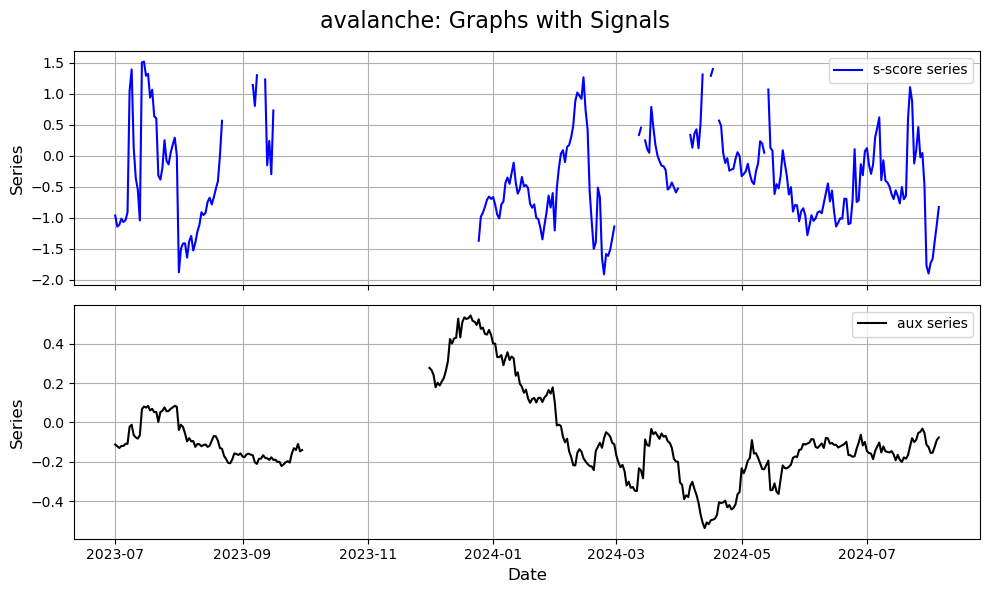

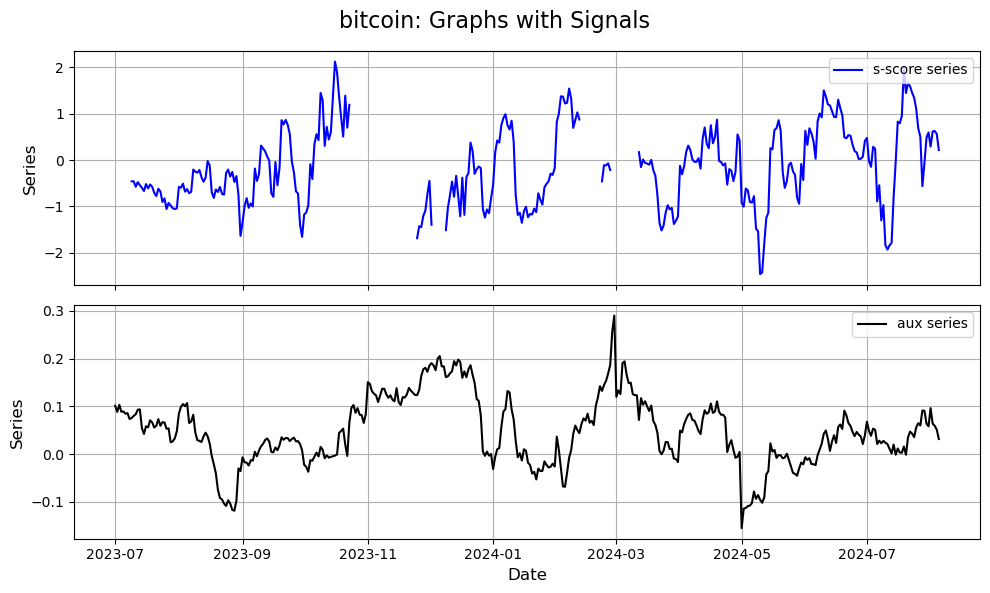

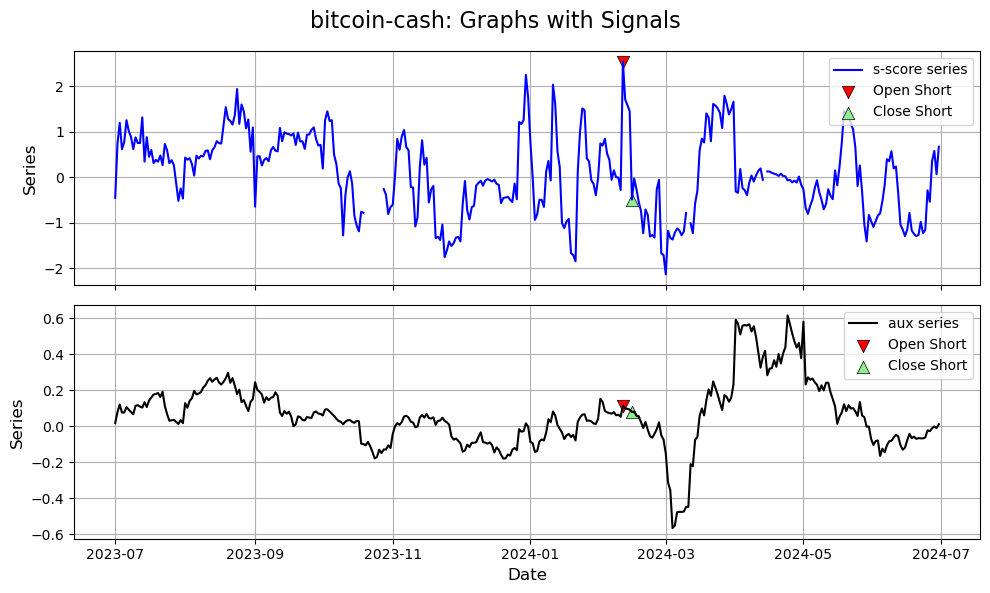

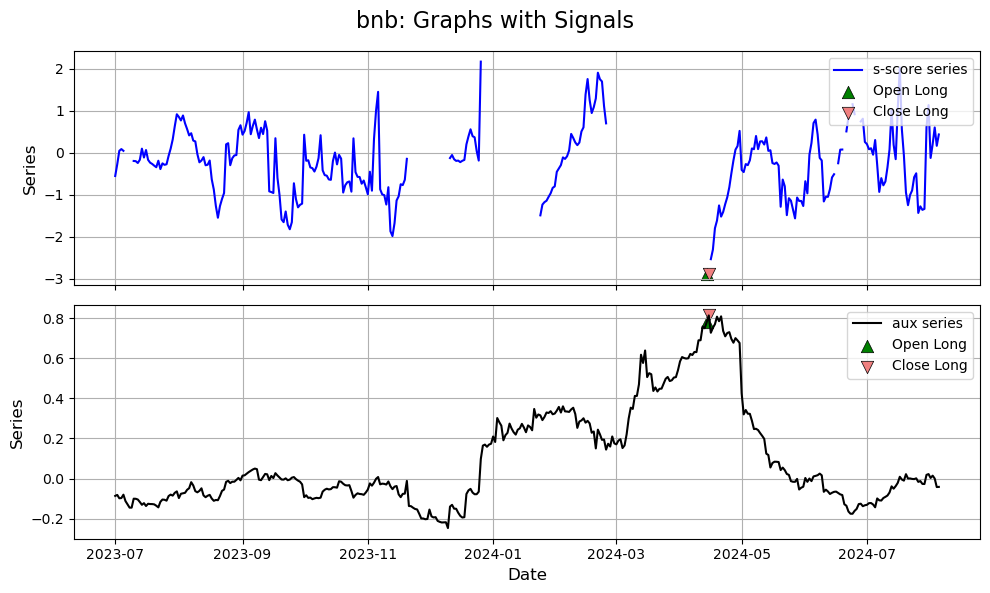

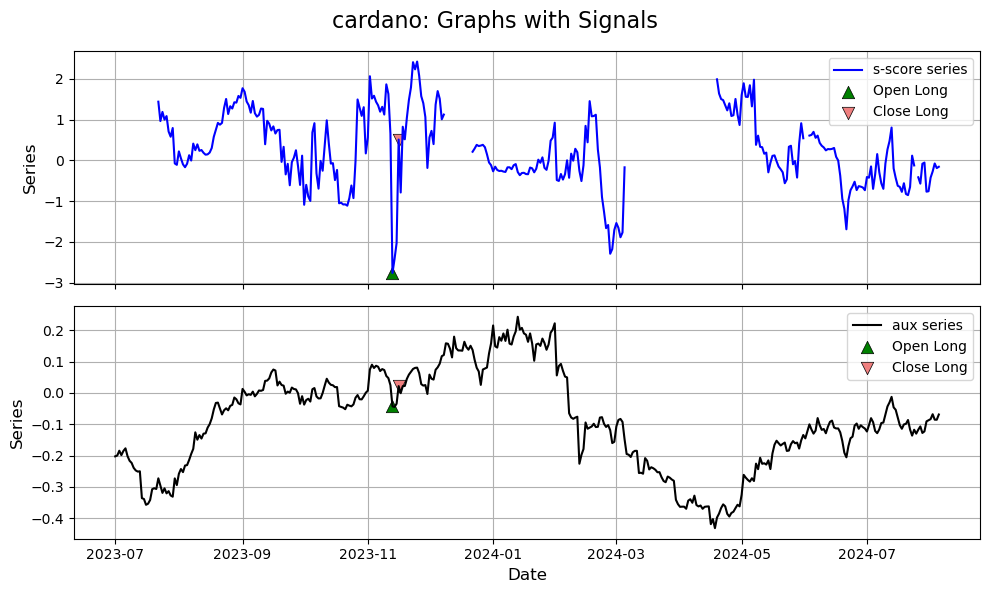

...

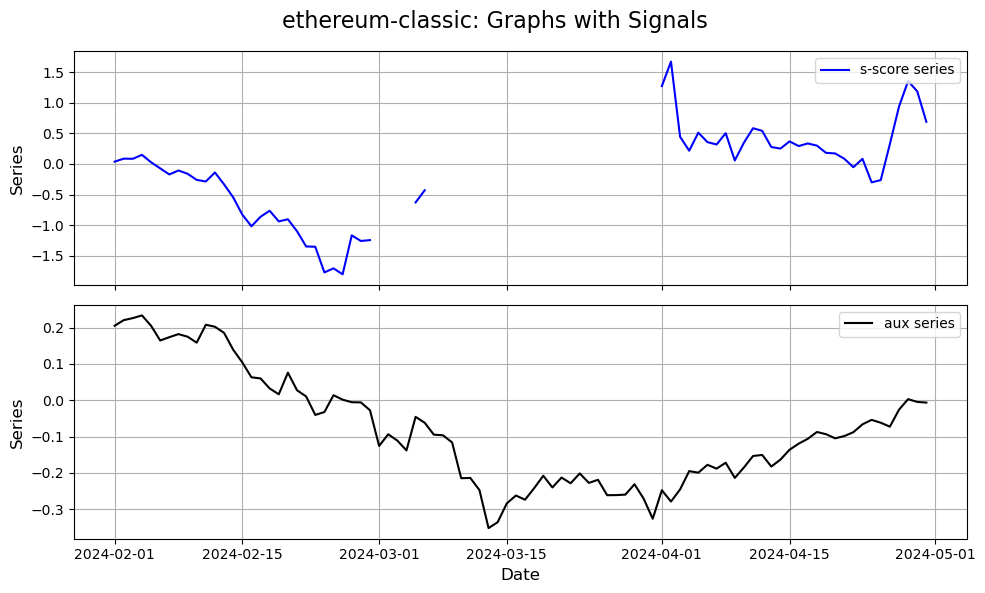

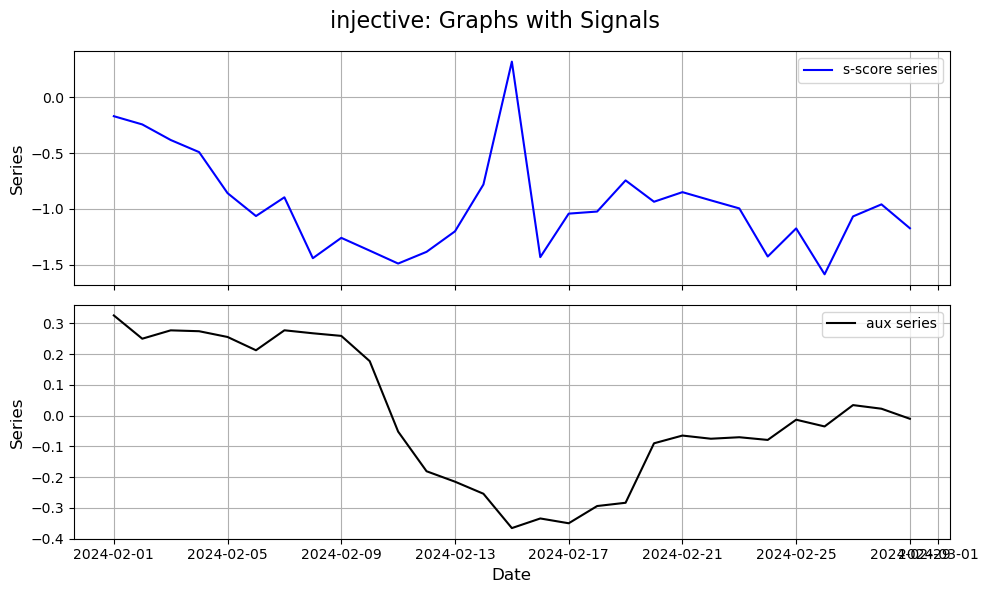

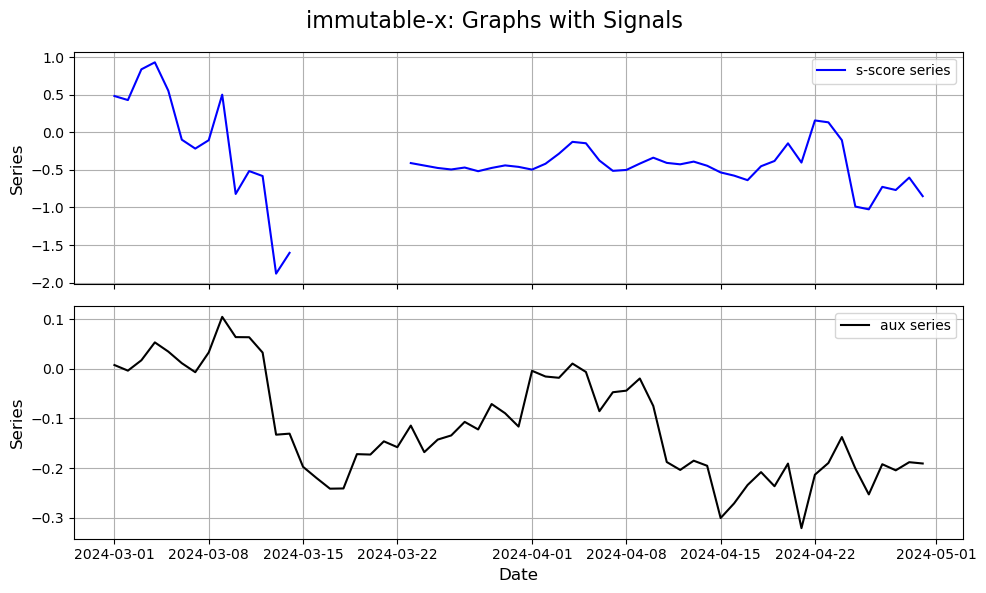

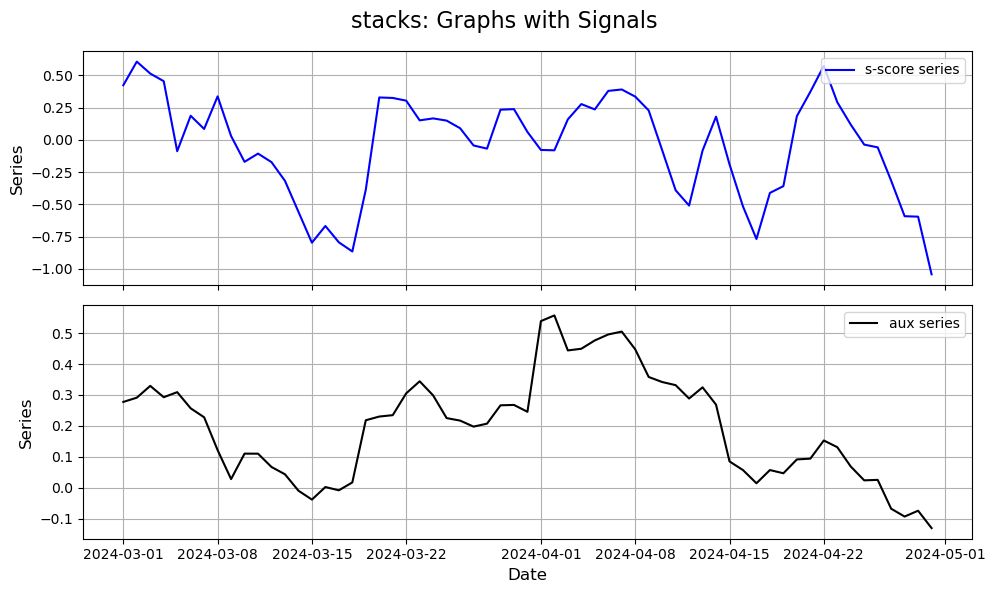

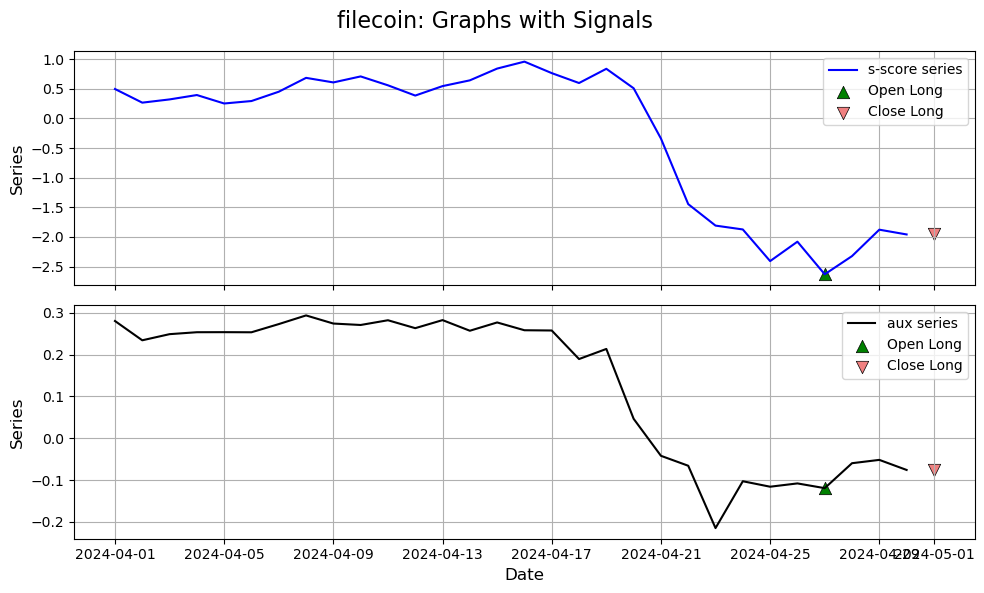

In [ ]:
# Plot signal on top and aux on bottom
for coin in aggregate_aux_df.columns:
  plot_coin_signal_and_price2(
    coin = coin,
    signal_dict= backtest_final_0bps.signal_dict, 
    top_df = dynamic_sscore_df,
    bottom_df = aggregate_aux_df,
    labels = ["s-score series", "aux series"]
    )

In [ ]:
dynamic_sscore_df = pd.concat(backtest_final_0bps.dynamic_sscore_dict, axis = 1).T
for coin in dynamic_sscore_df.columns:
  plot_coin_signal_and_price2(
    coin = coin,
    signal_dict= backtest_final_0bps.signal_dict, 
    aux_df = dynamic_sscore_df,
    price_df = parent_df)

In [ ]:
start_date = (pd.to_datetime("2023-07-01") - timedelta(days = 60)).strftime("%Y-%m-%d")

aggregate_sscores_df = results_final_0bps[1][list(results_final_0bps[1].keys())[0]]
for _, df in list(results_final_0bps[1].items())[1:]:
  last_row =  df.iloc[[-1]] # .iloc[[]] returns a df, which is needed for concatenation
  aggregate_aux_df = pd.concat([aggregate_aux_df, last_row], ignore_index= True) # Sets new index

dates = pd.date_range(start_date, "2024-08-05")


aggregate_aux_df.index = dates
aggregate_aux_df.head()

##### Remarks
- Our strategy performed poorly during the bull market of late 2023 ~ and first half of 2024. 
- The large drawdown from March seemed to be stemming from the fact that our trades on Bitcoin Cash and Shiba Inu coins on March turned out to be very bad. Especially, Long BCH stat-arb portfolio resulted in more than sixty percent loss. albeit BCH itself went up parabolically.
- There are some mean-reverting out of sample auxiliary series like Solana, Near-Protocol, Chainlink, and Cosmos. However, our signals generated from s-scores did not seem to be good entry nor exit points.

# 8. Bonus Strategy: Using PC 1 Portfolio
Notice that removing our statistical factor returns from asset returns did not return a mean-reverting auxiliary series for Bitcoin and Ethereum. This suggests that although PC 1 has a similar return profile as Ethereum or Bitcoin, the cumulative return series (synthetic price series) may diverge in absolute levels in the long run. Let's check.

In [12]:
# Initialize classes and set dates for formation period
end_date = "2023-01-02"
start_date = (datetime.strptime(end_date,"%Y-%m-%d") - timedelta(days = 365)).strftime("%Y-%m-%d")
PD_fp = PrepareData(current_date= end_date, rebal_date= end_date, window_size = 365, parent_df= parent_df)
PCA_fp = PerformPCA(PD_fp)
parent_df = parent_df.copy()

eigportret_fp = PCA_fp.eigportret_df
eigport_fp = PCA_fp.Q
eigport_fp.index = PD_fp.tu

eigport_fp

,PC1,PC2,PC3,PC4,PC5
avalanche,0.047488,0.016674,-0.024071,0.034518,-0.028499
bitcoin,0.080613,0.055315,-0.005003,-0.002096,-0.016652
bnb,0.070725,-0.027091,0.012417,-0.010006,-0.016416
cardano,0.055015,-0.020462,-0.012839,-0.011629,-0.007120
chainlink,0.049352,-0.028300,-0.043707,0.036288,-0.046199
cosmos,0.041389,-0.021811,-0.035382,0.034302,-0.031702
dogecoin,0.038901,-0.029149,-0.034091,-0.095408,0.111530
ethereum,0.060771,0.024512,0.006820,0.030270,-0.029476
ethereum-classic,0.039369,-0.024699,0.022675,0.015875,-0.063171
hex,0.026682,0.007582,-0.113275,0.131985,0.138182


Text(0.5, 1.0, 'PC 1 vs buy-and-hold top three components')

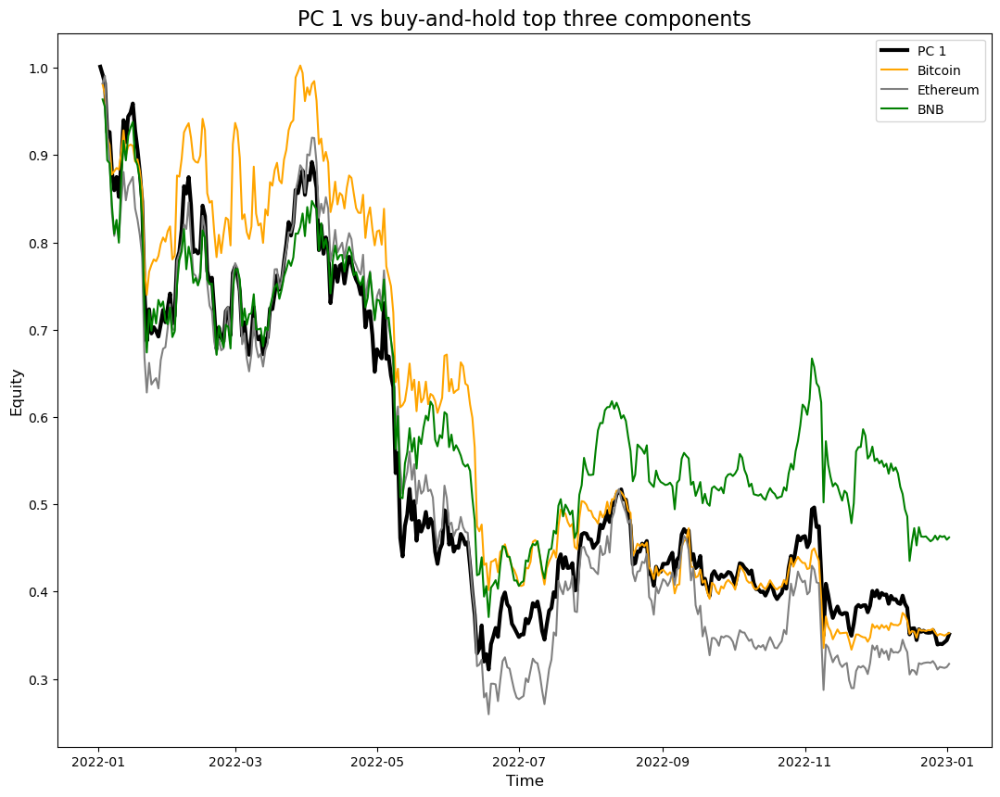

In [15]:
# Compare performance of major coins vs PC 1 
plt.figure(figsize = (13,10))
plt.plot(np.cumprod(1+eigportret_fp["PC1"]), label = "PC 1", color = "black", linewidth = 3)
plt.plot(np.cumprod(1+parent_df.loc[start_date : end_date]["bitcoin"].pct_change().dropna()), label = "Bitcoin", color = "orange")
plt.plot(np.cumprod(1+parent_df.loc[start_date : end_date]["ethereum"].pct_change().dropna()), label = "Ethereum", color = "grey")
plt.plot(np.cumprod(1+parent_df.loc[start_date : end_date]["bnb"].pct_change().dropna()), label = "BNB", color = "green")
plt.legend()
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Equity", fontsize = 12)
plt.title("PC 1 vs buy-and-hold top three components", fontsize = 16)

Text(0.5, 1.0, 'Synthetic Spread Series against PC 1')

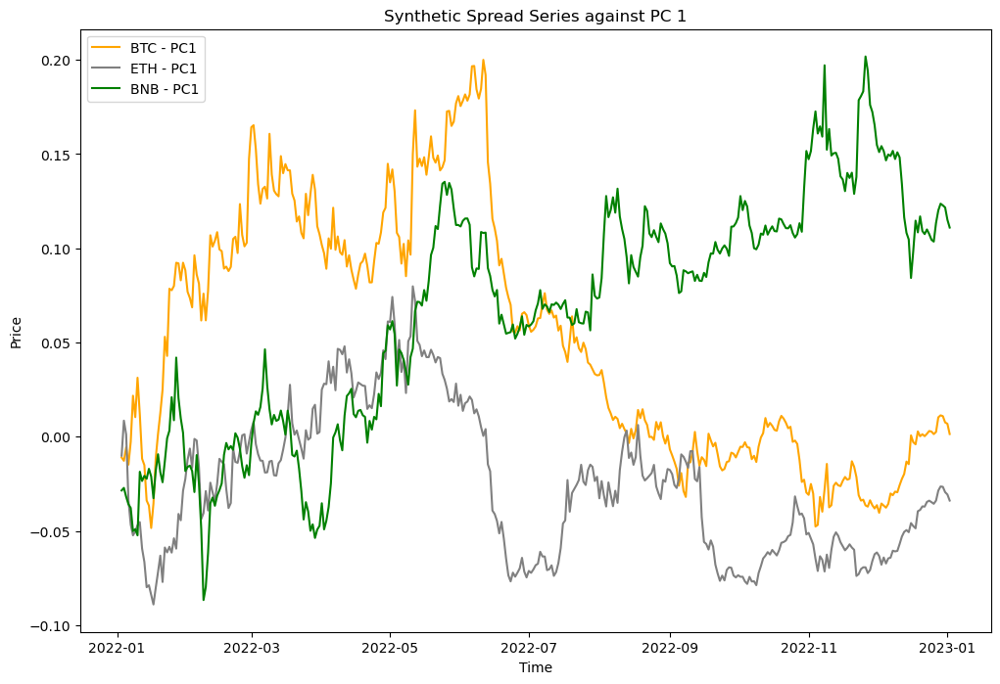

In [16]:
# Plot differences of synthetic prices
plt.figure(figsize = (12,8))
plt.plot(np.cumprod(1+parent_df.loc[start_date : end_date]["bitcoin"].pct_change().dropna()) - np.cumprod(1+eigportret_fp["PC1"]), label = "BTC - PC1", color = "orange", linewidth = 1.5)
plt.plot(np.cumprod(1+parent_df.loc[start_date : end_date]["ethereum"].pct_change().dropna()) - np.cumprod(1+eigportret_fp["PC1"]), label = "ETH - PC1", color = "grey", linewidth = 1.5)
plt.plot(np.cumprod(1+parent_df.loc[start_date : end_date]["bnb"].pct_change().dropna()) - np.cumprod(1+eigportret_fp["PC1"]), label = "BNB - PC1", color = "green", linewidth = 1.5)
plt.legend()
plt.xlabel("Time")
plt.ylabel("Price")
plt.title("Synthetic Spread Series against PC 1")

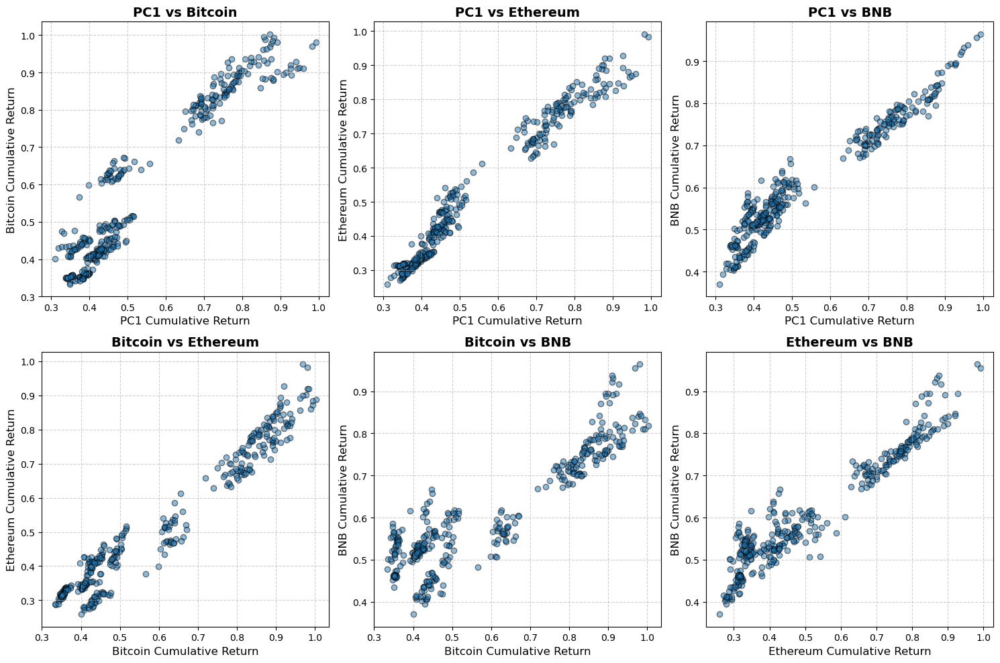

In [17]:
# Compute cumulative returns for each asset
cum_returns = {
    "PC1": np.cumprod(1 + eigportret_fp["PC1"]),
    "Bitcoin": np.cumprod(1 + parent_df.loc[start_date:end_date]["bitcoin"].pct_change().dropna()),
    "Ethereum": np.cumprod(1 + parent_df.loc[start_date:end_date]["ethereum"].pct_change().dropna()),
    "BNB": np.cumprod(1 + parent_df.loc[start_date:end_date]["bnb"].pct_change().dropna())
}

# Convert to DataFrame
cum_returns_df = pd.DataFrame(cum_returns)

# Create Scatter Plots
asset_pairs = [("PC1", "Bitcoin"), ("PC1", "Ethereum"), ("PC1", "BNB"), ("Bitcoin", "Ethereum"), ("Bitcoin", "BNB"), ("Ethereum", "BNB")]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = axes.flatten()

for ax, (x_asset, y_asset) in zip(axes, asset_pairs):
    ax.scatter(cum_returns_df[x_asset], cum_returns_df[y_asset], alpha=0.5, edgecolors='black')
    ax.set_xlabel(f"{x_asset} Cumulative Return", fontsize=12)
    ax.set_ylabel(f"{y_asset} Cumulative Return", fontsize=12)
    ax.set_title(f"{x_asset} vs {y_asset}", fontsize=14, fontweight="bold")
    ax.grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()


##### Remarks
- Above, we've plotted each value of our cumulative return series for one coin against the other (or PC 1). Notice how for some pairs we see a clear linear relationship. 

In [18]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import coint

# Initialize classes and set dates for formation period
end_date = "2023-01-02"
start_date = (datetime.strptime(end_date,"%Y-%m-%d") - timedelta(days = 365)).strftime("%Y-%m-%d")
PD_fp = PrepareData(current_date= end_date, rebal_date= end_date, window_size = 365, parent_df= parent_df)
PCA_fp = PerformPCA(PD_fp)
normalized_parent_df = (parent_df / parent_df.iloc[0,:]).copy()

eigportret_fp = PCA_fp.eigportret_df
eigport_fp = PCA_fp.Q
eigport_fp.index = PD_fp.tu

# --- 1) Construct synthetic "price series" for PC1 ---
pc1_price = (1 + eigportret_fp["PC1"]).cumprod()
pc1_price.name = "PC1_price"

start_date = pc1_price.index[0]
end_date   = pc1_price.index[-1]

# --- 2) Build price series for each coin (Bitcoin, Ethereum, BNB, etc.) ---
coin_list = PD_fp.tu.copy()  # whichever coins you want
start_date = pc1_price.index[0]
end_date   = pc1_price.index[-1]

# Suppose you already have:
# 1) pc1_price: a normalized "price" of your first principal component,
# 2) coin_list: a list of coin labels,
# 3) a dictionary or DataFrame of coin prices over the same period.

results = []
for coin in coin_list:
    # Align data for the coin and PC1
    df_merged = pd.concat([pc1_price, parent_df[coin]], axis=1).dropna()
    if df_merged.shape[0] < 30:
        # skip if not enough data
        continue
    
    # Direction 1: coint(PC1, coin)
    adf_1, pval_1, crit_1 = coint(df_merged["PC1_price"], df_merged[coin], trend='ct')
    
    # Direction 2: coint(coin, PC1)
    adf_2, pval_2, crit_2 = coint(df_merged[coin], df_merged["PC1_price"], trend='ct')
    
    # pick whichever direction gives lower (more negative) ADF stat
    if adf_1 < adf_2:
        best_adf_stat = adf_1
        best_pval     = pval_1
        best_trend    = "PC1 -> coin"
    else:
        best_adf_stat = adf_2
        best_pval     = pval_2
        best_trend    = "coin -> PC1"
    
    results.append({
        "coin": coin,
        "adf_stat_dir1": adf_1,
        "pval_dir1": pval_1,
        "adf_stat_dir2": adf_2,
        "pval_dir2": pval_2,
        "best_adf_stat": best_adf_stat,
        "best_pval": best_pval,
        "best_direction": best_trend
    })

df_results = pd.DataFrame(results)
# Sort so that the coin with the most negative ADF statistic appears on top
df_results = df_results.sort_values(by="best_adf_stat")

print(df_results)
print("\nCoin with most negative ADF in either direction:")
print(df_results.iloc[0])

  

                coin  adf_stat_dir1  pval_dir1  adf_stat_dir2  pval_dir2  \
12      polkadot-new      -3.954007   0.031284      -4.828996   0.001688   
14         shiba-inu      -4.205949   0.014786      -4.378586   0.008471   
15            solana      -3.742479   0.055308      -4.240976   0.013243   
2                bnb      -3.652959   0.069233      -3.945199   0.032070   
9                hex      -2.796103   0.360468      -3.641573   0.071188   
4          chainlink      -2.561948   0.486003      -3.610390   0.076766   
0          avalanche      -3.602977   0.078142      -3.327325   0.144054   
20               xrp      -3.541869   0.090225      -2.826246   0.345234   
3            cardano      -3.115390   0.216596      -3.467229   0.106869   
17              tron      -2.900767   0.308878      -3.462058   0.108102   
5             cosmos      -3.238414   0.171955      -3.279679   0.158585   
6           dogecoin      -3.005790   0.261247      -3.262109   0.164188   
18          

##### Remarks
- Best direction seems to be coin --> PC1 (coin as regressor and PC 1 as regressand)


In [19]:
# Try regression for those with ADF values less than 0.1 for BOTH directions

# Find coins satisfying condition
coint_coins = list(df_results[(df_results["pval_dir1"] <= 0.1) & (df_results["pval_dir2"] <= 0.1)]["coin"].values)
coint_coins.append("ethereum")

# Prepare regression
def coint_regression(coint_coins, PC1 ,start_date ,end_date ,adf_results ,parent_df = normalized_parent_df):
  
  params = {}
  resids = {}
  fitted_values = {}
  for coin in coint_coins:
    adf_results_coin = adf_results[adf_results["coin"] == coin]
    if adf_results_coin["best_direction"].to_list()[0] == "coin -> PC1": # If coin leads PC1
      # prep regression
      X = parent_df[coin].loc[start_date : end_date]  
      X = sm.add_constant(X)
      Y = PC1
      model = sm.OLS(Y,X)
      results = model.fit()

      params[coin] = results.params
      resids[coin] = results.resid
      fitted_values[coin] = results.fittedvalues
      
      print(results.summary())


    else: # If PC1 leads coin
      # prep regression
      X = PC1 
      X = sm.add_constant(X)
      Y = parent_df[coin].loc[start_date : end_date] 

      model = sm.OLS(Y,X)
      results = model.fit()

      params[coin] = results.params
      resids[coin] = results.resid
      fitted_values[coin] = results.fittedvalues
      
      print(results.summary())

  return params, resids, fitted_values
     


                            OLS Regression Results                            
Dep. Variable:              PC1_price   R-squared:                       0.968
Model:                            OLS   Adj. R-squared:                  0.968
Method:                 Least Squares   F-statistic:                 1.113e+04
Date:                Sun, 23 Feb 2025   Prob (F-statistic):          5.65e-275
Time:                        22:29:54   Log-Likelihood:                 734.25
No. Observations:                 366   AIC:                            -1465.
Df Residuals:                     364   BIC:                            -1457.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.2244      0.003     64.807   

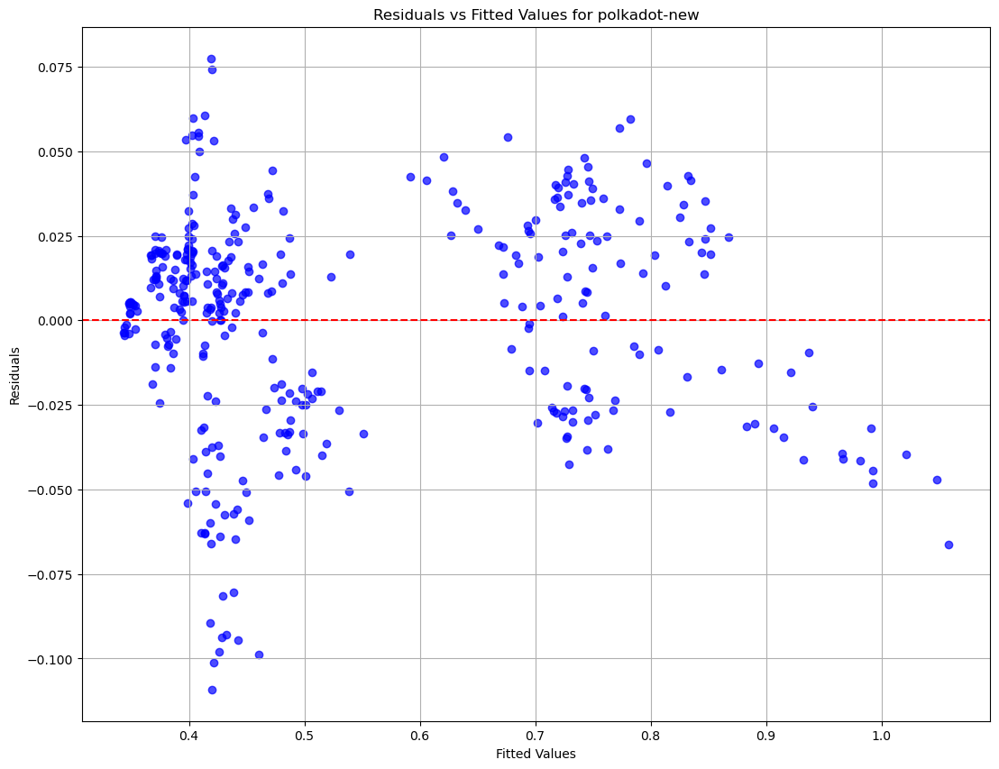

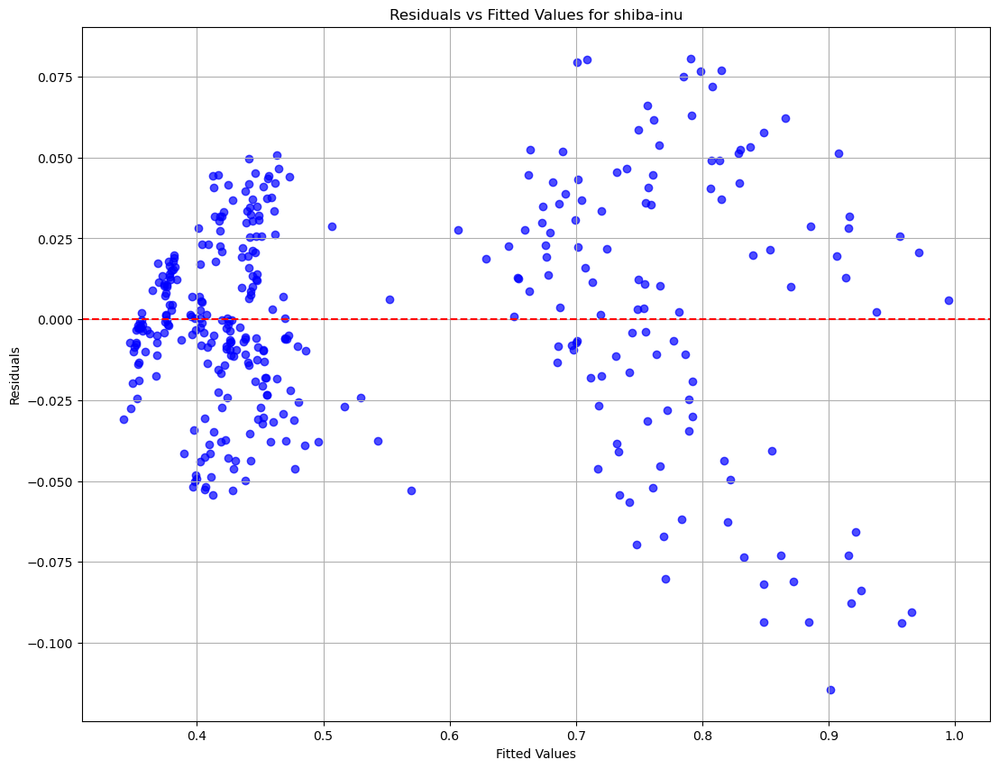

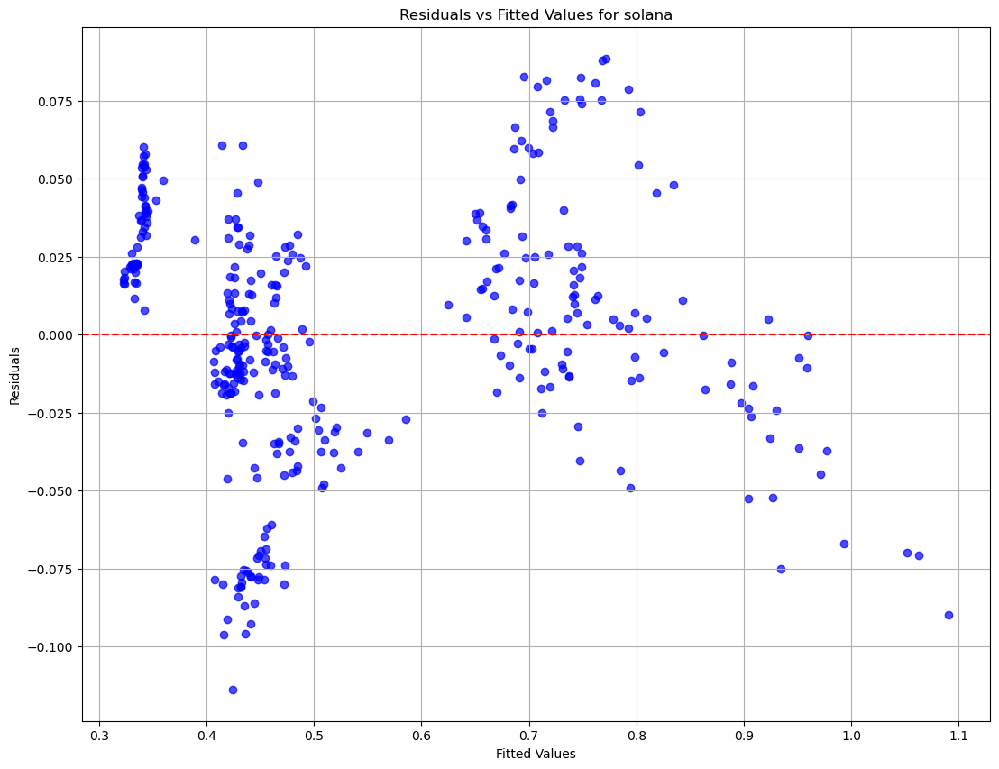

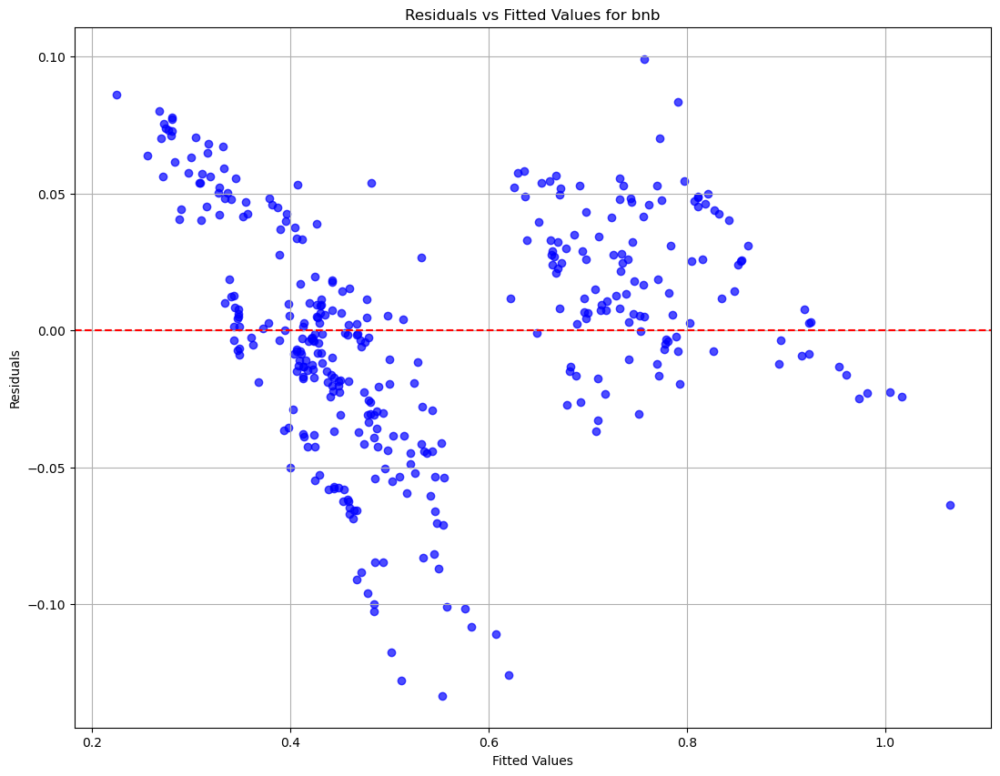

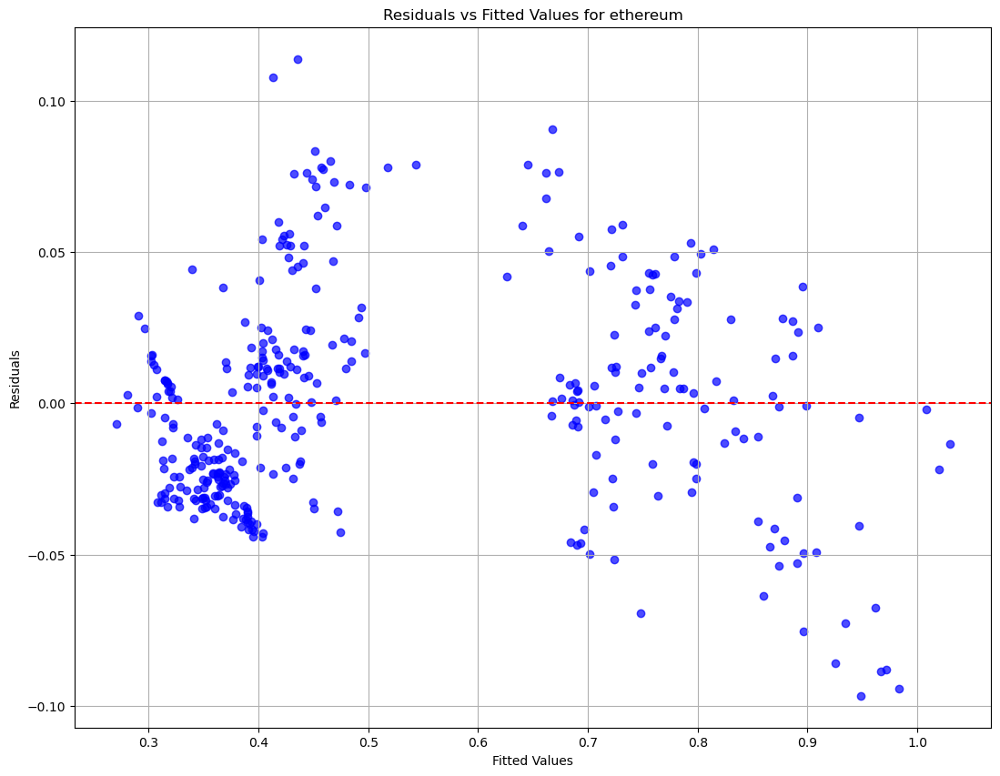

In [20]:
# Get OLS results
params_dict, resids_dict, fitted_values_dict = coint_regression(coint_coins=coint_coins, PC1 = pc1_price, start_date = start_date, end_date=end_date, adf_results = df_results, parent_df= normalized_parent_df)

for coin in coint_coins:
  plt.figure(figsize=(13, 10))
  plt.scatter(fitted_values_dict[coin], resids_dict[coin], color='blue', alpha=0.7)
  plt.axhline(0, color='red', linestyle='--')  # Reference line at 0
  plt.xlabel('Fitted Values')
  plt.ylabel('Residuals')
  plt.title(f'Residuals vs Fitted Values for {coin}')
  plt.grid(True)
  plt.show()

In [21]:
params_dict

{'polkadot-new': const           0.224357
 polkadot-new    0.792047
 dtype: float64,
 'shiba-inu': const        0.149756
 shiba-inu    0.847894
 dtype: float64,
 'solana': const     0.277872
 solana    0.822928
 dtype: float64,
 'bnb': const   -0.270431
 bnb      1.325133
 dtype: float64,
 'ethereum': const       -0.071217
 PC1_price    1.099312
 dtype: float64}

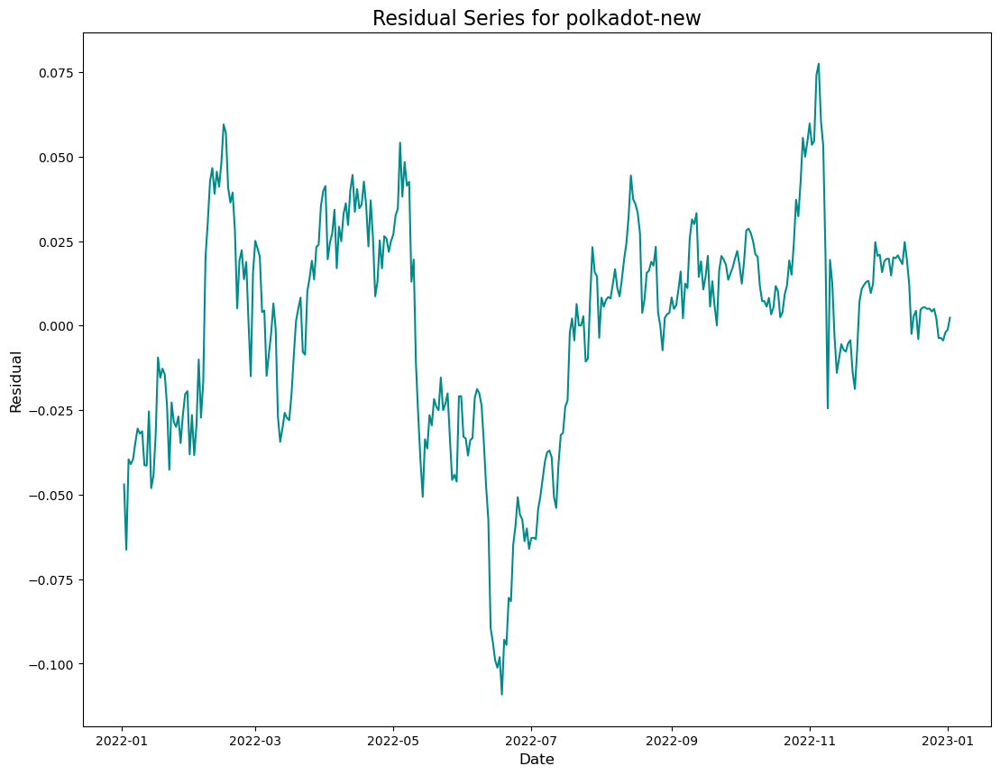

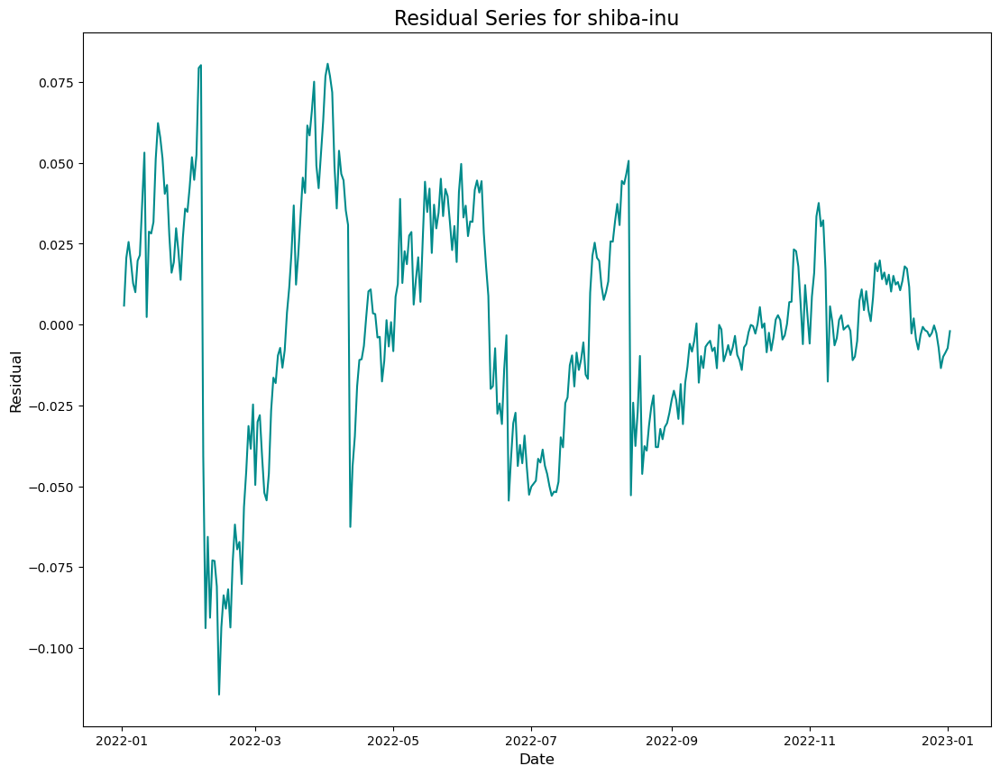

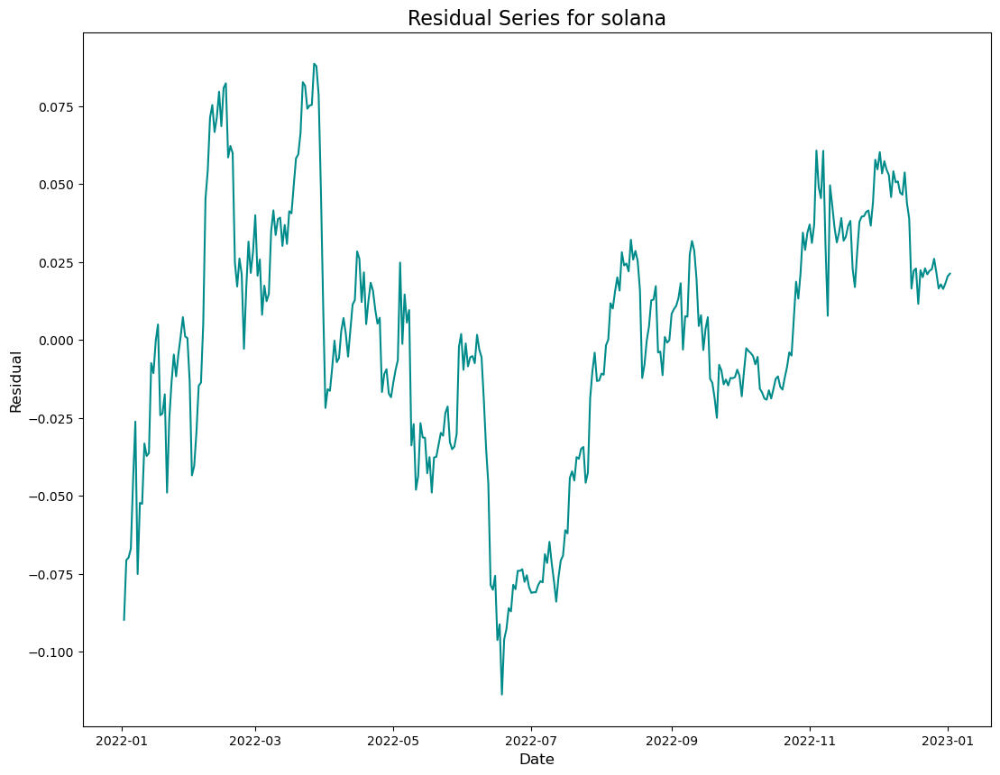

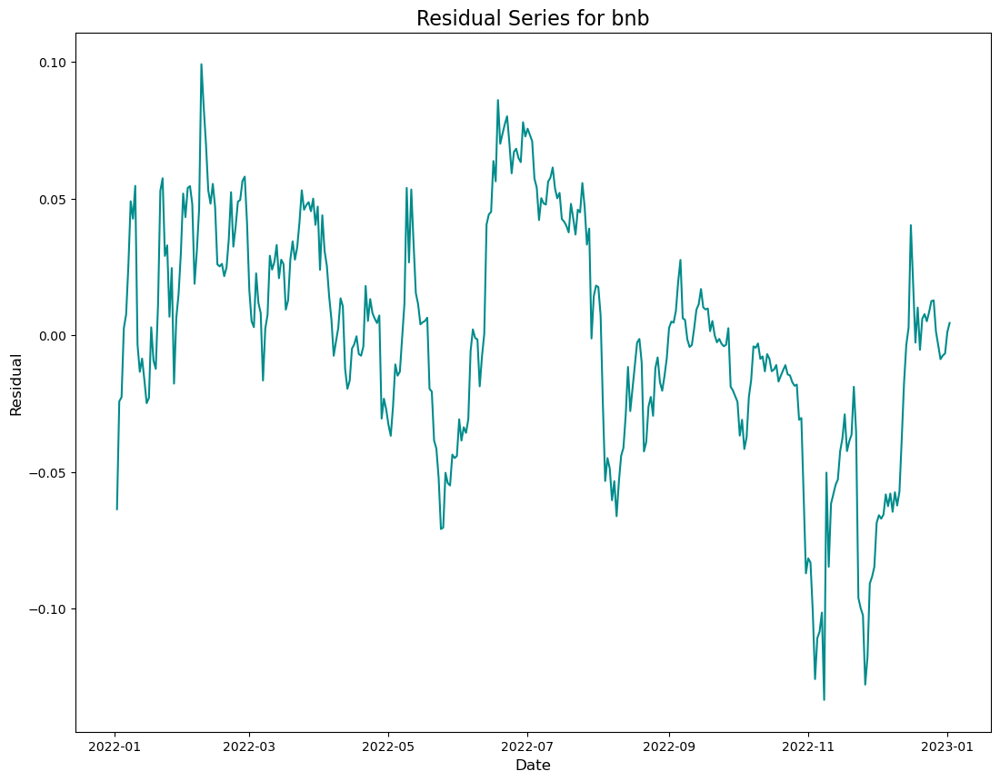

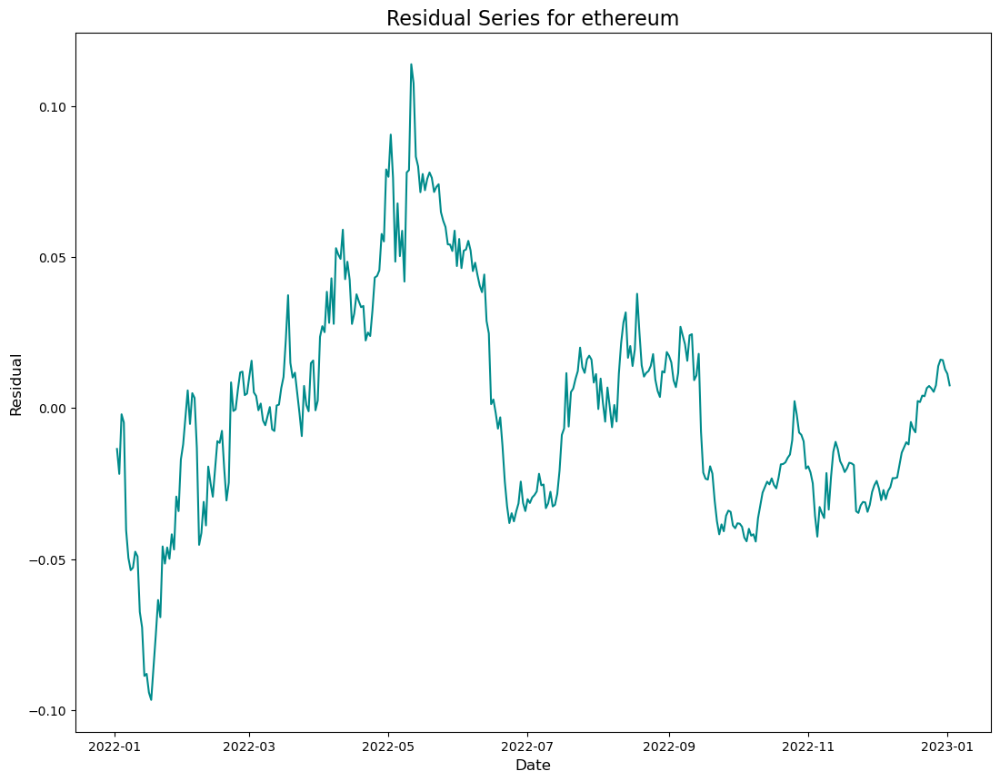

In [23]:
# PLot residual time series
for coin in coint_coins:
  plt.figure(figsize = (13,10))
  plt.plot(resids_dict[coin], label = f"coin", color = "darkcyan")
  plt.xlabel("Date", fontsize = 12)
  plt.ylabel("Residual", fontsize = 12)
  plt.title(f"Residual Series for {coin}", fontsize = 16)


##### Normalizing y-val
- The regression coefficients and residuals don't change for coins whose best direction is "coin -> PC1". However, for ethereum, the best direction is "PC1 -> coin". That is, we regress ethereum on PC1.
- One can show that the intercepts and residuals don't change in scale when the x is normalized. However, when one normalizes y by some constant $c$, then the intercept and residual is scaled by the constant $c$. Hence, if we don't normalize Ethereum by its initial price, then the intercepts and residuals will be large in absolute value. This can become a problem as the range of spread is much larger (that is instead, of investing 1 unit of )

In [24]:
# Prepare data
# Initialize classes and set dates for formation period
end_date = "2023-01-02"
start_date = (datetime.strptime(end_date,"%Y-%m-%d") - timedelta(days = 365)).strftime("%Y-%m-%d")
PD_fp = PrepareData(current_date= end_date, rebal_date= end_date, window_size = 365, parent_df= parent_df)
PCA_fp = PerformPCA(PD_fp)
normalized_parent_df = (parent_df / parent_df.iloc[0,:]).copy()

eigportret_fp = PCA_fp.eigportret_df
eigport_fp = PCA_fp.Q
eigport_fp.index = PD_fp.tu

eigport_fp

,PC1,PC2,PC3,PC4,PC5
avalanche,0.047488,0.016674,-0.024071,0.034518,-0.028499
bitcoin,0.080613,0.055315,-0.005003,-0.002096,-0.016652
bnb,0.070725,-0.027091,0.012417,-0.010006,-0.016416
cardano,0.055015,-0.020462,-0.012839,-0.011629,-0.007120
chainlink,0.049352,-0.028300,-0.043707,0.036288,-0.046199
cosmos,0.041389,-0.021811,-0.035382,0.034302,-0.031702
dogecoin,0.038901,-0.029149,-0.034091,-0.095408,0.111530
ethereum,0.060771,0.024512,0.006820,0.030270,-0.029476
ethereum-classic,0.039369,-0.024699,0.022675,0.015875,-0.063171
hex,0.026682,0.007582,-0.113275,0.131985,0.138182


In [36]:
def compute_cointegration_results(parent_df, current_date, window_size, rebal_date):
    """
    Computes cointegration results between the first principal component (PC1) and each coin in the dataset.

    Parameters:
    -----------
    parent_df    : pd.DataFrame
        A DataFrame containing price series for all coins.
    current_date : str
        The end date for the data period.
    window_size  : int
        The lookback window size in days to determine start_date.
    rebal_date   : str
        The date at which the trading universe is extracted.

    Returns:
    --------
    df_results : pd.DataFrame
        A DataFrame containing ADF statistics and p-values for each coin's cointegration test with PC1.
    """

    # --- 1) Set up the formation period ---

    # Initialize data preparation and PCA
    PD_fp = PrepareData(current_date=current_date, rebal_date=rebal_date, 
                        window_size=window_size, parent_df=parent_df)
    
    PCA_fp = PerformPCA(PD_fp)

    # Extract principal components and eigenportfolios
    eigportret_fp = PCA_fp.eigportret_df
    eigport_fp = PCA_fp.Q
    eigport_fp.index = PD_fp.tu  # Ensure proper indexing

    # --- 2) Construct synthetic "price series" for PC1 ---
    pc1_price = (1 + eigportret_fp["PC1"]).cumprod()
    pc1_price.name = "PC1_price"

    # Define the date range
    start_date = pc1_price.index[0]
    end_date = pc1_price.index[-1]

    # --- 3) Build price series for each coin ---
    coin_list = PD_fp.tu.copy()  # Trading universe

    results = []
    
    for coin in coin_list:
        # Align data for the coin and PC1
        df_merged = pd.concat([pc1_price, parent_df[coin]], axis=1).dropna()

        if df_merged.shape[0] < 30:  # Skip if not enough data
            continue

        # Direction 1: coint(PC1, coin)
        adf_1, pval_1, crit_1 = coint(df_merged["PC1_price"], df_merged[coin], trend='ct') # constant + time trend

        # Direction 2: coint(coin, PC1)
        adf_2, pval_2, crit_2 = coint(df_merged[coin], df_merged["PC1_price"], trend='ct')

        # Pick whichever direction gives lower (more negative) ADF stat
        if adf_1 < adf_2:
            best_adf_stat = adf_1
            best_pval = pval_1
            best_trend = "PC1 -> coin"
        else:
            best_adf_stat = adf_2
            best_pval = pval_2
            best_trend = "coin -> PC1"

        results.append({
            "coin": coin,
            "adf_stat_dir1": adf_1,
            "pval_dir1": pval_1,
            "adf_stat_dir2": adf_2,
            "pval_dir2": pval_2,
            "best_adf_stat": best_adf_stat,
            "best_pval": best_pval,
            "best_direction": best_trend
        })

    # Convert to DataFrame and sort results
    df_results = pd.DataFrame(results).sort_values(by="best_adf_stat")

    # Extract coins

    return df_results


# =============================================================================
# 1. HELPER FUNCTIONS: ROLLING REGRESSION & SPREAD CALCULATION
# =============================================================================
def rolling_regression(coin_series, pc1_series, formation_start, formation_end, best_direction):
    """
    Run a regression over the formation period (e.g. 365 days) to obtain
    the cointegration coefficient and compute the formation spread.
    
    Parameters:
      coin_series     : pd.Series of coin prices (normalized)
      pc1_series      : pd.Series for PC1 synthetic price
      formation_start : start date (datetime) for regression window
      formation_end   : end date (datetime) for regression window
      best_direction  : string; either "coin -> PC1" or "PC1 -> coin"
    
    Returns:
      beta0, beta1  : regression intercept and slope
      form_mean     : mean of the spread over the formation period
      form_std      : standard deviation of the spread over the formation period
    """
    df = pd.concat([coin_series, pc1_series], axis=1).dropna()
    df = df.loc[formation_start:formation_end]
    
    if best_direction == "coin -> PC1":
        # Regress PC1 on coin: PC1 = beta0 + beta1*coin + error
        X = df.iloc[:, 0]  # coin_series
        X = sm.add_constant(X)
        Y = df.iloc[:, 1]  # pc1_series
        model = sm.OLS(Y, X).fit()
        beta0 = model.params['const']
        beta1 = model.params[df.columns[0]]
        # Spread = PC1 - (beta1 * coin)
        formation_spread = df.iloc[:, 1] - (beta1 * df.iloc[:, 0])
    else:  # "PC1 -> coin"
        # Regress coin on PC1: coin = beta0 + beta1*pc1 + error
        X = df.iloc[:, 1]  # pc1_series
        X = sm.add_constant(X)
        Y = df.iloc[:, 0]  # coin_series
        model = sm.OLS(Y, X).fit()
        beta0 = model.params['const']
        beta1 = model.params[df.columns[1]]
        # Spread = coin - (beta1 * pc1)
        formation_spread = df.iloc[:, 0] - (beta1 * df.iloc[:, 1])
    
    form_mean = formation_spread.mean()
    form_std = formation_spread.std()
    return beta0, beta1, form_mean, form_std

def compute_spread_out_of_sample(coin_series, pc1_series, beta1, best_direction):
    """
    Compute the spread on out-of-sample data using fixed regression parameters.
    
    Parameters:
      coin_series : pd.Series of coin prices (normalized) for out-of-sample period
      pc1_series  : pd.Series for PC1 synthetic price for out-of-sample period
      beta0, beta1: regression estimates from formation period
      best_direction: string indicating regression direction
    
    Returns:
      spread      : pd.Series of computed spread over out-of-sample period
    """
    df = pd.concat([coin_series, pc1_series], axis=1).dropna()
    if best_direction == "coin -> PC1":
        spread = df.iloc[:, 1] - (beta1 * df.iloc[:, 0])
    else:
        spread = df.iloc[:, 0] - (beta1 * df.iloc[:, 1])
    return spread

# =============================================================================
# 2. SIGNAL GENERATION FUNCTIONS
#    a) Fixed ZScore signals (using fixed formation mean/std)
#    b) Dynamic ZScore signals (as before)
#    c) Bollinger band signals (as before)
# =============================================================================
def generate_fixed_zscore_signals(spread, fixed_mean, fixed_std, entry_thresh=2.0):
    """
    Use fixed (formation) spread statistics to generate signals.
    
    Signal rules:
      - When spread > fixed_mean + entry_thresh * fixed_std  ==> signal = -1 (short spread)
      - When spread < fixed_mean - entry_thresh * fixed_std  ==> signal = +1 (long spread)
      - Exit (signal = 0) when spread reverts to the fixed_mean.
    
    Parameters:
      spread      : pd.Series of spread over the out-of-sample period
      fixed_mean  : formation period spread mean
      fixed_std   : formation period spread standard deviation
      entry_thresh: threshold multiplier
      
    Returns:
      signals     : pd.Series of signals (+1, -1, 0)
    """
    signals = pd.Series(0, index=spread.index)
    position = 0
    for t in range(len(spread)):
        current_spread = spread.iloc[t]
        if position == 0:
            if current_spread > fixed_mean + entry_thresh * fixed_std:
                position = -1
            elif current_spread < fixed_mean - entry_thresh * fixed_std:
                position = 1
        else:
            # Exit if the spread crosses the fixed mean
            if (position == 1 and current_spread >= fixed_mean) or (position == -1 and current_spread <= fixed_mean):
                position = 0
        signals.iloc[t] = position
        if t == len(spread): # Make sure end of period position is closed
            signals.iloc[t] = 0
    return signals

def generate_signals_zscore(spread, window=20, entry_thresh=2.0):
    """
    Generate dynamic z-score signals using rolling mean and std.
    
    Parameters:
      spread      : pd.Series of spread
      window      : rolling window length
      entry_thresh: z-score threshold for entry
      
    Returns:
      signals     : pd.Series of signals (+1, -1, 0)
      zscore      : the rolling z-score series
    """
    ma = spread.rolling(window=window).mean()
    std = spread.rolling(window=window).std()
    zscore = (spread - ma) / std
    signals = pd.Series(0, index=spread.index)
    position = 0
    for t in range(window, len(spread)):
        z = zscore.iloc[t]
        if position == 0:
            if z > entry_thresh:
                position = -1
            elif z < -entry_thresh:
                position = 1
        else:
            if (position == 1 and z >= 0) or (position == -1 and z <= 0):
                position = 0
        signals.iloc[t] = position
        if t == len(spread): # Make sure end of period position is closed
            signals.iloc[t] = 0
    return signals, zscore

def generate_signals_bollinger(spread, window=20, band_multiplier=2.0):
    """
    Generate trading signals using Bollinger bands.
    
    Parameters:
      spread         : pd.Series of spread
      window         : rolling window length
      band_multiplier: multiplier for the standard deviation
      
    Returns:
      signals     : pd.Series of signals (+1, -1, 0)
      ma          : moving average of spread
      upper_band  : upper Bollinger band
      lower_band  : lower Bollinger band
    """
    ma = spread.rolling(window=window).mean()
    std = spread.rolling(window=window).std()
    upper_band = ma + band_multiplier * std
    lower_band = ma - band_multiplier * std
    signals = pd.Series(0, index=spread.index)
    position = 0
    for t in range(window, len(spread)):
        current_spread = spread.iloc[t]
        current_ma = ma.iloc[t]
        if position == 0:
            if current_spread > upper_band.iloc[t]:
                position = -1
            elif current_spread < lower_band.iloc[t]:
                position = 1
        else:
            if (position == 1 and current_spread >= current_ma) or (position == -1 and current_spread <= current_ma):
                position = 0
        signals.iloc[t] = position
        if t == len(spread): # Make sure end of period position is closed
            signals.iloc[t] = 0
    return signals, ma, upper_band, lower_band

# =============================================================================
# 3. SIMULATION FUNCTION
#    (Computes daily PnL from changes in spread, deducts fees, counts trades.)
# =============================================================================


def simulate_spread_dailyMTM(
    x_prices: pd.Series,
    y_prices: pd.Series,
    signals: pd.Series,
    b: float,
    initial_equity: float = 1.0,
    fee_open: float = 0.0,
    fee_close: float = 0.0,
):
    """
    Simulate a 'spread' strategy where:
      1) We hold the same (q_x, q_y) as long as the signal remains the same.
      2) Each day, the equity changes by [port_val(t) - port_val(t-1)].
      3) When the signal changes, we close the old position at today's price
         (which is effectively already accounted for by daily PnL),
         then open a new position if the new signal != 0, using all current equity.

    Position sizing logic:
      - If signal[t] = +1, we do "long the spread" => q_y>0, q_x<0.
      - If signal[t] = -1, we do "short the spread" => q_y<0, q_x>0.
      - We define 'gross notional' = x_t + b*y_t (in some sense) to
        decide q_x, q_y so that sum of |long|+|short| = current equity.
      - Each time we open, we may subtract an 'open fee' (fee_open * equity).
      - Each time we close, we may subtract a 'close fee' (fee_close * equity).

    NOTE: Because we do daily PnL = (port_val[t] - port_val[t-1]),
          we are effectively 'marking to market' the position each day
          and rolling that into equity. 

    Parameters
    ----------
    x_prices : pd.Series
        Price of asset X (index-aligned with y_prices, signals).
    y_prices : pd.Series
        Price of asset Y.
    signals  : pd.Series
        +1 = long spread, -1 = short spread, 0 = flat. 
        The position is recalculated only when the signal changes from the prior day.
    b        : float
        Hedge ratio in the spread = y - b*x.
    initial_equity : float
        Starting equity.
    fee_open, fee_close : float
        Fee rates for opening or closing a position, each as fraction of equity
        at the moment of the transaction. E.g., 0.001 = 0.1%.

    Returns
    -------
    equity_curve : pd.Series
        The daily equity after we do the daily PnL update.
    port_val     : pd.Series
        The daily portfolio value = q_x*x + q_y*y.
    position_ser : pd.Series
        The position each day: +1, -1, or 0.
    qx_series    : pd.Series
        The actual quantity of x held each day.
    qy_series    : pd.Series
        The actual quantity of y held each day.
    """

    # 1) Align data
    idx = x_prices.index.intersection(y_prices.index).intersection(signals.index)
    idx = idx.sort_values()
    x_prices = x_prices.loc[idx]
    y_prices = y_prices.loc[idx]
    signals  = signals.loc[idx]

    N = len(idx)
    if N < 2:
        raise ValueError("Insufficient data after alignment.")

    # 2) Storage
    equity_array   = np.zeros(N)
    port_val_array = np.zeros(N)
    position_array = np.zeros(N)
    qx_array       = np.zeros(N)
    qy_array       = np.zeros(N)

    # 3) Initialize
    equity  = initial_equity
    q_x     = 0.0
    q_y     = 0.0
    position= 0   # +1, -1, or 0

    # We define port_val(0) = 0 if we start with no position
    port_val_prev = 0.0

    # Write to arrays for day 0
    equity_array[0]   = equity
    port_val_array[0] = 0.0
    position_array[0] = 0
    qx_array[0]       = 0.0
    qy_array[0]       = 0.0

    # Helper function to compute q_x, q_y for "using all equity"
    def calc_position(sig, eq, x_t, y_t):
        """
        Return (q_x, q_y) for a new position that invests 'eq' in the spread.
        For +1 => q_y>0, q_x<0. For -1 => q_y<0, q_x>0.
        We'll do sum of absolute notionals = eq:
           |q_y * y_t| + |q_x * x_t| = eq
        with q_x = -b*q_y (for 'long spread'), but we incorporate sign.
        """
        if sig == 0:
            return 0.0, 0.0
        sign = np.sign(sig)  # +1 or -1
        denom = (y_t + b*x_t)
        # If denom <= 0, you might handle differently
        if denom <= 0:
            return 0.0, 0.0
        # E.g. "long spread" => q_y>0, q_x<0 => q_x = -b*q_y
        # We do q_y = sign * eq/(y_t + b*x_t), q_x = - sign * b * eq/(y_t + b*x_t).
        # => if sign=+1 => q_y>0, q_x<0. If sign=-1 => q_y<0, q_x>0
        qy = sign * eq / denom
        qx = -sign * b * eq / denom
        return qx, qy

    # 4) Iterate day by day
    trade_count = 0

    for i in range(1, N):
        date_prev = idx[i-1]
        date_curr = idx[i]

        # (A) Calculate daily PnL from day-1 to day i
        # port_val at day i-1:
        pv_old = q_x * x_prices.loc[date_prev] + q_y * y_prices.loc[date_prev]
        # port_val at day i:
        pv_new = q_x * x_prices.loc[date_curr] + q_y * y_prices.loc[date_curr]

        daily_pnl = pv_new - pv_old
        # Add that daily PnL to equity:
        equity += daily_pnl

        # (B) Check if the signal changes => possibly close old position, open new
        old_pos = position
        new_pos = signals.iloc[i]

        if new_pos != old_pos:
            # => close existing position (if old_pos != 0)
            if old_pos != 0:
                # subtract a close fee if desired
                close_fee = fee_close * equity
                equity -= close_fee
                # set position = 0, q_x = q_y = 0
                q_x = 0.0
                q_y = 0.0
                position = 0
                trade_count += 1  # or +2 if you count each leg

            # => open new position (if new_pos != 0)
            if new_pos != 0:
                open_fee = fee_open * equity
                equity -= open_fee
                trade_count += 1

                # size the new position
                x_t = x_prices.loc[date_curr]
                y_t = y_prices.loc[date_curr]
                q_x, q_y = calc_position(new_pos, equity, x_t, y_t)
                position = new_pos

        # Now record for day i
        position_array[i] = position
        port_val_array[i] = q_x*x_prices.loc[date_curr] + q_y*y_prices.loc[date_curr]
        equity_array[i]   = equity
        qx_array[i]       = q_x
        qy_array[i]       = q_y

    # Convert to pd.Series
    equity_curve = pd.Series(equity_array, index=idx)
    port_val     = pd.Series(port_val_array, index=idx)
    position_ser = pd.Series(position_array, index=idx)
    qx_series    = pd.Series(qx_array, index=idx)
    qy_series    = pd.Series(qy_array, index=idx)

    return equity_curve, port_val, position_ser, qx_series, qy_series, trade_count



# =============================================================================
# 4. BACKTESTING WITH REBALANCING
#
# For a given coin, we assume that every “rebalancing date” (here monthly)
# we re-run a regression on the preceding 365-day window. Then, we compute the
# out-of-sample spread (from the rebalancing date until the next rebalance) using
# the fixed regression estimates. Depending on the strategy, signals are generated
# using fixed or dynamic thresholds.
# =============================================================================
def backtest_rebalancing_strategy(coin, pc1_series, coin_series, all_dates, formation_window=365,
                                  strategy_type="fixed_zscore", entry_thresh=2.0, fee=0.001,
                                  initial_equity=1.0, best_direction="coin -> PC1"):
    """
    Backtest a rebalanced cointegration strategy.
    
    Parameters:
      coin           : string; coin name (for labeling)
      pc1_series     : pd.Series for PC1 synthetic price
      coin_series    : pd.Series for coin price (normalized)
      all_dates      : pd.DatetimeIndex covering the entire period
      formation_window: int; number of days for regression formation (e.g., 365)
      strategy_type  : string; one of "fixed_zscore", "zscore_dynamic", "bollinger"
      entry_thresh   : threshold for entry signals
      fee            : fee per leg (default 0.001)
      initial_equity : starting equity
      best_direction : string; "coin -> PC1" or "PC1 -> coin" (from df_results)
      
    Returns:
      overall_equity : pd.Series of cumulative equity over the entire period
      total_trades   : total number of executed trade legs
      overall_signals: pd.Series of signals (for inspection)
    """
    # Determine rebalancing dates.
    # Here we choose monthly rebalancing; the first rebalancing date must be at least
    # formation_window days after the start.
    rebal_dates = pd.date_range(start=all_dates[0] + pd.Timedelta(days=formation_window),
                                end=all_dates[-1], freq='M')
    
    overall_equity = pd.Series(dtype=float)
    overall_signals = pd.Series(dtype=int)
    total_trades = 0
    current_equity = initial_equity
    
    for i, rebal_date in enumerate(rebal_dates):
        # Define the formation window: [rebal_date - formation_window, rebal_date]
        formation_start = rebal_date - pd.Timedelta(days=formation_window)
        formation_end = rebal_date
        
        # Skip if the formation window is not fully available.
        if formation_start < all_dates[0]:
            continue
        
        # Run regression on the formation period.
        beta0, beta1, form_mean, form_std = rolling_regression(coin_series, pc1_series,
                                                                 formation_start, formation_end,
                                                                 best_direction)
        
        # Define out-of-sample period: from rebal_date to next rebalancing date (or until end)
        if i < len(rebal_dates) - 1:
            oos_end = rebal_dates[i+1]
        else:
            oos_end = all_dates[-1]
        
        # Extract out-of-sample data.
        coin_oos = coin_series.loc[rebal_date:oos_end]
        pc1_oos = pc1_series.loc[rebal_date:oos_end]
        if len(coin_oos) == 0 or len(pc1_oos) == 0:
            continue
        
        # Compute the out-of-sample spread using the fixed regression parameters.
        oos_spread = compute_spread_out_of_sample(coin_oos, pc1_oos, beta1, best_direction)
        
        # Generate signals according to the chosen strategy.
        if strategy_type == "fixed_zscore":
            # Use fixed formation mean and std as thresholds.
            signals = generate_fixed_zscore_signals(oos_spread, fixed_mean=form_mean,
                                                     fixed_std=form_std, entry_thresh=entry_thresh)
        elif strategy_type == "zscore_dynamic":
            signals, _ = generate_signals_zscore(oos_spread, window=20, entry_thresh=entry_thresh)
        elif strategy_type == "bollinger":
            signals, _, _, _ = generate_signals_bollinger(oos_spread, window=20, band_multiplier=entry_thresh)
        else:
            raise ValueError("Invalid strategy type. Choose from 'fixed_zscore', 'zscore_dynamic', 'bollinger'.")
        
        # Simulate trading over the out-of-sample period.
        equity_curve, trades, _ = simulate_trading(oos_spread, signals, fee=fee, initial_equity=current_equity)
        total_trades += trades
        current_equity = equity_curve.iloc[-1]
        
        # Append the period’s results.
        overall_equity = overall_equity.append(equity_curve)
        overall_signals = overall_signals.append(signals)
    
    overall_equity = overall_equity.sort_index()
    overall_signals = overall_signals.sort_index()
    return overall_equity, total_trades, overall_signals



### In sample test



{'Cumulative Return': np.float64(0.4064307869071293), 'CAGR': np.float64(0.266320049818374), 'Annualized Volatility': np.float64(0.10306026431036801), 'Sharpe Ratio': np.float64(2.5841196080804325), 'MDD': np.float64(-0.03772101805155539), 'MDD period': Timedelta('131 days 00:00:00')}


Text(0.5, 1.0, 'In-Sample Performance of Fixed z-score Strat')

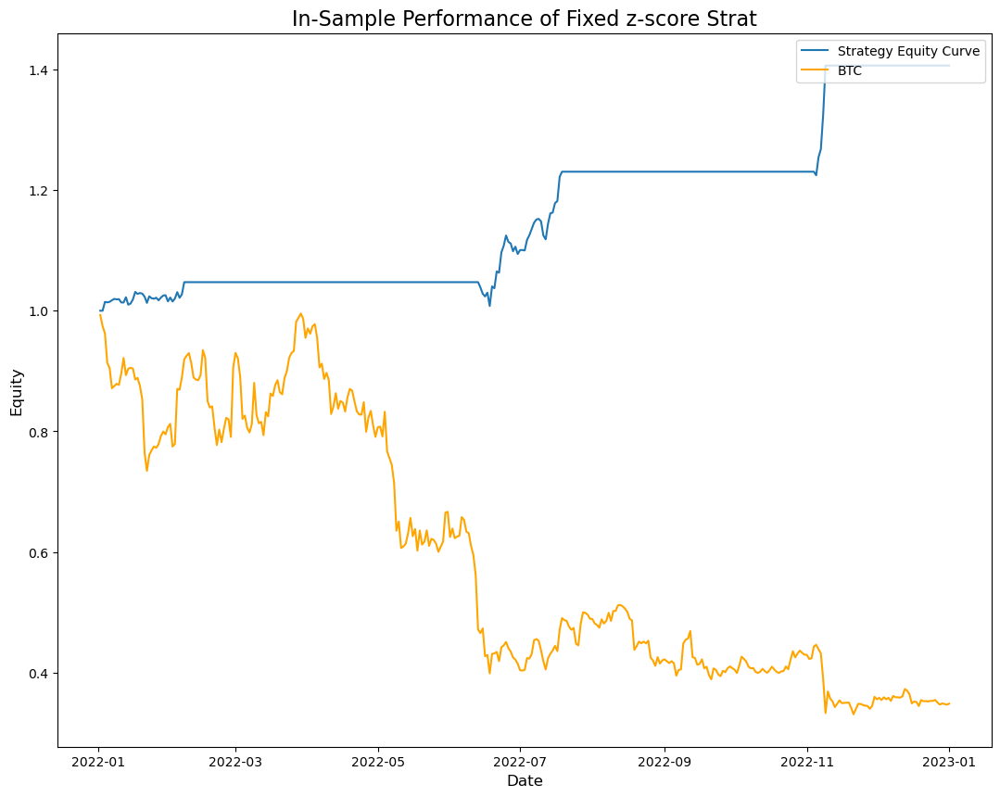

In [37]:
# fixed z-score
start_date = "2022-01-01"
end_date = "2023-01-01"

IS_PD = PrepareData(current_date= end_date, rebal_date= end_date, window_size = 365, parent_df=parent_df)
IS_PCA = PerformPCA(IS_PD)
backtest_inst = PCAstratBacktest(1000, target_leverage=1, start_date="2023-01-01",end_date = "2023-02-01", tc_bps=0)

# polkadot-new
IS_coin = parent_df["polkadot-new"].loc[start_date : end_date]

# Eigenportfolio based on 20230101 (window = 365 days)
IS_pc1 = np.cumprod(1 + IS_PCA.eigportret_df["PC1"])

IS_bo, IS_b1, IS_mean, IS_sdv = rolling_regression(coin_series = IS_coin, pc1_series=IS_pc1, formation_start=start_date, formation_end=end_date, best_direction= "coin -> PC1")

# Compute spread
IS_spread = compute_spread_out_of_sample(coin_series = IS_coin, pc1_series = IS_pc1, beta1 = IS_b1, best_direction = "coin -> PC1")

# Generate signal based on fixed z-score
IS_fixedz_signal = generate_fixed_zscore_signals(spread = IS_spread, fixed_mean = IS_mean, fixed_std = IS_sdv, entry_thresh=2.0)

# Simulate trading
IS_ec, IS_port_val, IS_pos, IS_qx_series, IS_qy_series, IS_ntrades = simulate_spread_dailyMTM(x_prices = IS_coin, y_prices = IS_pc1, signals = IS_fixedz_signal, b = IS_b1, fee_open=0, fee_close =0, initial_equity=1.0)

print(backtest_inst.compute_performance(IS_ec))

plt.figure(figsize = (13,10))
plt.plot(IS_ec, label = "Strategy Equity Curve")
plt.plot(np.cumprod(1+parent_df.loc[start_date:end_date]["bitcoin"].pct_change().dropna()), label = "BTC", color = "orange")
plt.xlabel("Date", fontsize = 12)
plt.ylabel("Equity", fontsize = 12)
plt.legend(loc = "upper right")
plt.title("In-Sample Performance of Fixed z-score Strat", fontsize = 16)

{'Cumulative Return': np.float64(0.21964475869036315), 'CAGR': np.float64(0.14736081634718912), 'Annualized Volatility': np.float64(0.16803317305780013), 'Sharpe Ratio': np.float64(0.8769745501175525), 'MDD': np.float64(-0.10155565563493764), 'MDD period': Timedelta('40 days 00:00:00')}


Text(0.5, 1.0, 'In-Sample Performance of Rolling z-score Strat')

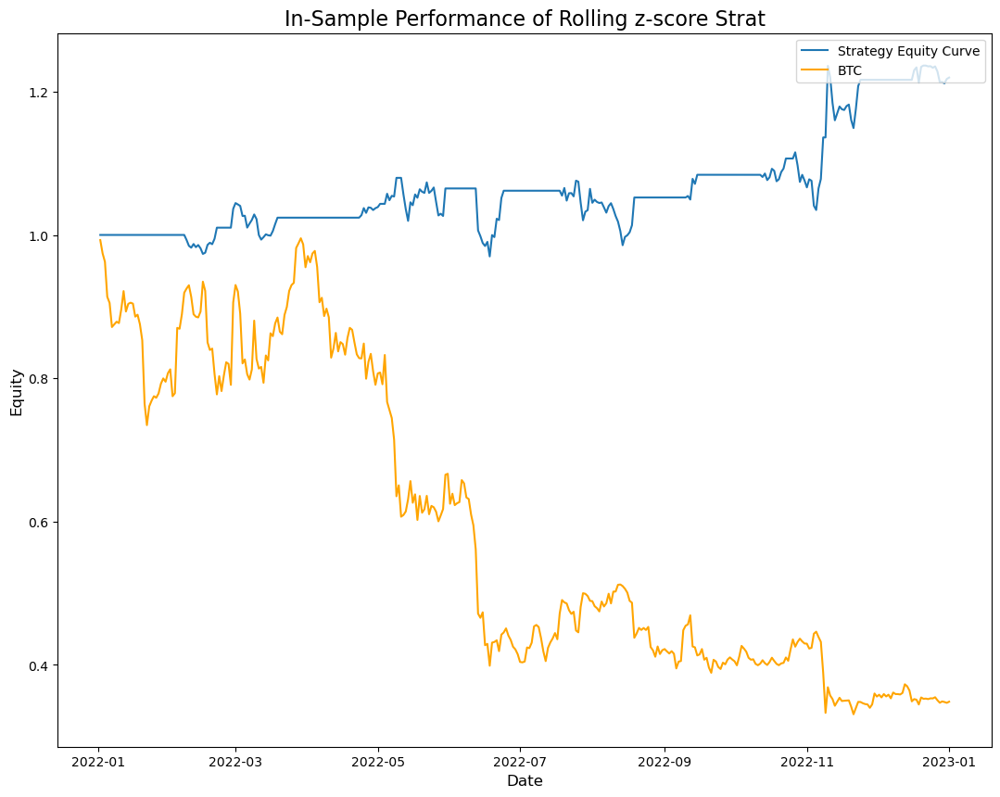

In [38]:
# Rolling z-score

start_date = "2022-01-01"
end_date = "2023-01-01"

IS_PD = PrepareData(current_date= end_date, rebal_date= end_date, window_size = 365, parent_df= parent_df)
IS_PCA = PerformPCA(IS_PD)

# polkadot-new
IS_coin = parent_df["polkadot-new"].loc[start_date : end_date]

# Eigenportfolio based on 20230101 (window = 365 days)
IS_pc1 = np.cumprod(1 + IS_PCA.eigportret_df["PC1"])

IS_bo, IS_b1, IS_mean, IS_sdv = rolling_regression(coin_series = IS_coin, pc1_series=IS_pc1, formation_start=start_date, formation_end=end_date, best_direction= "coin -> PC1")

# Compute spread
IS_spread = compute_spread_out_of_sample(coin_series = IS_coin, pc1_series = IS_pc1, beta1 = IS_b1, best_direction = "coin -> PC1")

# Generate signal based on fixed z-score
IS_rollingz_signal, IS_zscore = generate_signals_zscore(spread = IS_spread, window=20, entry_thresh=2.0)

# Simulate trading
IS_ec, IS_port_val, IS_pos, IS_qx_series, IS_qy_series, IS_ntrades = simulate_spread_dailyMTM(x_prices = IS_coin, y_prices = IS_pc1, signals = IS_rollingz_signal, b = IS_b1, fee_open=0, fee_close =0, initial_equity=1.0)


print(backtest_inst.compute_performance(IS_ec))

plt.figure(figsize = (13,10))
plt.plot(IS_ec, label = "Strategy Equity Curve")
plt.plot(np.cumprod(1+parent_df.loc[start_date:end_date]["bitcoin"].pct_change().dropna()), label = "BTC", color = "orange")
plt.xlabel("Date", fontsize = 12)
plt.ylabel("Equity", fontsize = 12)
plt.legend(loc = "upper right")
plt.title("In-Sample Performance of Rolling z-score Strat", fontsize = 16)

{'Cumulative Return': np.float64(0.21964475869036315), 'CAGR': np.float64(0.14736081634718912), 'Annualized Volatility': np.float64(0.16803317305780013), 'Sharpe Ratio': np.float64(0.8769745501175525), 'MDD': np.float64(-0.10155565563493764), 'MDD period': Timedelta('40 days 00:00:00')}


Text(0.5, 1.0, 'In-Sample Performance of BB Strat')

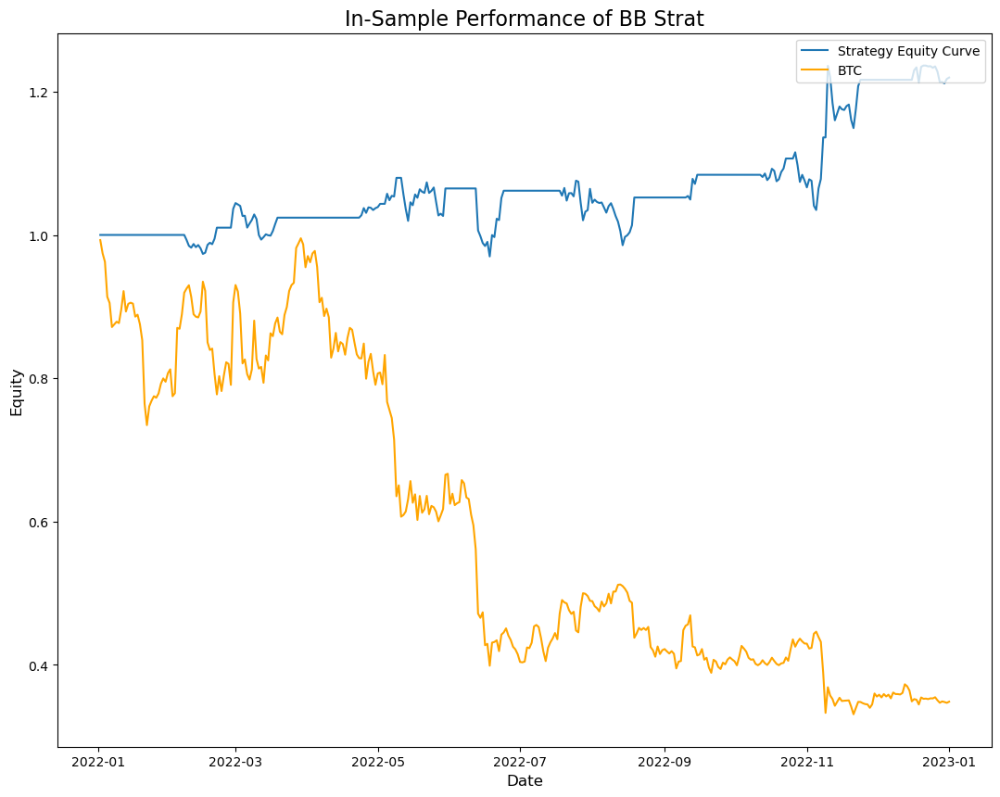

In [39]:
# Bollinger bands
start_date = "2022-01-01"
end_date = "2023-01-01"

IS_PD = PrepareData(current_date= end_date, rebal_date= end_date, window_size = 365, parent_df= parent_df)
IS_PCA = PerformPCA(IS_PD)

# polkadot-new
IS_coin = parent_df["polkadot-new"].loc[start_date : end_date]

# Eigenportfolio based on 20230101 (window = 365 days)
IS_pc1 = np.cumprod(1 + IS_PCA.eigportret_df["PC1"])

IS_bo, IS_b1, IS_mean, IS_sdv = rolling_regression(coin_series = IS_coin, pc1_series=IS_pc1, formation_start=start_date, formation_end=end_date, best_direction= "coin -> PC1")

# Compute spread
IS_spread = compute_spread_out_of_sample(coin_series = IS_coin, pc1_series = IS_pc1, beta1 = IS_b1, best_direction = "coin -> PC1")

# Generate signal based on fixed z-score
IS_bb_signal, IS_ma, IS_ub, IS_lb = generate_signals_bollinger(spread = IS_spread, window = 20, band_multiplier=2.0)

# Simulate trading
IS_ec, IS_port_val, IS_pos, IS_qx_series, IS_qy_series, IS_ntrades = simulate_spread_dailyMTM(x_prices = IS_coin, y_prices = IS_pc1, signals = IS_bb_signal, b = IS_b1, fee_open=0, fee_close =0, initial_equity=1.0)


print(backtest_inst.compute_performance(IS_ec))

plt.figure(figsize = (13,10))
plt.plot(IS_ec, label = "Strategy Equity Curve")
plt.plot(np.cumprod(1+parent_df.loc[start_date:end_date]["bitcoin"].pct_change().dropna()), label = "BTC", color = "orange")
plt.xlabel("Date", fontsize = 12)
plt.ylabel("Equity", fontsize = 12)
plt.legend(loc = "upper right")
plt.title("In-Sample Performance of BB Strat", fontsize = 16)

##### Remarks
- We see rolling z-score is essentially the same as the bollinger band strategy.

{'Cumulative Return': np.float64(0.21964475869036315), 'CAGR': np.float64(0.14736081634718912), 'Annualized Volatility': np.float64(0.16803317305780013), 'Sharpe Ratio': np.float64(0.8769745501175525), 'MDD': np.float64(-0.10155565563493764), 'MDD period': Timedelta('40 days 00:00:00')}
{'Cumulative Return': np.float64(0.22485635685656646), 'CAGR': np.float64(0.15075278379269408), 'Annualized Volatility': np.float64(0.22905355708825134), 'Sharpe Ratio': np.float64(0.6581551743141496), 'MDD': np.float64(-0.18560235636599676), 'MDD period': Timedelta('160 days 00:00:00')}
{'Cumulative Return': np.float64(0.0798400403953532), 'CAGR': np.float64(0.05461753484282994), 'Annualized Volatility': np.float64(0.17484857818872768), 'Sharpe Ratio': np.float64(0.31237048312670285), 'MDD': np.float64(-0.18986955598729588), 'MDD period': Timedelta('65 days 00:00:00')}
{'Cumulative Return': np.float64(0.15494652203373382), 'CAGR': np.float64(0.10487225409193246), 'Annualized Volatility': np.float64(0.1

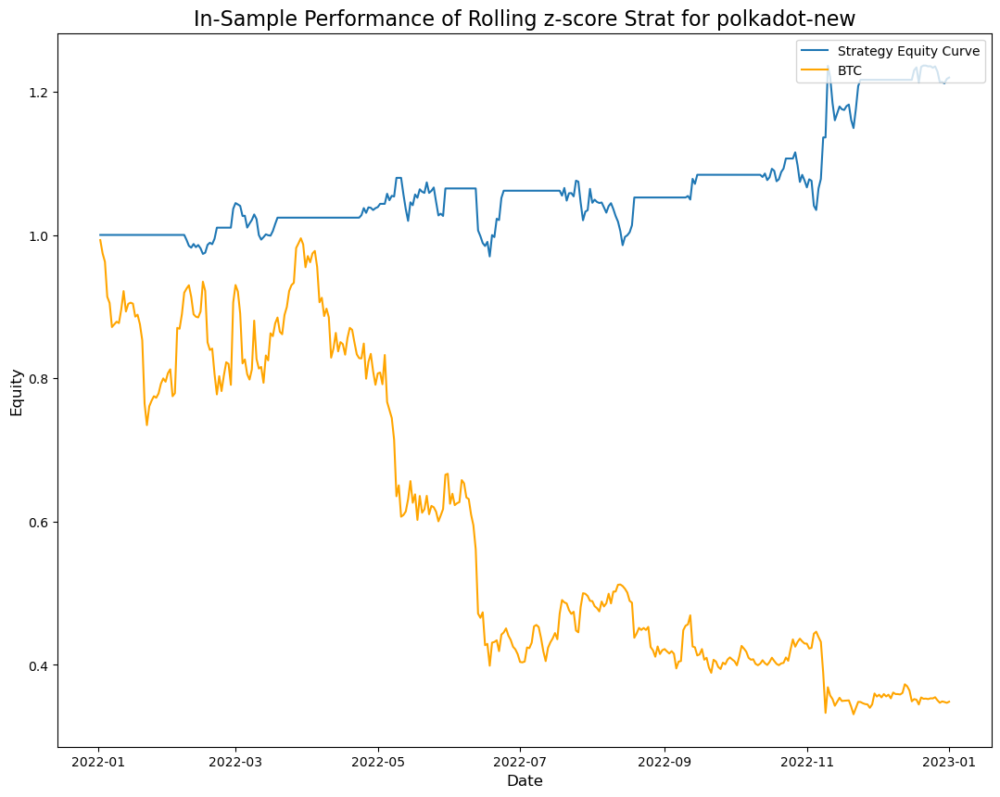

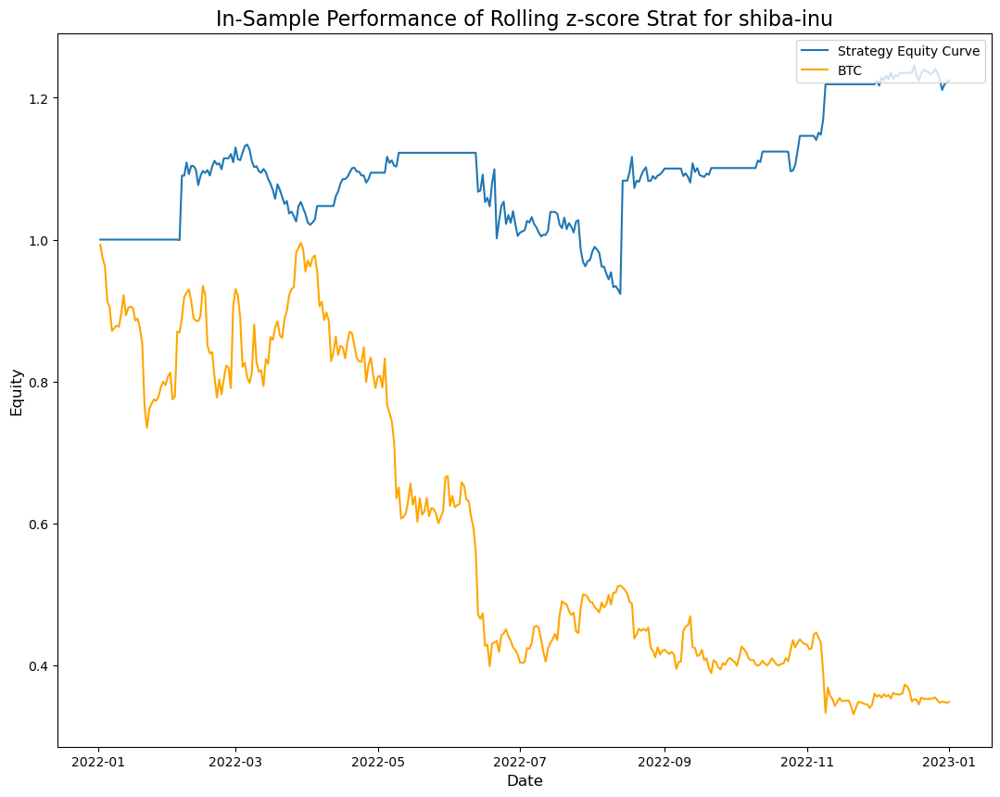

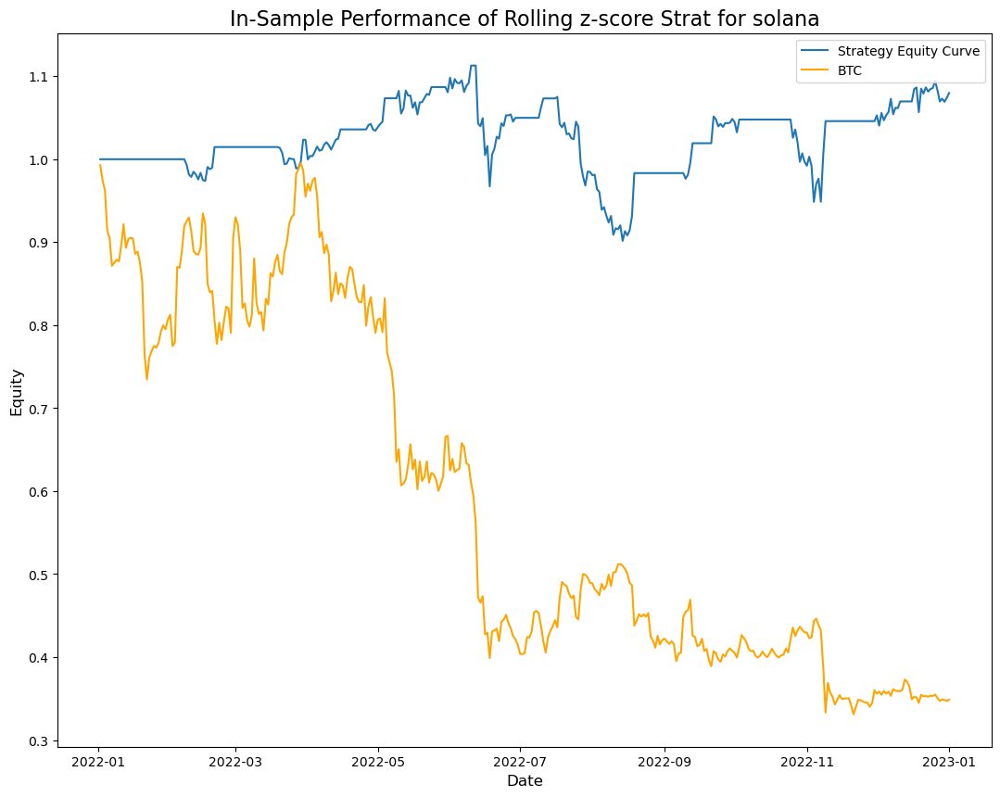

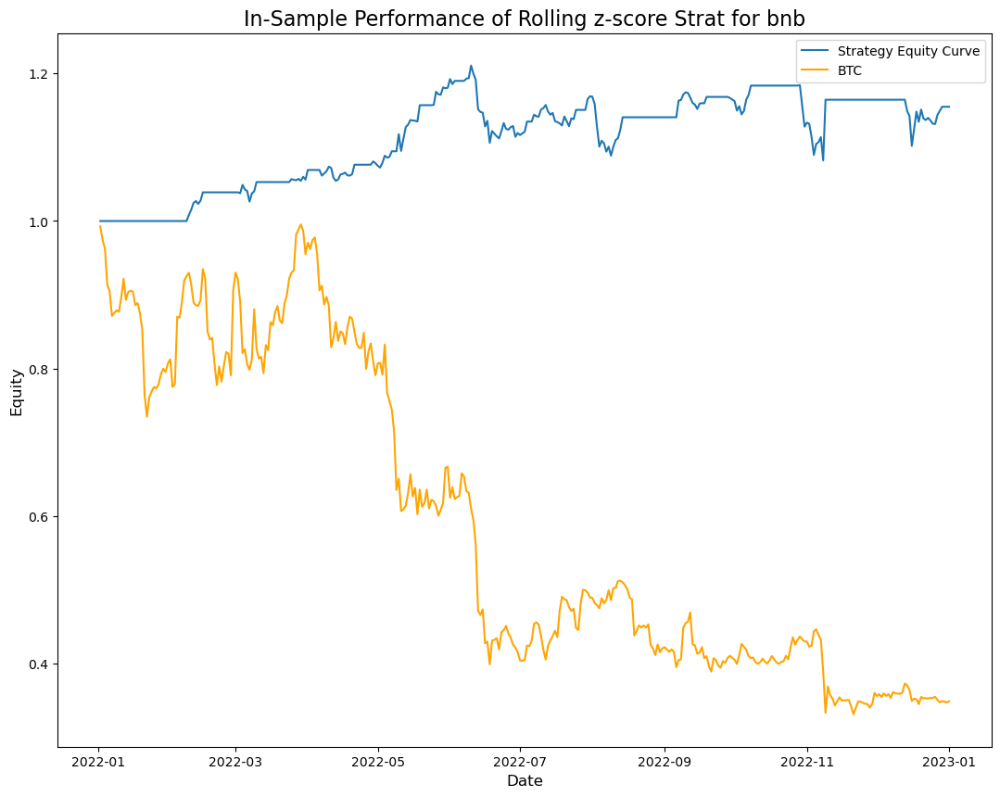

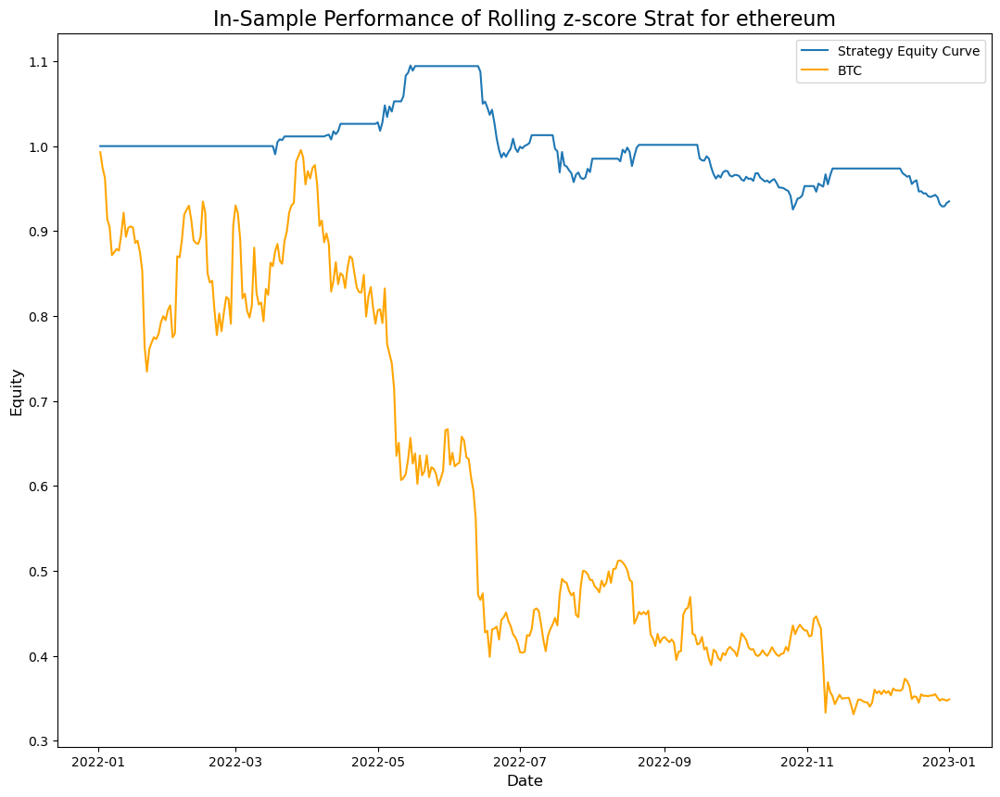

In [40]:
# Loop for all coins

# Rolling z-score

start_date = "2022-01-01"
end_date = "2023-01-01"

IS_PD = PrepareData(current_date= end_date, rebal_date= end_date, window_size = 365, parent_df= parent_df)
IS_PCA = PerformPCA(IS_PD)

for coin in coint_coins:
  # polkadot-new
  IS_coin = parent_df[coin].loc[start_date : end_date]

  # Eigenportfolio based on 20230101 (window = 365 days)
  IS_pc1 = np.cumprod(1 + IS_PCA.eigportret_df["PC1"])

  IS_bo, IS_b1, IS_mean, IS_sdv = rolling_regression(coin_series = IS_coin, pc1_series=IS_pc1, formation_start=start_date, formation_end=end_date, best_direction= df_results.loc[df_results["coin"] == coin, "best_direction"].values[0]) # Best direction 

  # Compute spread
  IS_spread = compute_spread_out_of_sample(coin_series = IS_coin, pc1_series = IS_pc1, beta1 = IS_b1, best_direction = df_results.loc[df_results["coin"] == coin, "best_direction"].values[0])

  # Generate signal based on rolling z-score
  IS_rollingz_signal, IS_zscore = generate_signals_zscore(spread = IS_spread, window=20, entry_thresh=2.0)

  # Simulate trading
  if df_results.loc[df_results["coin"] == coin, "best_direction"].values[0] == "coin -> PC1": # set x to be coin and y to be PC1
    IS_ec, IS_port_val, IS_pos, IS_qx_series, IS_qy_series, IS_ntrades = simulate_spread_dailyMTM(x_prices = IS_coin, y_prices = IS_pc1, signals =  IS_rollingz_signal, b = IS_b1, fee_open=0, fee_close =0, initial_equity=1.0)
  else:
    IS_ec, IS_port_val, IS_pos, IS_qx_series, IS_qy_series, IS_ntrades = simulate_spread_dailyMTM(x_prices = IS_pc1, y_prices = IS_coin, signals =  IS_rollingz_signal, b = IS_b1, fee_open=0, fee_close =0, initial_equity=1.0)

  print(backtest_inst.compute_performance(IS_ec))

  plt.figure(figsize = (13,10))
  plt.plot(IS_ec, label = "Strategy Equity Curve")
  plt.plot(np.cumprod(1+parent_df.loc[start_date:end_date]["bitcoin"].pct_change().dropna()), label = "BTC", color = "orange")
  plt.xlabel("Date", fontsize = 12)
  plt.ylabel("Equity", fontsize = 12)
  plt.legend(loc = "upper right")
  plt.title(f"In-Sample Performance of Rolling z-score Strat for {coin}", fontsize = 16)


##### Remarks
- In-sample performance shows that performance held up during the severe bear market of year 2022. Again, we can't really make any inference on whether the start will perform well in practice because in-sample performance is biased. 

We will now look at out of sample performance.

First, we use the same trading universe to trade out of sample based on cointegrating coefficient estimated in estimation period and eigenportfolio 1 estimated using same dataset. 

Next, we adopt a rebalancing approach by extracting new trading universe, new PC1 portfolio, and conduct subsequent cointegration analysis trading simulation in between rebalance dates (quarterly)

In [41]:
parent_df.loc[:, PD_fp.tu].pct_change().dropna() @ PCA_fp.Q.iloc[:,1].values

timestamp
2022-01-02   -0.013801
2022-01-03   -0.001675
2022-01-04    0.000452
2022-01-05    0.004522
2022-01-06   -0.004604
                ...   
2024-08-01    0.016510
2024-08-02   -0.013145
2024-08-03    0.000245
2024-08-04    0.007398
2024-08-05    0.006751
Length: 947, dtype: float64

{'Cumulative Return': np.float64(-0.34801783911695305), 'CAGR': np.float64(-0.16933188944054933), 'Annualized Volatility': np.float64(0.3240632581432169), 'Sharpe Ratio': np.float64(-0.5225272695546207), 'MDD': np.float64(-0.5250504030123765), 'MDD period': Timedelta('156 days 00:00:00')}
{'Cumulative Return': np.float64(-0.24886688469135843), 'CAGR': np.float64(-0.11672877749146071), 'Annualized Volatility': np.float64(0.2133581619814763), 'Sharpe Ratio': np.float64(-0.5471024703596531), 'MDD': np.float64(-0.365562500515978), 'MDD period': Timedelta('144 days 00:00:00')}
{'Cumulative Return': np.float64(-0.1822900346827664), 'CAGR': np.float64(-0.08358696377754504), 'Annualized Volatility': np.float64(0.24223015350219665), 'Sharpe Ratio': np.float64(-0.34507249642141286), 'MDD': np.float64(-0.4138144942895362), 'MDD period': Timedelta('143 days 00:00:00')}
{'Cumulative Return': np.float64(-0.17622666786639407), 'CAGR': np.float64(-0.08064578784143062), 'Annualized Volatility': np.floa

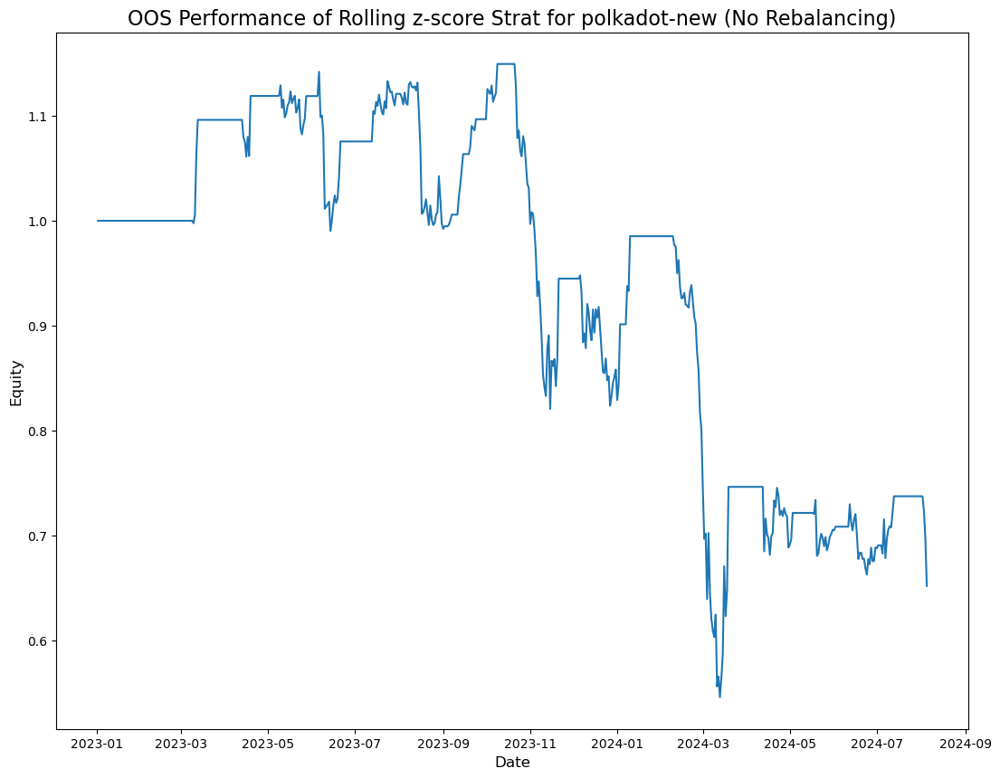

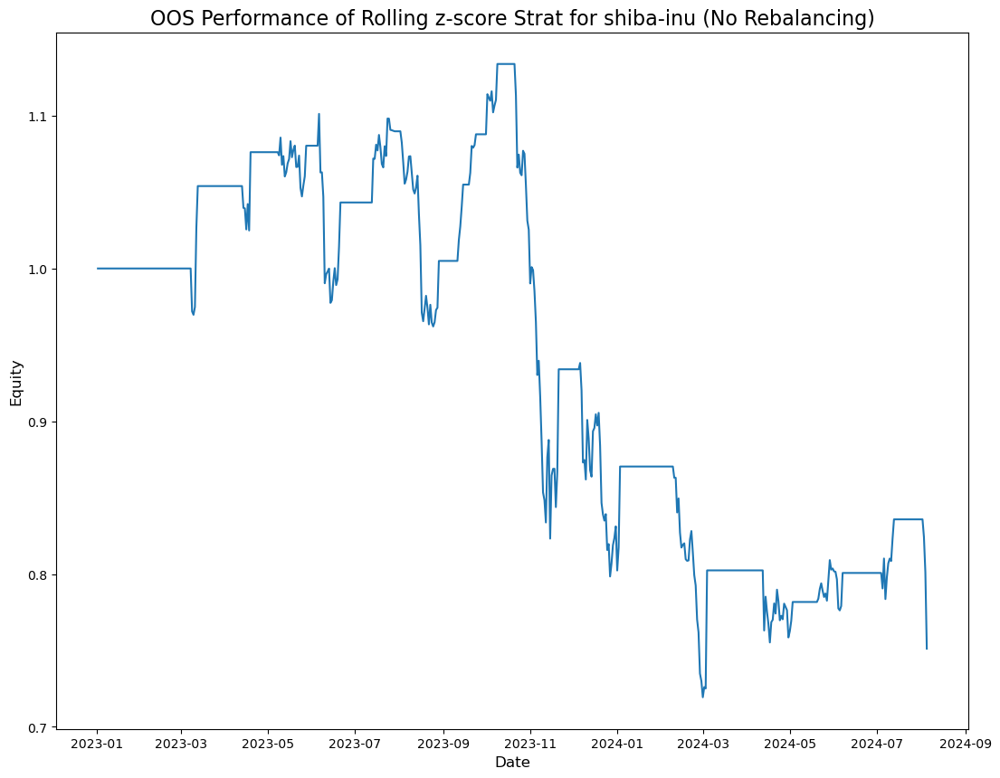

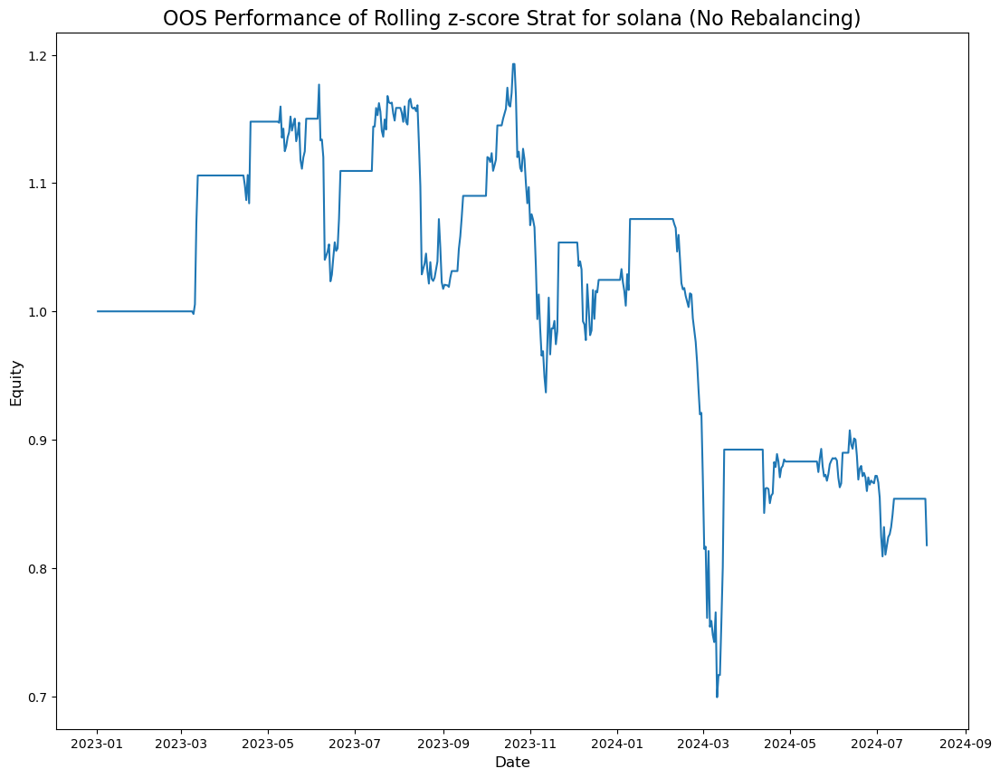

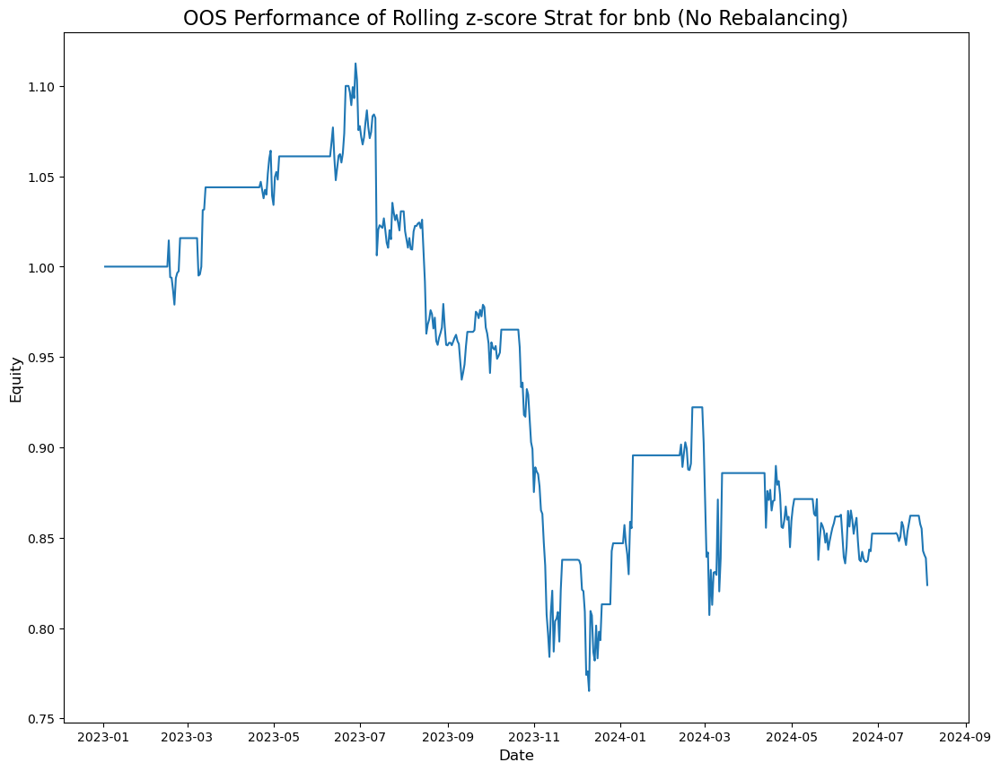

In [43]:
## OOS testing with same TU and PC1 portfolio

# Prepare data for estimation
current_date = "2023-01-02" # In this version, rebal date is equal to current date, since we don't do any rebal
PCA_window_size = 365 # days
coint_window_size = 365 

PCA_start_date = pd.to_datetime(current_date) - timedelta(days = PCA_window_size) # get start of estimation date for PCA
coint_start_date = pd.to_datetime(current_date) - timedelta(days = coint_window_size)

end_date = "2024-08-05" # End of test period


PD_fp = PrepareData(current_date= current_date, rebal_date= current_date, window_size = PCA_window_size, parent_df= parent_df)
PCA_fp = PerformPCA(PD_fp)
eigportret_fp = PCA_fp.eigportret_df.iloc[:,0] # First eigenportfolio return
eigport_fp = PCA_fp.Q.iloc[:,0] # First eigenportfolio weight



current_tu = PD_fp.tu # Use this to get data from parent_df
current_parent_fp = parent_df.loc[coint_start_date:current_date, current_tu]
current_parentret_fp = current_parent_fp.pct_change().dropna()
current_parent_oos = parent_df.loc[current_date:end_date, current_tu]
current_parentret_oos = current_parent_oos.pct_change().dropna()

parent_eigportret = parent_df.loc[:, PD_fp.tu].pct_change().dropna() @ eigport_fp.values # eigeportfolio return for all period using current trading universe
current_eigportret_fp = parent_eigportret.loc[coint_start_date : current_date]
current_eigportret_oos = parent_eigportret.loc[current_date : end_date]

# Build PC 1 series
PC1_series_fp = np.cumprod(1 + current_eigportret_fp)
PC1_series_oos = np.cumprod(1 + current_eigportret_oos)

df_results = compute_cointegration_results(parent_df = parent_df, current_date = "2023-01-02", window_size = PCA_window_size, rebal_date = "2023-01-02")

coint_coins = list(df_results[(df_results["pval_dir1"] <= 0.1) & (df_results["pval_dir2"] <= 0.1)]["coin"].values)

for coin in coint_coins:
  best_direction = df_results.loc[df_results["coin"] == coin, "best_direction"].values[0]
  beta0, beta1, form_mean, form_std = rolling_regression(coin_series = current_parent_fp[coin], pc1_series=PC1_series_fp, formation_start=coint_start_date, formation_end=current_date, best_direction=best_direction)
  
  # Compute OOS spread
  OOS_spread = compute_spread_out_of_sample(coin_series = current_parent_oos[coin], pc1_series = PC1_series_oos, beta1 = beta1, best_direction = best_direction)

  # Generate signal
  rollingz_signal, zscore = generate_signals_zscore(spread = OOS_spread, window=20, entry_thresh=2)

  # Simualte trading
  if best_direction == "coin -> PC1":
    OOS_ec, OOS_port_val, OOS_pos, OOS_qx_series, OOS_qy_series, OOS_ntrades = simulate_spread_dailyMTM(x_prices = current_parent_oos[coin], y_prices =  PC1_series_oos, signals =  rollingz_signal, b = beta1, fee_open=0, fee_close =0, initial_equity=1.0)
  else:
    OOS_ec, OOS_port_val, OOS_pos, OOS_qx_series, OOS_qy_series, OOS_ntrades = simulate_spread_dailyMTM(x_prices = PC1_series_oos, y_prices =  current_parent_oos[coin], signals =  rollingz_signal, b = beta1, fee_open=0, fee_close =0, initial_equity=1.0)

  print(backtest_inst.compute_performance(OOS_ec))

  plt.figure(figsize = (13,10))
  plt.plot(OOS_ec, label = "Strategy Equity Curve")
  plt.xlabel("Date", fontsize = 12)
  plt.ylabel("Equity", fontsize = 12)
  plt.title(f"OOS Performance of Rolling z-score Strat for {coin} (No Rebalancing)", fontsize = 16)

{'Cumulative Return': np.float64(-0.6444367246364904), 'CAGR': np.float64(-0.3614175660041107), 'Annualized Volatility': np.float64(110.46944930188175), 'Sharpe Ratio': np.float64(-0.003271651739807797), 'MDD': np.float64(-1.5633516699195182), 'MDD period': Timedelta('436 days 00:00:00')}
{'Cumulative Return': np.float64(-0.49378000106411224), 'CAGR': np.float64(-0.25567668407215316), 'Annualized Volatility': np.float64(13.711802280872902), 'Sharpe Ratio': np.float64(-0.018646468118112085), 'MDD': np.float64(-1.1368339802875471), 'MDD period': Timedelta('436 days 00:00:00')}
{'Cumulative Return': np.float64(-0.1809496315239325), 'CAGR': np.float64(-0.0829357098102318), 'Annualized Volatility': np.float64(12.114912886794281), 'Sharpe Ratio': np.float64(-0.006845753707452151), 'MDD': np.float64(-1.2250230013987224), 'MDD period': Timedelta('182 days 00:00:00')}
{'Cumulative Return': np.float64(-0.11249048270972128), 'CAGR': np.float64(-0.05044346392925003), 'Annualized Volatility': np.fl

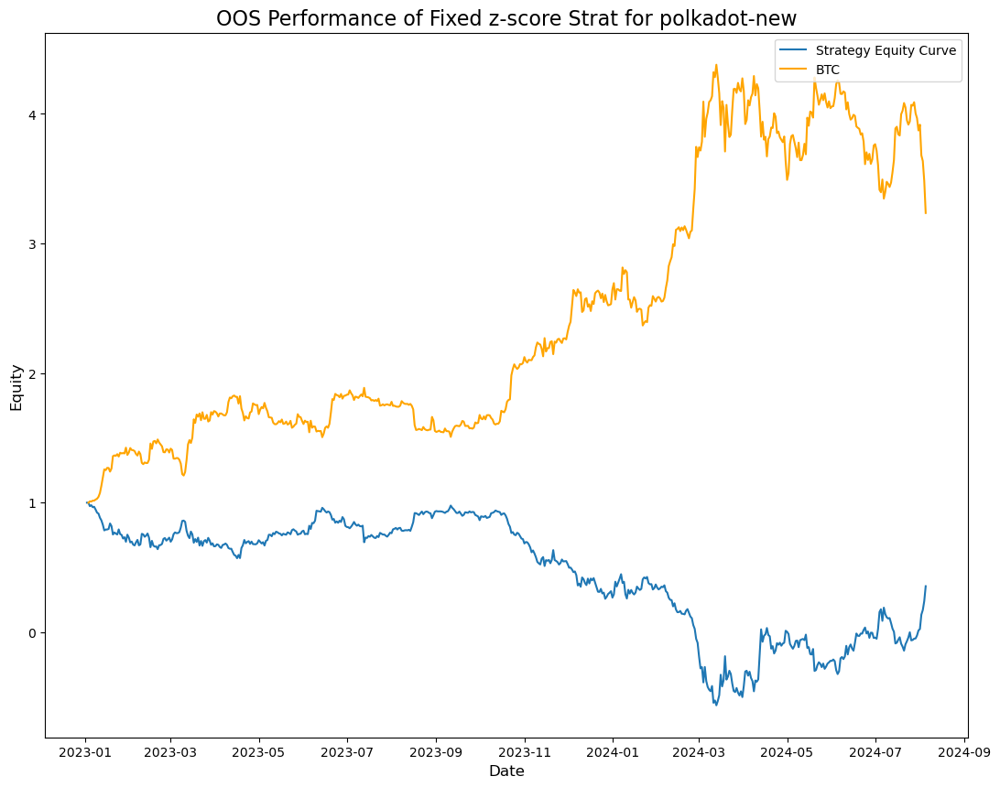

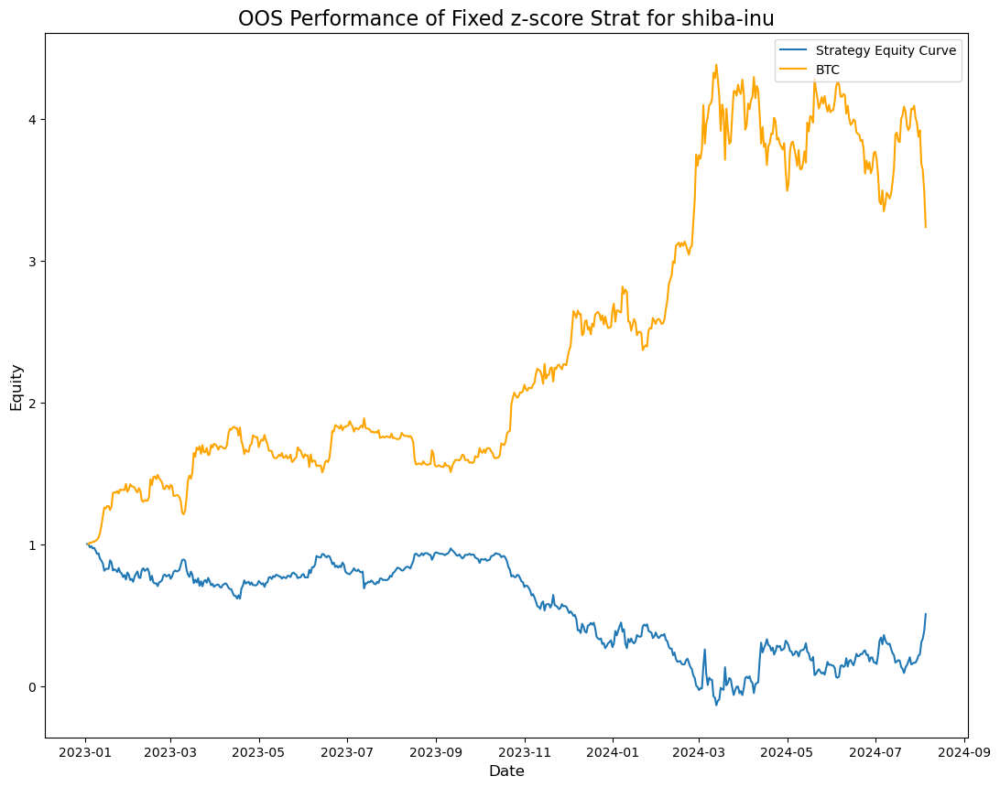

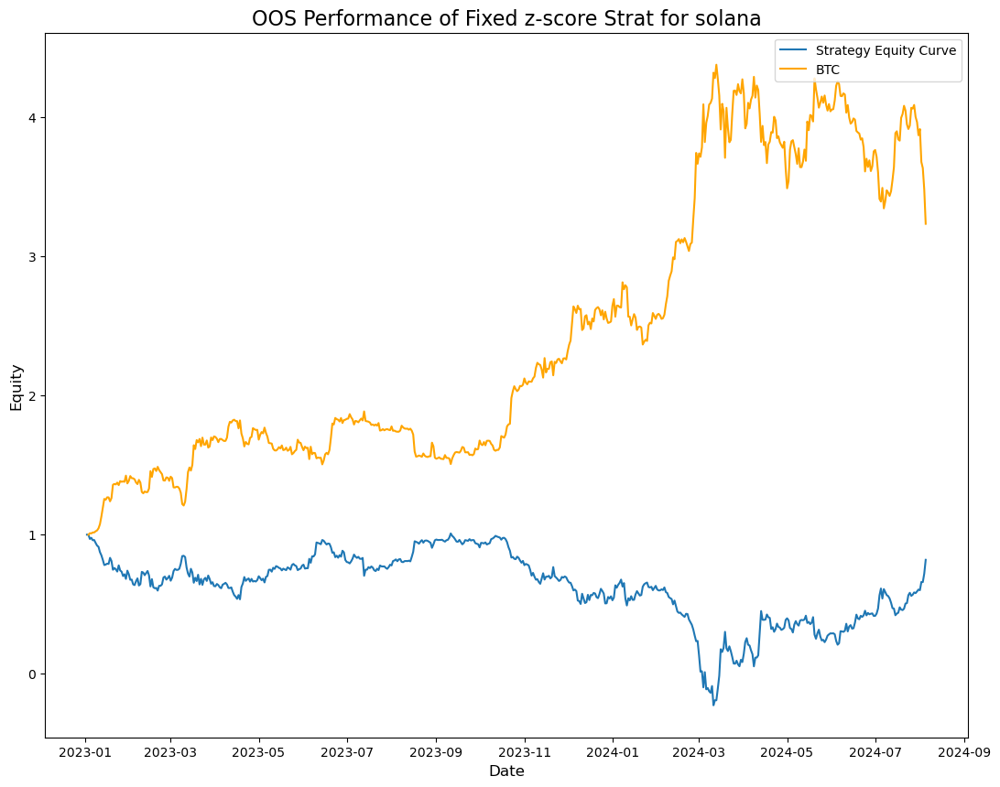

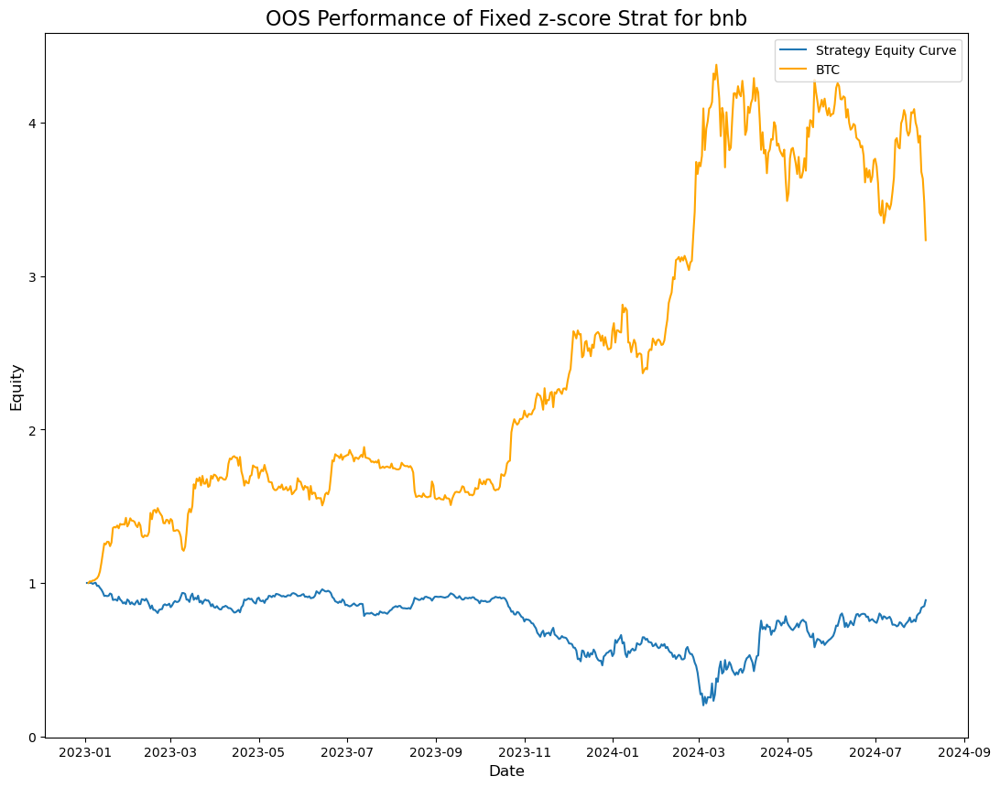

In [44]:
## OOS testing with same TU and PC1 portfolio

# Prepare data for estimation
current_date = "2023-01-02" # In this version, rebal date is equal to current date, since we don't do any rebal
PCA_window_size = 365 # days
coint_window_size = 365 

PCA_start_date = pd.to_datetime(current_date) - timedelta(days = PCA_window_size) # get start of estimation date for PCA
coint_start_date = pd.to_datetime(current_date) - timedelta(days = coint_window_size)

end_date = "2024-08-05" # End of test period


PD_fp = PrepareData(current_date= current_date, rebal_date= current_date, window_size = PCA_window_size, parent_df= parent_df)
PCA_fp = PerformPCA(PD_fp)
eigportret_fp = PCA_fp.eigportret_df.iloc[:,0] # First eigenportfolio return
eigport_fp = PCA_fp.Q.iloc[:,0] # First eigenportfolio weight



current_tu = PD_fp.tu # Use this to get data from parent_df
current_parent_fp = parent_df.loc[coint_start_date:current_date, current_tu]
current_parentret_fp = current_parent_fp.pct_change().dropna()
current_parent_oos = parent_df.loc[current_date:end_date, current_tu]
current_parentret_oos = current_parent_oos.pct_change().dropna()

parent_eigportret = parent_df.loc[:, PD_fp.tu].pct_change().dropna() @ eigport_fp.values # eigeportfolio return for all period using current trading universe
current_eigportret_fp = parent_eigportret.loc[coint_start_date : current_date]
current_eigportret_oos = parent_eigportret.loc[current_date : end_date]

# Build PC 1 series
PC1_series_fp = np.cumprod(1 + current_eigportret_fp)
PC1_series_oos = np.cumprod(1 + current_eigportret_oos)

df_results = compute_cointegration_results(parent_df = parent_df, current_date = "2023-01-02", window_size = PCA_window_size, rebal_date = "2023-01-02")

coint_coins = list(df_results[(df_results["pval_dir1"] <= 0.1) & (df_results["pval_dir2"] <= 0.1)]["coin"].values)

for coin in coint_coins:
  best_direction = df_results.loc[df_results["coin"] == coin, "best_direction"].values[0]
  beta0, beta1, form_mean, form_std = rolling_regression(coin_series = current_parent_fp[coin], pc1_series=PC1_series_fp, formation_start=coint_start_date, formation_end=current_date, best_direction=best_direction)
  
  # Compute OOS spread
  OOS_spread = compute_spread_out_of_sample(coin_series = current_parent_oos[coin], pc1_series = PC1_series_oos, beta1 = beta1, best_direction = best_direction)

  # Generate signal
  fixedz_signal = generate_fixed_zscore_signals(spread = OOS_spread, fixed_mean = form_mean, fixed_std = form_std, entry_thresh=2.0)

  # Simualte trading
  if best_direction == "coin -> PC1":
    OOS_ec, OOS_port_val, OOS_pos, OOS_qx_series, OOS_qy_series, OOS_ntrades = simulate_spread_dailyMTM(x_prices = current_parent_oos[coin], y_prices =  PC1_series_oos, signals =   fixedz_signal, b = beta1, fee_open=0, fee_close =0, initial_equity=1.0)
  else:
    OOS_ec, OOS_port_val, OOS_pos, OOS_qx_series, OOS_qy_series, OOS_ntrades = simulate_spread_dailyMTM(x_prices = PC1_series_oos, y_prices =  current_parent_oos[coin], signals =   fixedz_signal, b = beta1, fee_open=0, fee_close =0, initial_equity=1.0)

  print(backtest_inst.compute_performance(OOS_ec))

  plt.figure(figsize = (13,10))
  plt.plot(OOS_ec, label = "Strategy Equity Curve")
  plt.plot(np.cumprod(1+parent_df.loc[current_date:end_date]["bitcoin"].pct_change().dropna()), label = "BTC", color = "orange")
  plt.xlabel("Date", fontsize = 12)
  plt.ylabel("Equity", fontsize = 12)
  plt.legend(loc = "upper right")
  plt.title(f"OOS Performance of Fixed z-score Strat for {coin}", fontsize = 16)

Rebalancing dates: DatetimeIndex(['2023-01-02', '2023-03-03', '2023-05-02', '2023-07-01',
               '2023-08-30', '2023-10-29', '2023-12-28', '2024-02-26',
               '2024-04-26', '2024-06-25'],
              dtype='datetime64[ns]', freq='60D')
Initial cointegrated coins: ['polkadot-new', 'shiba-inu', 'solana', 'bnb']
First period - polkadot-new performance: {'Cumulative Return': 0.0, 'CAGR': 0.0, 'Annualized Volatility': 0.0, 'Sharpe Ratio': 0, 'MDD': 0.0, 'MDD period': Timedelta('0 days 00:00:00')}
First period - shiba-inu performance: {'Cumulative Return': 0.0, 'CAGR': 0.0, 'Annualized Volatility': 0.0, 'Sharpe Ratio': 0, 'MDD': 0.0, 'MDD period': Timedelta('0 days 00:00:00')}
First period - solana performance: {'Cumulative Return': 0.0, 'CAGR': 0.0, 'Annualized Volatility': 0.0, 'Sharpe Ratio': 0, 'MDD': 0.0, 'MDD period': Timedelta('0 days 00:00:00')}
First period - bnb performance: {'Cumulative Return': 0.015300951016634201, 'CAGR': 0.06700779056888995, 'Annualized Vola

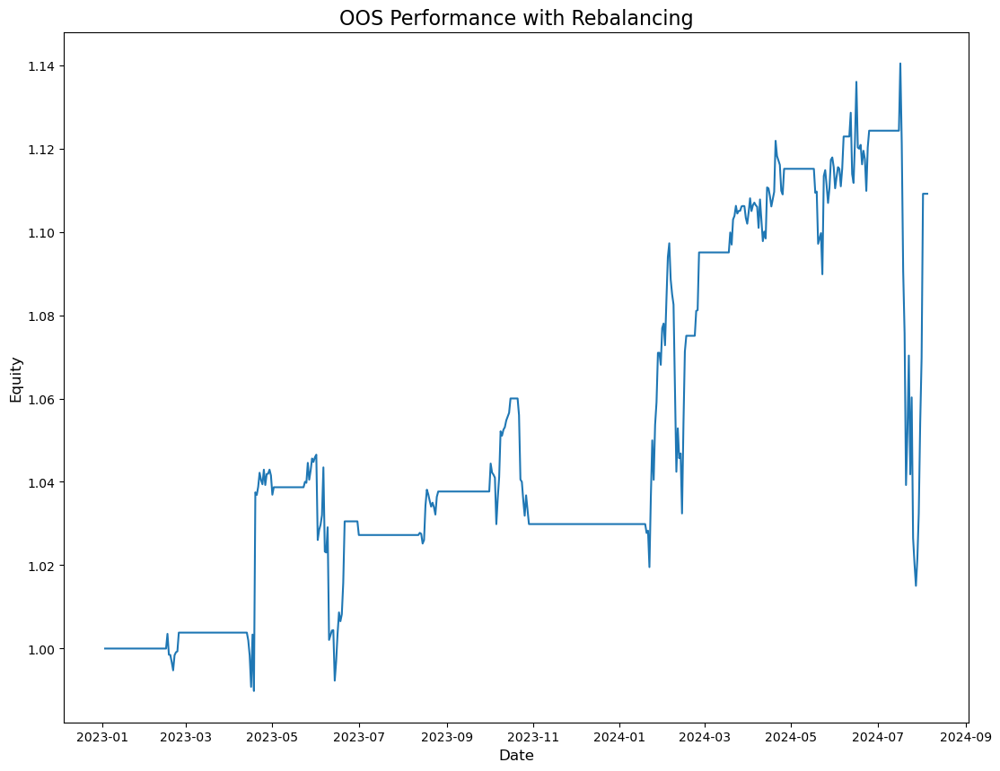

In [ ]:
# =============================================================================
# PARAMETERS & SETUP
# =============================================================================

formation_window = 365      # days used for estimation (PCA & cointegration)
rebalance_freq   = '60D'     # Rebalancing frequency (every 3 months)
start_rebal_date = "2023-01-02"  # First rebalancing date (also first estimation date)
end_date_str     = "2024-08-05"    # End of backtest period
backtest_inst =  PCAstratBacktest(10000, target_leverage = 1, tc_bps = 0, start_date = "2022-07-01", end_date = "2023-07-01")
entry_thresh = 2 # For strat
z_window = 20

# Generate rebalancing dates as a DatetimeIndex.
rebal_dates = pd.date_range(start=start_rebal_date, end=end_date_str, freq=rebalance_freq)
print("Rebalancing dates:", rebal_dates)

# We will aggregate our equity across coins each period.
# aggregated_equity holds our capital allocated across coins.
aggregated_equity = 1.0  
agg_equity_curve = pd.Series(dtype=float)  # will build the aggregated equity curve over time

# Use the same column index for PC1 (e.g. second column, as before)
PC1_col_index = 0

# =============================================================================
# FIRST REBALANCING PERIOD
# =============================================================================

first_rebal_date = rebal_dates[0]
first_rebal_str  = first_rebal_date.strftime("%Y-%m-%d")

# Create a PrepareData instance for the formation period ending at the first rebal date.
PD_first = PrepareData(
    current_date = first_rebal_str,
    rebal_date   = first_rebal_str,
    window_size  = formation_window,
    parent_df    = parent_df
)
# Run PCA on the formation period with the new trading universe.
PCA_first = PerformPCA(PD_first)
eigportret_fp = PCA_first.eigportret_df.iloc[:, PC1_col_index]
eigport_fp    = PCA_first.Q.iloc[:, PC1_col_index]
current_tu    = PD_first.tu

# Define formation period: from (first_rebal_date - formation_window) to first_rebal_date.
formation_start = first_rebal_date - timedelta(days=formation_window)
formation_parent_fp = parent_df.loc[formation_start:first_rebal_str, current_tu]

# Compute returns over the formation period and build the PC1 (eigenportfolio) price series.
formation_returns = formation_parent_fp.pct_change().dropna()
parent_eigportret = formation_returns @ eigport_fp.values
PC1_series_fp = np.cumprod(1 + parent_eigportret)

# Define OOS period: from first_rebal_date to the next rebal date (or end date if none).
if len(rebal_dates) > 1:
    oos_end = rebal_dates[1]
else:
    oos_end = pd.to_datetime(end_date_str)
oos_str = first_rebal_str  # OOS period begins at first rebal date.
oos_parent = parent_df.loc[first_rebal_str:oos_end, current_tu]
oos_returns = oos_parent.pct_change().dropna()
parent_eigportret_oos = oos_returns @ eigport_fp.values
PC1_series_oos = np.cumprod(1 + parent_eigportret_oos)

# Run cointegration tests (using your function) on the formation period.
df_results = compute_cointegration_results(
    parent_df    = parent_df,
    current_date = first_rebal_str,
    window_size  = formation_window,
    rebal_date   = first_rebal_str
)
# Select coins with ADF p-values ≤ 0.1 in both directions.
coint_coins = list(df_results[(df_results["pval_dir1"] <= 0.1) & 
                              (df_results["pval_dir2"] <= 0.1)]["coin"].values)
print("Initial cointegrated coins:", coint_coins)

# Allocate aggregated equity equally among selected coins.
n_coins = len(coint_coins)
if n_coins == 0:
    print("No coin selected in first period. Exiting.")
    exit()
allocation = aggregated_equity / n_coins

# Simulate each coin’s trading in the OOS period.
coin_eq_curves = {}  # individual equity curves for this period
final_equity_values = {}
for coin in coint_coins:
    best_direction = df_results.loc[df_results["coin"] == coin, "best_direction"].values[0]
    beta0, beta1, form_mean, form_std = rolling_regression(
         coin_series     = formation_parent_fp[coin],
         pc1_series      = PC1_series_fp,
         formation_start = formation_start,
         formation_end   = first_rebal_str,
         best_direction  = best_direction
    )
    # Compute the OOS spread for the coin.
    OOS_spread = compute_spread_out_of_sample(
         coin_series    = oos_parent[coin],
         pc1_series     = PC1_series_oos,
         beta1          = beta1,
         best_direction = best_direction
    )
    # Generate fixed z-score signals using formation spread statistics.
    rollingz_signal, _  = generate_signals_zscore(
            spread      = OOS_spread,
            window      = z_window,
            entry_thresh= entry_thresh
    )
    # Simulate trading over the OOS period.
    if best_direction == "coin -> PC1":
         OOS_ec, OOS_port_val, OOS_pos, OOS_qx_series, OOS_qy_series, OOS_ntrades = simulate_spread_dailyMTM(
              x_prices       = oos_parent[coin],
              y_prices       = PC1_series_oos,
              signals        = rollingz_signal,
              b              = beta1,
              fee_open       = 0,
              fee_close      = 0,
              initial_equity = allocation
         )
    else:
         OOS_ec, OOS_port_val, OOS_pos, OOS_qx_series, OOS_qy_series, OOS_ntrades = simulate_spread_dailyMTM(
              x_prices       = PC1_series_oos,
              y_prices       = oos_parent[coin],
              signals        = rollingz_signal,
              b              = beta1,
              fee_open       = 0,
              fee_close      = 0,
              initial_equity = allocation
         )
    coin_eq_curves[coin] = OOS_ec.copy()
    final_equity_values[coin] = OOS_ec.iloc[-1]
    print(f"First period - {coin} performance: {backtest_inst.compute_performance(OOS_ec)}")

# Aggregate the equity curves for the period (sum over coins).
aligned_coin_eq = pd.concat(coin_eq_curves.values(), axis=1)
agg_eq_curve_period = aligned_coin_eq.sum(axis=1)
# Update aggregated equity to be the last value of the aggregated curve.
aggregated_equity = agg_eq_curve_period.iloc[-1]
agg_equity_curve = agg_eq_curve_period.copy()

# =============================================================================
# SUBSEQUENT REBALANCING PERIODS
# =============================================================================

for r in range(1, len(rebal_dates)):
    rebal_date = rebal_dates[r]
    rebal_date_str = rebal_date.strftime("%Y-%m-%d")
    formation_start = rebal_date - timedelta(days=formation_window)
    
    # Define OOS period: from current rebal date to the next rebal date (or end date).
    if r < len(rebal_dates)-1:
         oos_end = rebal_dates[r+1]
    else:
         oos_end = pd.to_datetime(end_date_str)
    oos_end_str = oos_end.strftime("%Y-%m-%d")
    
    print(f"\nRebalancing at {rebal_date_str}: Formation period {formation_start.strftime('%Y-%m-%d')} to {rebal_date_str}; OOS period {rebal_date_str} to {oos_end_str}")
    
    # Create a new PrepareData instance (with rebal_date) to extract the NEW trading universe.
    PD_new = PrepareData(
         current_date = rebal_date_str,
         rebal_date   = rebal_date_str,
         window_size  = formation_window,
         parent_df    = parent_df
    )
    PCA_new = PerformPCA(PD_new)
    eigportret_new = PCA_new.eigportret_df.iloc[:, PC1_col_index]
    eigport_new    = PCA_new.Q.iloc[:, PC1_col_index]
    current_tu_new = PD_new.tu
    
    # Formation period price data from the new universe.
    formation_parent_new = parent_df.loc[formation_start:rebal_date_str, current_tu_new]
    formation_returns_new = formation_parent_new.pct_change().dropna()
    parent_eigportret_new = formation_returns_new @ eigport_new.values
    PC1_series_fp_new = np.cumprod(1 + parent_eigportret_new)
    
    # OOS price data for the current period.
    oos_parent_new = parent_df.loc[rebal_date_str:oos_end_str, current_tu_new]
    oos_returns_new = oos_parent_new.pct_change().dropna()
    parent_eigportret_oos_new = oos_returns_new @ eigport_new.values
    PC1_series_oos_new = np.cumprod(1 + parent_eigportret_oos_new)
    
    # Run cointegration tests on the formation period in the new universe.
    df_results_new = compute_cointegration_results(
         parent_df    = parent_df,
         current_date = rebal_date_str,
         window_size  = formation_window,
         rebal_date   = rebal_date_str
    )
    
    # Select coins that pass cointegration criteria in this period.
    selected_coins = list(df_results_new[(df_results_new["pval_dir1"]<=0.1) & 
                                          (df_results_new["pval_dir2"]<=0.1)]["coin"].values)
    n_coins = len(selected_coins)
    if n_coins == 0:
         print(f"No coin selected at {rebal_date_str}. Aggregated equity remains unchanged.")
         # For plotting, fill period with constant equity.
         period_dates = pd.date_range(start=rebal_date_str, end=oos_end_str)
         agg_eq_curve_period = pd.Series(aggregated_equity, index=period_dates)
         agg_equity_curve = pd.concat([agg_equity_curve, agg_eq_curve_period])
         continue
         
    # Allocate the current aggregated equity equally among selected coins.
    allocation = aggregated_equity / n_coins
    coin_eq_curves = {}
    for coin in selected_coins:
         coin_result_new = df_results_new[df_results_new["coin"]==coin]
         if coin_result_new.empty:
             continue
         if not ((coin_result_new["pval_dir1"].values[0] <= 0.1) and (coin_result_new["pval_dir2"].values[0] <= 0.1)):
             continue
         best_direction_new = coin_result_new["best_direction"].values[0]
         beta0, beta1, form_mean, form_std = rolling_regression(
             coin_series     = formation_parent_new[coin],
             pc1_series      = PC1_series_fp_new,
             formation_start = formation_start,
             formation_end   = rebal_date_str,
             best_direction  = best_direction_new
         )
         OOS_spread_new = compute_spread_out_of_sample(
             coin_series    = oos_parent_new[coin],
             pc1_series     = PC1_series_oos_new,
             beta1          = beta1,
             best_direction = best_direction_new
         )
         rollingz_signal_new, _ = generate_signals_zscore(
                    spread      = OOS_spread_new,
                    window      = z_window,
                    entry_thresh= entry_thresh
         )
         if best_direction_new == "coin -> PC1":
             OOS_ec_new, OOS_port_val_new, OOS_pos_new, OOS_qx_series_new, OOS_qy_series_new, OOS_ntrades_new = simulate_spread_dailyMTM(
                 x_prices       = oos_parent_new[coin],
                 y_prices       = PC1_series_oos_new,
                 signals        = rollingz_signal_new,
                 b              = beta1,
                 fee_open       = 0,
                 fee_close      = 0,
                 initial_equity = allocation
             )
         else:
             OOS_ec_new, OOS_port_val_new, OOS_pos_new, OOS_qx_series_new, OOS_qy_series_new, OOS_ntrades_new = simulate_spread_dailyMTM(
                 x_prices       = PC1_series_oos_new,
                 y_prices       = oos_parent_new[coin],
                 signals        = rollingz_signal_new,
                 b              = beta1,
                 fee_open       = 0,
                 fee_close      = 0,
                 initial_equity = allocation
             )
         coin_eq_curves[coin] = OOS_ec_new.copy()
         print(f"Rebal {rebal_date_str} - {coin} performance: {backtest_inst.compute_performance(OOS_ec_new)}")
    # Aggregate the equity curves for this period by averaging over coins.
    aligned_coin_eq = pd.concat(coin_eq_curves.values(), axis=1)
    agg_eq_curve_period = aligned_coin_eq.sum(axis=1)
    # Update aggregated_equity as the final value of the aggregated curve.
    aggregated_equity = agg_eq_curve_period.iloc[-1]
    agg_equity_curve = pd.concat([agg_equity_curve, agg_eq_curve_period])
    
# =============================================================================
# PLOTTING THE AGGREGATED EQUITY CURVE
# =============================================================================

agg_equity_curve = agg_equity_curve.sort_index()
plt.figure(figsize=(13,10))
plt.plot(agg_equity_curve, label="Strategy")
plt.xlabel("Date", fontsize=12)
plt.ylabel("Equity", fontsize=12)
plt.title("OOS Performance with Rebalancing", fontsize=16)
plt.savefig("images/bonus-aggregate.png")


In [80]:
backtest_inst.compute_performance(agg_equity_curve)

{'Cumulative Return': 0.1091420047688676,
 'CAGR': 0.04595379517745557,
 'Annualized Volatility': 0.08984766728091584,
 'Sharpe Ratio': 0.5114634198991209,
 'MDD': -0.109938095430112,
 'MDD period': Timedelta('11 days 00:00:00')}

Rebalancing dates: DatetimeIndex(['2023-01-02', '2023-04-02', '2023-07-01', '2023-09-29',
               '2023-12-28', '2024-03-27', '2024-06-25'],
              dtype='datetime64[ns]', freq='90D')
Initial cointegrated coins: ['polkadot-new', 'shiba-inu', 'solana', 'bnb']
First period - polkadot-new performance: {'Cumulative Return': -0.28440659651539735, 'CAGR': -0.6123021215647557, 'Annualized Volatility': 0.5982313675488707, 'Sharpe Ratio': -1.0235205888209056, 'MDD': -0.3243672712157625, 'MDD period': Timedelta('46 days 00:00:00')}
First period - shiba-inu performance: {'Cumulative Return': -0.2542921321539613, 'CAGR': -0.5643042165239853, 'Annualized Volatility': 0.5088947021873647, 'Sharpe Ratio': -1.1088820812998363, 'MDD': -0.2739646666121202, 'MDD period': Timedelta('85 days 00:00:00')}
First period - solana performance: {'Cumulative Return': -0.31288928289749174, 'CAGR': -0.6544208169426714, 'Annualized Volatility': 0.6878674998831122, 'Sharpe Ratio': -0.9513762709444415, 'MD

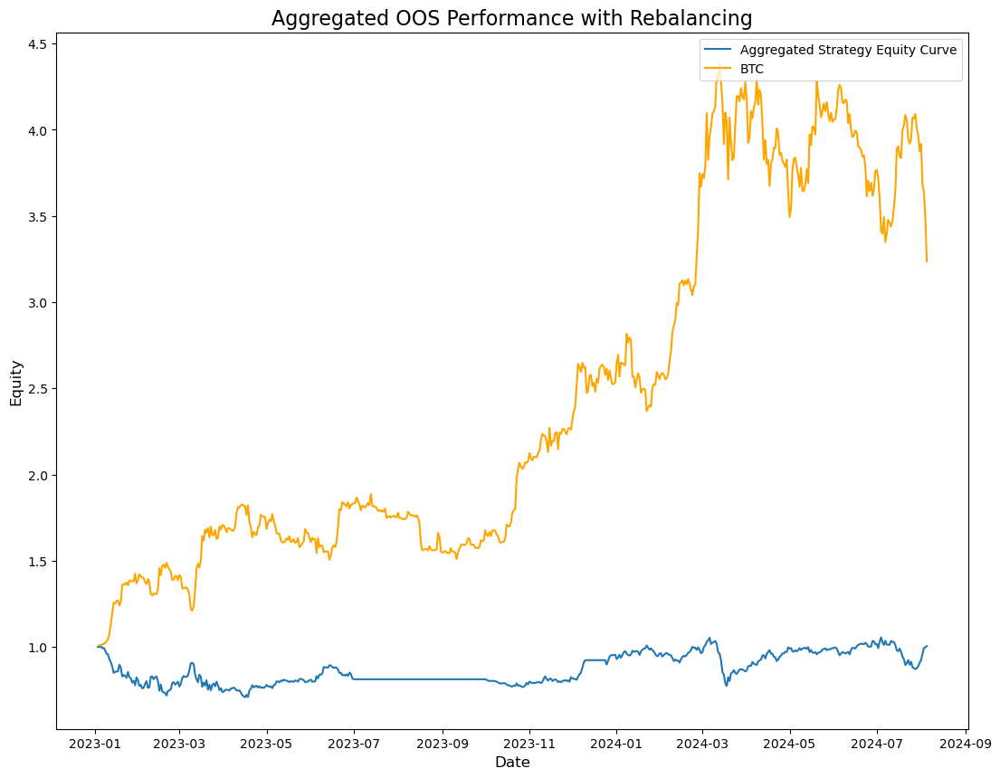

In [ ]:
# Use fixed z-score


# =============================================================================
# PARAMETERS & SETUP
# =============================================================================

formation_window = 365      # days used for estimation (PCA & cointegration)
rebalance_freq   = '90D'     # Rebalancing frequency (every 3 months)
start_rebal_date = "2023-01-02"  # First rebalancing date (also first estimation date)
end_date_str     = "2024-08-05"    # End of backtest period
backtest_inst =  PCAstratBacktest(10000, target_leverage = 1, tc_bps = 0, start_date = "2022-07-01", end_date = "2023-07-01")
entry_thresh = 1.5 # For strat

# Generate rebalancing dates as a DatetimeIndex.
rebal_dates = pd.date_range(start=start_rebal_date, end=end_date_str, freq=rebalance_freq)
print("Rebalancing dates:", rebal_dates)

# We will aggregate our equity across coins each period.
# aggregated_equity holds our capital allocated across coins.
aggregated_equity = 1.0  
agg_equity_curve = pd.Series(dtype=float)  # will build the aggregated equity curve over time

# Use the same column index for PC1 (e.g. second column, as before)
PC1_col_index = 0

# =============================================================================
# FIRST REBALANCING PERIOD
# =============================================================================

first_rebal_date = rebal_dates[0]
first_rebal_str  = first_rebal_date.strftime("%Y-%m-%d")

# Create a PrepareData instance for the formation period ending at the first rebal date.
PD_first = PrepareData(
    current_date = first_rebal_str,
    rebal_date   = first_rebal_str,
    window_size  = formation_window,
    parent_df    = parent_df
)
# Run PCA on the formation period with the new trading universe.
PCA_first = PerformPCA(PD_first)
eigportret_fp = PCA_first.eigportret_df.iloc[:, PC1_col_index]
eigport_fp    = PCA_first.Q.iloc[:, PC1_col_index]
current_tu    = PD_first.tu

# Define formation period: from (first_rebal_date - formation_window) to first_rebal_date.
formation_start = first_rebal_date - timedelta(days=formation_window)
formation_parent_fp = parent_df.loc[formation_start:first_rebal_str, current_tu]

# Compute returns over the formation period and build the PC1 (eigenportfolio) price series.
formation_returns = formation_parent_fp.pct_change().dropna()
parent_eigportret = formation_returns @ eigport_fp.values
PC1_series_fp = np.cumprod(1 + parent_eigportret)

# Define OOS period: from first_rebal_date to the next rebal date (or end date if none).
if len(rebal_dates) > 1:
    oos_end = rebal_dates[1]
else:
    oos_end = pd.to_datetime(end_date_str)
oos_str = first_rebal_str  # OOS period begins at first rebal date.
oos_parent = parent_df.loc[first_rebal_str:oos_end, current_tu]
oos_returns = oos_parent.pct_change().dropna()
parent_eigportret_oos = oos_returns @ eigport_fp.values
PC1_series_oos = np.cumprod(1 + parent_eigportret_oos)

# Run cointegration tests (using your function) on the formation period.
df_results = compute_cointegration_results(
    parent_df    = parent_df,
    current_date = first_rebal_str,
    window_size  = formation_window,
    rebal_date   = first_rebal_str
)
# Select coins with ADF p-values ≤ 0.1 in both directions.
coint_coins = list(df_results[(df_results["pval_dir1"] <= 0.1) & 
                              (df_results["pval_dir2"] <= 0.1)]["coin"].values)
print("Initial cointegrated coins:", coint_coins)

# Allocate aggregated equity equally among selected coins.
n_coins = len(coint_coins)
if n_coins == 0:
    print("No coin selected in first period. Exiting.")
    exit()
allocation = aggregated_equity / n_coins

# Simulate each coin’s trading in the OOS period.
coin_eq_curves = {}  # individual equity curves for this period
final_equity_values = {}
for coin in coint_coins:
    best_direction = df_results.loc[df_results["coin"] == coin, "best_direction"].values[0]
    beta0, beta1, form_mean, form_std = rolling_regression(
         coin_series     = formation_parent_fp[coin],
         pc1_series      = PC1_series_fp,
         formation_start = formation_start,
         formation_end   = first_rebal_str,
         best_direction  = best_direction
    )
    # Compute the OOS spread for the coin.
    OOS_spread = compute_spread_out_of_sample(
         coin_series    = oos_parent[coin],
         pc1_series     = PC1_series_oos,
         beta1          = beta1,
         best_direction = best_direction
    )
    # Generate fixed z-score signals using formation spread statistics.
    fixedz_signal = generate_fixed_zscore_signals(
            spread      = OOS_spread,
            fixed_mean      = form_mean,
            fixed_std=  form_std,
            entry_thresh= entry_thresh
    )
    # Simulate trading over the OOS period.
    if best_direction == "coin -> PC1":
         OOS_ec, OOS_port_val, OOS_pos, OOS_qx_series, OOS_qy_series, OOS_ntrades = simulate_spread_dailyMTM(
              x_prices       = oos_parent[coin],
              y_prices       = PC1_series_oos,
              signals        = fixedz_signal,
              b              = beta1,
              fee_open       = 0,
              fee_close      = 0,
              initial_equity = allocation
         )
    else:
         OOS_ec, OOS_port_val, OOS_pos, OOS_qx_series, OOS_qy_series, OOS_ntrades = simulate_spread_dailyMTM(
              x_prices       = PC1_series_oos,
              y_prices       = oos_parent[coin],
              signals        = fixedz_signal,
              b              = beta1,
              fee_open       = 0,
              fee_close      = 0,
              initial_equity = allocation
         )
    coin_eq_curves[coin] = OOS_ec.copy()
    final_equity_values[coin] = OOS_ec.iloc[-1]
    print(f"First period - {coin} performance: {backtest_inst.compute_performance(OOS_ec)}")

# Aggregate the equity curves for the period (sum over coins).
aligned_coin_eq = pd.concat(coin_eq_curves.values(), axis=1)
agg_eq_curve_period = aligned_coin_eq.sum(axis=1)
# Update aggregated equity to be the last value of the aggregated curve.
aggregated_equity = agg_eq_curve_period.iloc[-1]
agg_equity_curve = agg_eq_curve_period.copy()

# =============================================================================
# SUBSEQUENT REBALANCING PERIODS
# =============================================================================

for r in range(1, len(rebal_dates)):
    rebal_date = rebal_dates[r]
    rebal_date_str = rebal_date.strftime("%Y-%m-%d")
    formation_start = rebal_date - timedelta(days=formation_window)
    
    # Define OOS period: from current rebal date to the next rebal date (or end date).
    if r < len(rebal_dates)-1:
         oos_end = rebal_dates[r+1]
    else:
         oos_end = pd.to_datetime(end_date_str)
    oos_end_str = oos_end.strftime("%Y-%m-%d")
    
    print(f"\nRebalancing at {rebal_date_str}: Formation period {formation_start.strftime('%Y-%m-%d')} to {rebal_date_str}; OOS period {rebal_date_str} to {oos_end_str}")
    
    # Create a new PrepareData instance (with rebal_date) to extract the NEW trading universe.
    PD_new = PrepareData(
         current_date = rebal_date_str,
         rebal_date   = rebal_date_str,
         window_size  = formation_window,
         parent_df    = parent_df
    )
    PCA_new = PerformPCA(PD_new)
    eigportret_new = PCA_new.eigportret_df.iloc[:, PC1_col_index]
    eigport_new    = PCA_new.Q.iloc[:, PC1_col_index]
    current_tu_new = PD_new.tu
    
    # Formation period price data from the new universe.
    formation_parent_new = parent_df.loc[formation_start:rebal_date_str, current_tu_new]
    formation_returns_new = formation_parent_new.pct_change().dropna()
    parent_eigportret_new = formation_returns_new @ eigport_new.values
    PC1_series_fp_new = np.cumprod(1 + parent_eigportret_new)
    
    # OOS price data for the current period.
    oos_parent_new = parent_df.loc[rebal_date_str:oos_end_str, current_tu_new]
    oos_returns_new = oos_parent_new.pct_change().dropna()
    parent_eigportret_oos_new = oos_returns_new @ eigport_new.values
    PC1_series_oos_new = np.cumprod(1 + parent_eigportret_oos_new)
    
    # Run cointegration tests on the formation period in the new universe.
    df_results_new = compute_cointegration_results(
         parent_df    = parent_df,
         current_date = rebal_date_str,
         window_size  = formation_window,
         rebal_date   = rebal_date_str
    )
    
    # Select coins that pass cointegration criteria in this period.
    selected_coins = list(df_results_new[(df_results_new["pval_dir1"]<=0.1) & 
                                          (df_results_new["pval_dir2"]<=0.1)]["coin"].values)
    n_coins = len(selected_coins)
    if n_coins == 0:
         print(f"No coin selected at {rebal_date_str}. Aggregated equity remains unchanged.")
         # For plotting, fill period with constant equity.
         period_dates = pd.date_range(start=rebal_date_str, end=oos_end_str)
         agg_eq_curve_period = pd.Series(aggregated_equity, index=period_dates)
         agg_equity_curve = pd.concat([agg_equity_curve, agg_eq_curve_period])
         continue
         
    # Allocate the current aggregated equity equally among selected coins.
    allocation = aggregated_equity / n_coins
    coin_eq_curves = {}
    for coin in selected_coins:
         coin_result_new = df_results_new[df_results_new["coin"]==coin]
         if coin_result_new.empty:
             continue
         if not ((coin_result_new["pval_dir1"].values[0] <= 0.1) and (coin_result_new["pval_dir2"].values[0] <= 0.1)):
             continue
         best_direction_new = coin_result_new["best_direction"].values[0]
         beta0, beta1, form_mean, form_std = rolling_regression(
             coin_series     = formation_parent_new[coin],
             pc1_series      = PC1_series_fp_new,
             formation_start = formation_start,
             formation_end   = rebal_date_str,
             best_direction  = best_direction_new
         )
         OOS_spread_new = compute_spread_out_of_sample(
             coin_series    = oos_parent_new[coin],
             pc1_series     = PC1_series_oos_new,
             beta1          = beta1,
             best_direction = best_direction_new
         )
         fixedz_signal_new  = generate_fixed_zscore_signals(
                    spread      = OOS_spread_new,
                   fixed_mean   = form_mean,
                    fixed_std = form_std,
                    entry_thresh = entry_thresh
         )
         if best_direction_new == "coin -> PC1":
             OOS_ec_new, OOS_port_val_new, OOS_pos_new, OOS_qx_series_new, OOS_qy_series_new, OOS_ntrades_new = simulate_spread_dailyMTM(
                 x_prices       = oos_parent_new[coin],
                 y_prices       = PC1_series_oos_new,
                 signals        = fixedz_signal_new,
                 b              = beta1,
                 fee_open       = 0,
                 fee_close      = 0,
                 initial_equity = allocation
             )
         else:
             OOS_ec_new, OOS_port_val_new, OOS_pos_new, OOS_qx_series_new, OOS_qy_series_new, OOS_ntrades_new = simulate_spread_dailyMTM(
                 x_prices       = PC1_series_oos_new,
                 y_prices       = oos_parent_new[coin],
                 signals        = fixedz_signal_new,
                 b              = beta1,
                 fee_open       = 0,
                 fee_close      = 0,
                 initial_equity = allocation
             )
         coin_eq_curves[coin] = OOS_ec_new.copy()
         print(f"Rebal {rebal_date_str} - {coin} performance: {backtest_inst.compute_performance(OOS_ec_new)}")
    # Aggregate the equity curves for this period by averaging over coins.
    aligned_coin_eq = pd.concat(coin_eq_curves.values(), axis=1)
    agg_eq_curve_period = aligned_coin_eq.sum(axis=1)
    # Update aggregated_equity as the final value of the aggregated curve.
    aggregated_equity = agg_eq_curve_period.iloc[-1]
    agg_equity_curve = pd.concat([agg_equity_curve, agg_eq_curve_period])
    
# =============================================================================
# PLOTTING THE AGGREGATED EQUITY CURVE
# =============================================================================

agg_equity_curve = agg_equity_curve.sort_index()
plt.figure(figsize=(13,10))
plt.plot(agg_equity_curve, label="Aggregated Strategy Equity Curve")
benchmark = np.cumprod(1 + fifr.parent_df.loc[agg_equity_curve.index, "bitcoin"].pct_change().dropna())
plt.plot(benchmark, label="BTC", color="orange")
plt.xlabel("Date", fontsize=12)
plt.ylabel("Equity", fontsize=12)
plt.title("Aggregated OOS Performance with Rebalancing", fontsize=16)
plt.legend(loc="upper right")
plt.show()